#    **PROJECT TITLE:- Enhancing Anti-Money Laundering (AML) Compliance and Detection Using Machine Learning and Deep Learning Techniques**

**Dataset Link**:- https://www.kaggle.com/datasets/berkanoztas/synthetic-transaction-monitoring-dataset-aml

**Colab Notebook Link:** https://colab.research.google.com/drive/1pszIo1J03wPOOTAu5MMKJngqhv3VN0lB

#    **INTRODUCTION:**

The project explores a dataset containing anonymized transactional data, including sender/receiver behaviors, transaction amounts, and associated currencies. The dataset serves as the basis for training and testing various models to identify laundering patterns. This involves data preprocessing, feature selection, and the application of advanced ML and DL models to enhance the detection of money laundering.

We have employed a comparative approach to evaluate the performance of four models:



1.   Random Forest (RF): A robust machine learning model based on decision trees, capable of handling class imbalances.




2.   Extreme Gradient Boosting (XGBoost): An optimized gradient-boosting algorithm tailored for high accuracy and computational efficiency.




3. Temporal Convolutional Network (TCN): A deep learning model leveraging sequential data patterns for precise transaction classification.

4. TCN with Attention Mechanism: An enhanced TCN model that integrates attention layers to prioritize significant features, further refining performance.

The project evaluates these models using metrics such as accuracy, precision, recall, F1-score, and ROC-AUC. Additionally, techniques like SMOTE (Synthetic Minority Oversampling Technique) and hyperparameter tuning are employed to address class imbalances and optimize model performance. The outcomes are benchmarked to identify the most effective model for AML use cases.

#**STEP-1 : Loading the Dataset**

Importing essential libraries which will be used in the initial phase of this project, mounts Google Drive, and loads the dataset into a pandas DataFrame.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras import regularizers
from google.colab import drive

Since the dataset size is enouromous, therefore the datset is stored in my Google Drive, so mounting the google drive to load the dataset

In [ ]:
# Mounting Google Drive
drive.mount('/content/drive')

In [ ]:
# Specifying the path to the raw dataset file
file_path = '/content/drive/My Drive/SAML-D.csv'

Mounted at /content/drive


In [ ]:
# Reading the CSV file into a DataFrame
df = pd.read_csv(file_path)

In [ ]:
# Displaying the first few rows of the dataframe
df.head()

,Time,Date,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
0,10:35:19,2022-10-07,8724731955,2769355426,1459.15,UK pounds,UK pounds,UK,UK,Cash Deposit,0,Normal_Cash_Deposits
1,10:35:20,2022-10-07,1491989064,8401255335,6019.64,UK pounds,Dirham,UK,UAE,Cross-border,0,Normal_Fan_Out
2,10:35:20,2022-10-07,287305149,4404767002,14328.44,UK pounds,UK pounds,UK,UK,Cheque,0,Normal_Small_Fan_Out
3,10:35:21,2022-10-07,5376652437,9600420220,11895.00,UK pounds,UK pounds,UK,UK,ACH,0,Normal_Fan_In
4,10:35:21,2022-10-07,9614186178,3803336972,115.25,UK pounds,UK pounds,UK,UK,Cash Deposit,0,Normal_Cash_Deposits


RAW DATASET HEAD

In [ ]:
df.head(1000)

,Time,Date,Sender_account,Receiver_account,Amount,Payment_currency,Received_currency,Sender_bank_location,Receiver_bank_location,Payment_type,Is_laundering,Laundering_type
0,10:35:19,2022-10-07,8724731955,2769355426,1459.15,UK pounds,UK pounds,UK,UK,Cash Deposit,0,Normal_Cash_Deposits
1,10:35:20,2022-10-07,1491989064,8401255335,6019.64,UK pounds,Dirham,UK,UAE,Cross-border,0,Normal_Fan_Out
2,10:35:20,2022-10-07,287305149,4404767002,14328.44,UK pounds,UK pounds,UK,UK,Cheque,0,Normal_Small_Fan_Out
3,10:35:21,2022-10-07,5376652437,9600420220,11895.00,UK pounds,UK pounds,UK,UK,ACH,0,Normal_Fan_In
4,10:35:21,2022-10-07,9614186178,3803336972,115.25,UK pounds,UK pounds,UK,UK,Cash Deposit,0,Normal_Cash_Deposits
...,...,...,...,...,...,...,...,...,...,...,...,...
995,11:11:37,2022-10-07,4357702926,5688491007,21378.85,UK pounds,UK pounds,UK,UK,Cheque,0,Normal_Small_Fan_Out
996,11:11:38,2022-10-07,8333589663,1465487567,16467.69,UK pounds,UK pounds,UK,UK,Credit card,0,Normal_Fan_In
997,11:11:38,2022-10-07,4622157955,3091109715,12104.43,UK pounds,UK pounds,UK,UK,ACH,0,Normal_Small_Fan_Out
998,11:11:41,2022-10-07,7479901615,1102186400,317.29,UK pounds,UK pounds,UK,UK,Cheque,0,Normal_Small_Fan_Out


In [ ]:
df.shape

(9504852, 12)

#**Step-2: Analyisis of RAW dataset**

Importing essential libariries for the Analysis of Raw Dataset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy import stats
from matplotlib.ticker import FuncFormatter
from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans

DATA SUMMARY & STATS

In [ ]:
# Basic descriptive statistics
print(df.describe())

# Dataset shape and data types
print("Dataset Shape:", df.shape)
print("Data Types:\n", df.info())

       Sender_account  Receiver_account        Amount  Is_laundering
count    9.504852e+06      9.504852e+06  9.504852e+06   9.504852e+06
mean     5.006619e+09      5.006006e+09  8.762968e+03   1.038733e-03
std      2.885814e+09      2.884763e+09  2.561495e+04   3.221263e-02
min      9.018000e+03      9.018000e+03  3.730000e+00   0.000000e+00
25%      2.513133e+09      2.513219e+09  2.143688e+03   0.000000e+00
50%      5.001017e+09      5.002572e+09  6.113720e+03   0.000000e+00
75%      7.505051e+09      7.502397e+09  1.045846e+04   0.000000e+00
max      9.999987e+09      9.999971e+09  1.261850e+07   1.000000e+00
Dataset Shape: (9504852, 12)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9504852 entries, 0 to 9504851
Data columns (total 12 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   Time                    object 
 1   Date                    object 
 2   Sender_account          int64  
 3   Receiver_account        int64  
 4   Amount    

Missing Values Analysis

In [ ]:
# Missing Values Analysis

# Checking for missing values
missing_values = df.isnull().sum()
print("Missing Values in Each Column:\n", missing_values)

df_cleaned = df.dropna()

for col in numeric_columns:
    df[col].fillna(df[col].mean(), inplace=True)

Missing Values in Each Column:
 Time                      0
Date                      0
Sender_account            0
Receiver_account          0
Amount                    0
Payment_currency          0
Received_currency         0
Sender_bank_location      0
Receiver_bank_location    0
Payment_type              0
Is_laundering             0
Laundering_type           0
dtype: int64


<ipython-input-37-93b4bd31a60e>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)


Class Distribution to see the ratio of Legitimate vs Laundering transactions Ratio

<ipython-input-26-57201adec20d>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


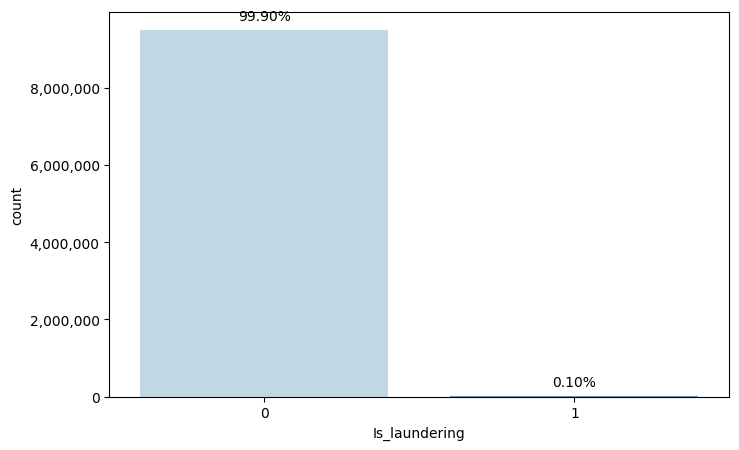

In [ ]:
# Class Distribution


def format_number(x, _):
    return f"{int(x):,}"  # Format numbers with commas

# Plot the distribution of the target variable 'Is_laundering'
plt.figure(figsize=(8, 5))
ax = sns.countplot(
    x='Is_laundering',
    data=df,
    palette='Blues',
    alpha=0.8
)

# Annotating bars with percentage values
for p in ax.patches:
    percentage = f"{100 * p.get_height() / len(df):.2f}%"
    ax.annotate(percentage,
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 10), textcoords='offset points')

# Formating the y-axis with actual numbers
ax.yaxis.set_major_formatter(FuncFormatter(format_number))

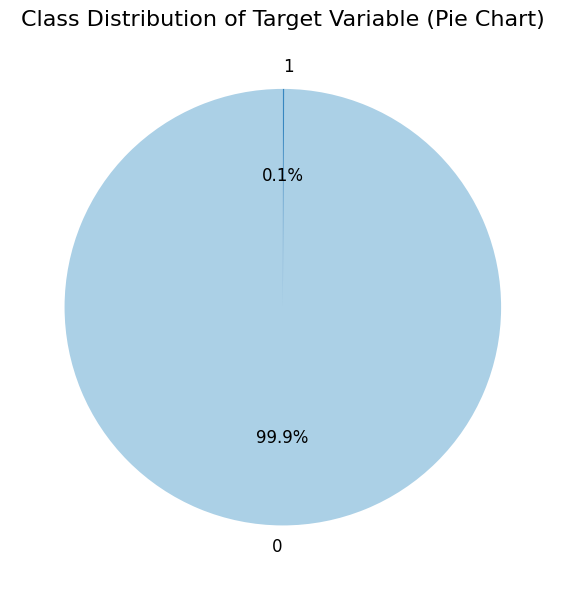

Class Distribution (%):
 Is_laundering
0    99.896127
1     0.103873
Name: proportion, dtype: float64


In [ ]:
# Pie chart for class distribution
plt.figure(figsize=(6, 6))
class_distribution.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colors=sns.color_palette('Blues', len(class_distribution)),
    textprops={'fontsize': 12}
)
plt.title('Class Distribution of Target Variable (Pie Chart)', fontsize=16)
plt.ylabel('')  # Hide the y-label
plt.tight_layout()
plt.show()

# Print the class distribution
print("Class Distribution (%):\n", class_distribution)

NUMERICAL Feature Analysis

In [ ]:
# Filtering for numeric columns for analysis
numeric_columns = df.select_dtypes(include=['number'])

In [ ]:
# Number of numeric columns
num_cols = len(numeric_columns.columns)

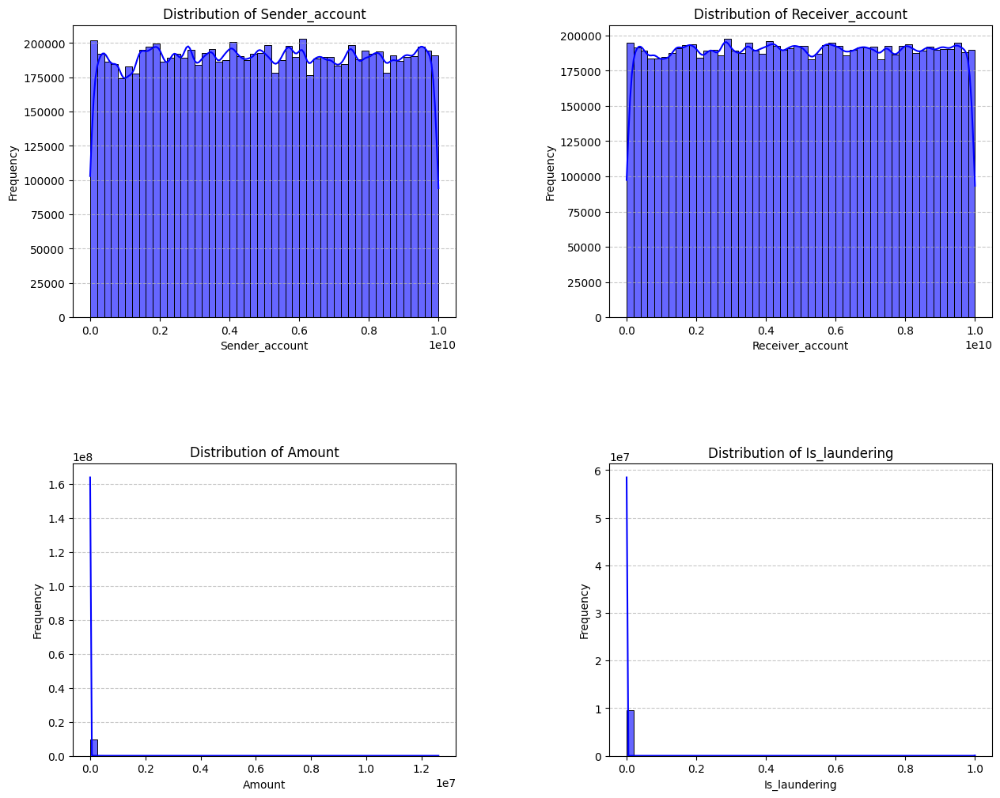

In [ ]:
# Feature Analysis


# Defining the grid size (rows and columns)
grid_size = math.ceil(math.sqrt(num_cols))  # Create a square grid

# Creating subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 12))
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Ploting each histogram with KDE in the grid
for i, col in enumerate(numeric_columns.columns):
    sns.histplot(
        df[col],
        bins=50,
        kde=True,
        color='blue',
        alpha=0.6,
        ax=axes[i]
    )
    axes[i].set_title(f'Distribution of {col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

# Hiding any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adding spacing between plots
fig.subplots_adjust(hspace=0.5, wspace=0.4)  # Adjust vertical (hspace) and horizontal (wspace) spacing

plt.show()

In [ ]:
# Additional pairplot to visualize relationships among numeric columns
if len(numeric_columns.columns) > 1:
    sns.pairplot(df[numeric_columns.columns], diag_kind='kde', plot_kws={'alpha': 0.5})
    plt.suptitle("Pairplot of Numeric Features", y=1.02, fontsize=18)
    plt.tight_layout()
    plt.show()

Visualizing Outliers in Numeric Columns Using Boxplots

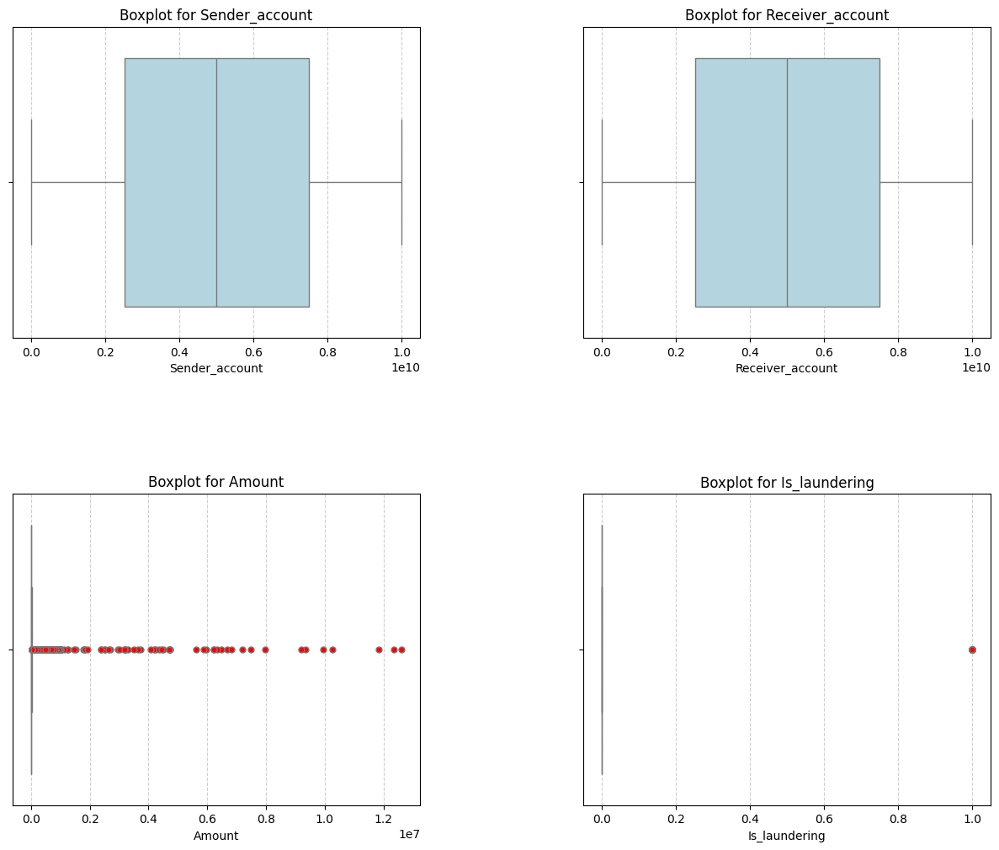

In [ ]:
# Boxplot for detecting outliers in numeric columns

# Number of numeric columns
num_cols = len(numeric_columns.columns)

# Defining grid size (R & C)
grid_size = math.ceil(math.sqrt(num_cols))  # Creating a square grid

# Creating subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 12))
axes = axes.flatten()  # Flattening the axes array for easy indexing

# Ploting each boxplot in the grid
for i, col in enumerate(numeric_columns.columns):
    sns.boxplot(
        x=df[col],
        ax=axes[i],
        color='lightblue',
        flierprops={'marker': 'o', 'markersize': 5, 'markerfacecolor': 'red'}
    )
    axes[i].set_title(f'Boxplot for {col}', fontsize=12)
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].grid(axis='x', linestyle='--', alpha=0.6)

# Hiding any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adding spacing between plots
fig.subplots_adjust(hspace=0.5, wspace=0.4)

plt.show()

Correlation Heatmap for Exploring Relationships Among Numerical Features

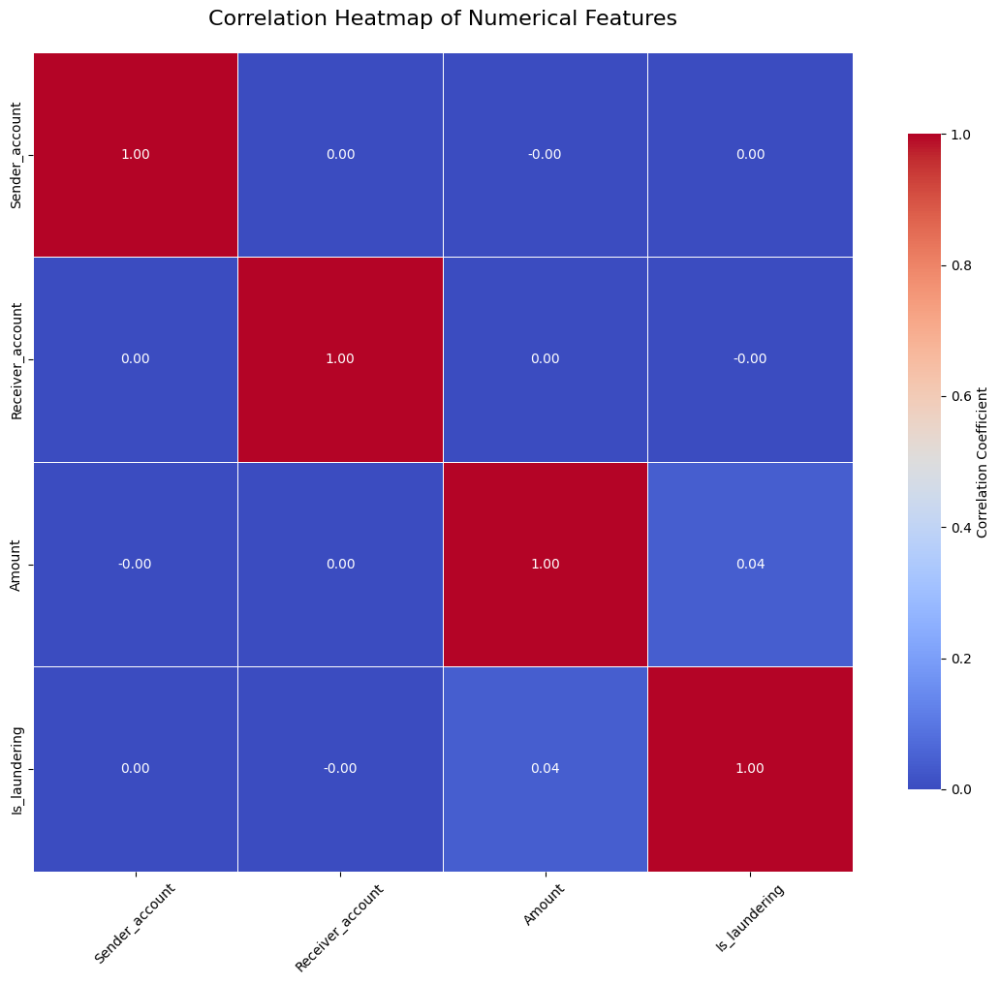

In [ ]:
# Correlation heatmap for numerical features

plt.figure(figsize=(12, 10))
corr_matrix = numeric_columns.corr()

# Creating the heatmap with enhancements
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt='.2f',  # Limit decimal places in annotations
    cmap='coolwarm',
    linewidths=0.5,
    square=True,  # Ensuring each cell is square-shaped
    cbar_kws={"shrink": 0.8, "label": "Correlation Coefficient"}
)

# Enhancing the overall aesthetics
plt.title('Correlation Heatmap of Numerical Features', fontsize=16, pad=20)
plt.xticks(rotation=45, fontsize=10)  # Rotate and format x-axis labels
plt.yticks(fontsize=10)  # Format y-axis labels
plt.tight_layout()
plt.show()

Distribution of Categorical Variables

In [ ]:


# Defining categorical columns from the raw dataset
categorical_columns = [
    'Sender_bank_location',
    'Receiver_bank_location',
    'Payment_currency',
    'Received_currency',
    'Payment_type',
    'Laundering_type'
]

In [ ]:

# Grouping small categories into "Other" for better visualization
def group_small_categories(df, col, threshold=10000):
    counts = df[col].value_counts()
    large_categories = counts[counts > threshold].index
    df[col] = df[col].apply(lambda x: x if x in large_categories else 'Other')
    return df

# Adjusting columns with many small categories
for col in ['Sender_bank_location', 'Receiver_bank_location']:
    df = group_small_categories(df, col)


Percentage Distribution of Categorical Variables Using Bar Charts

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


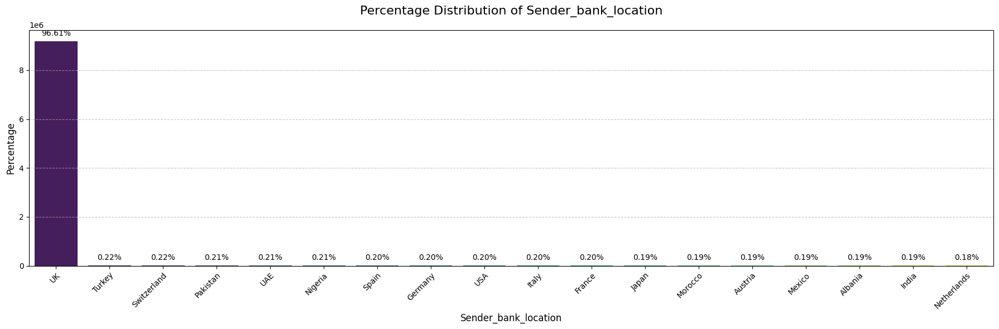

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


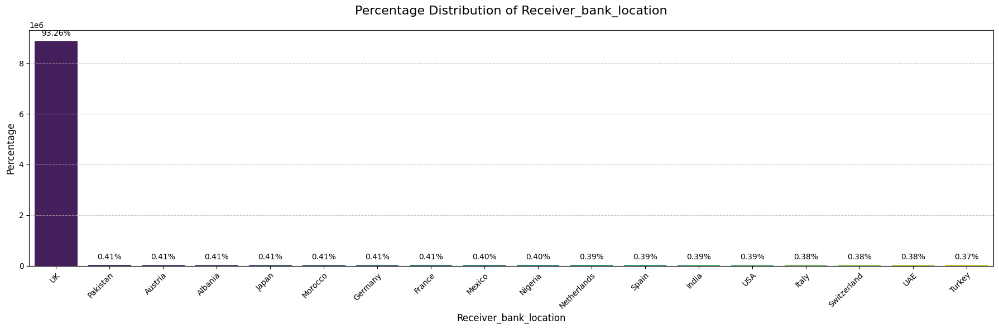

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


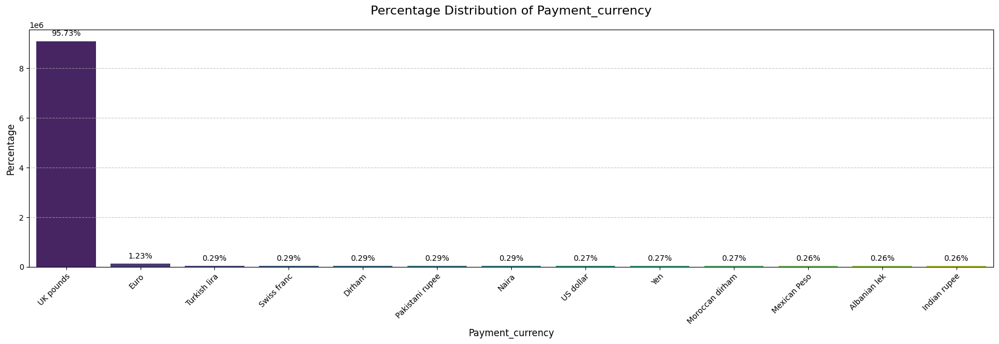

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


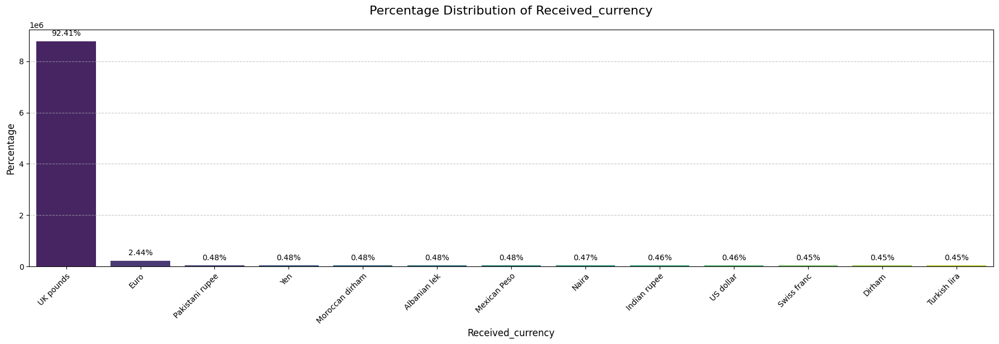

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


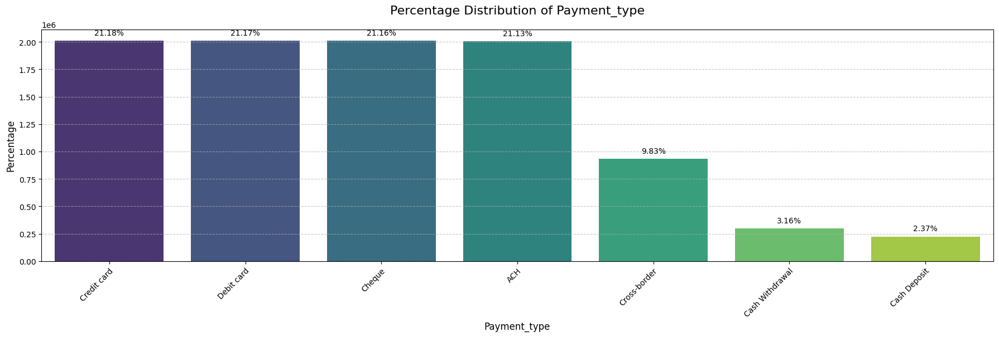

<ipython-input-36-8ab0591a526d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


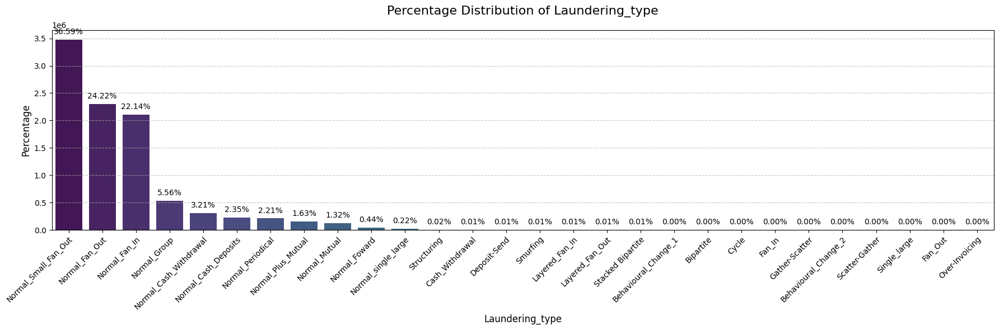

In [ ]:
# Ploting bar charts for all categorical variables with percentages
for col in categorical_columns:
    plt.figure(figsize=(18, 6))  # Wider figure for better readability
    total = len(df)  # Total number of rows for percentage calculation
    ax = sns.countplot(
        x=col,
        data=df,
        order=df[col].value_counts().index,
        palette='viridis'
    )

    # Annotating bars with percentages
    for p in ax.patches:
        percentage = f"{100 * p.get_height() / total:.2f}%"  # Calculate percentage
        ax.annotate(
            percentage,
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center', fontsize=10, color='black',
            xytext=(0, 10), textcoords='offset points'
        )

    # Enhancing aesthetics
    plt.title(f'Percentage Distribution of {col}', fontsize=16, pad=20)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Percentage', fontsize=12)
    plt.xticks(rotation=45, fontsize=10, ha='right', wrap=True)  # Rotate and align labels
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

Exploring Relationships Between Key Features Using Pairplot

<ipython-input-41-ced0ccdefca7>:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sampled = df.groupby('Is_laundering', group_keys=False).apply(


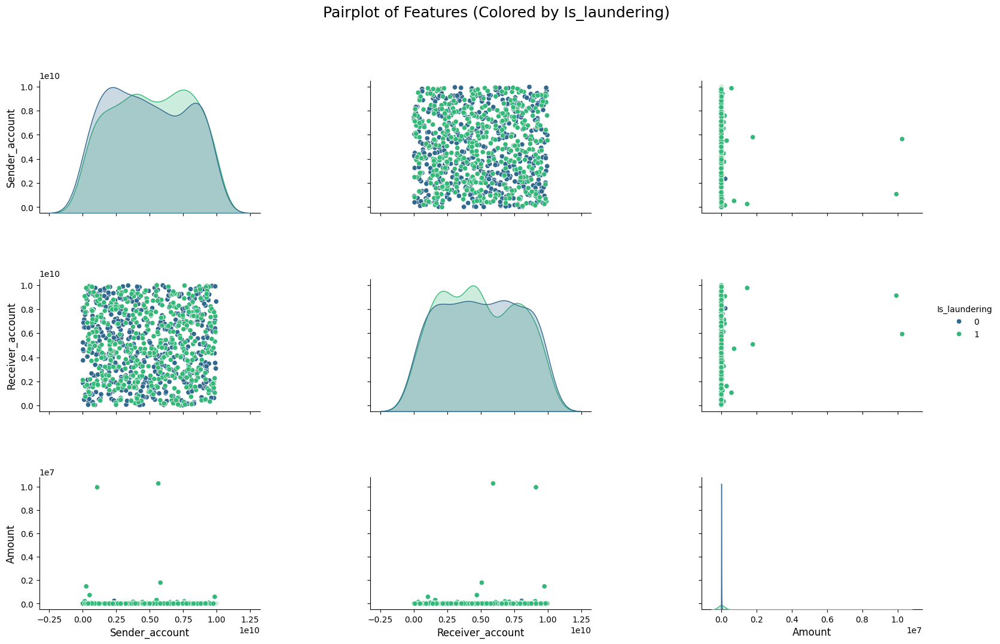

In [ ]:

# Stratified sampling for visualization purposes
df_sampled = df.groupby('Is_laundering', group_keys=False).apply(
    lambda x: x.sample(min(len(x), 500), random_state=42)
)

# Defining variables for the pairplot
vars = ['Sender_account', 'Receiver_account', 'Amount']

# Creating the pairplot with better spacing and aesthetics
pairplot = sns.pairplot(
    df_sampled,
    vars=vars,
    hue='Is_laundering',
    diag_kind='kde',
    palette='viridis',
    height=3.5,
    aspect=1.5
)

# Adding title and adjust layout to add more space between graphs
pairplot.fig.suptitle("Pairplot of Features (Colored by Is_laundering)", y=1.02, fontsize=18)
pairplot.fig.subplots_adjust(top=0.9, hspace=0.5, wspace=0.5)  # Add spacing between graphs

# Adding axis labels with appropriate font sizes
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)
    ax.tick_params(axis='both', labelsize=10)

plt.show()

Boxplot Analysis of Numeric Features Against Target Class for Identifying Distribution Patterns and Anomalies

<ipython-input-44-eafdef507514>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
<ipython-input-44-eafdef507514>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
<ipython-input-44-eafdef507514>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)


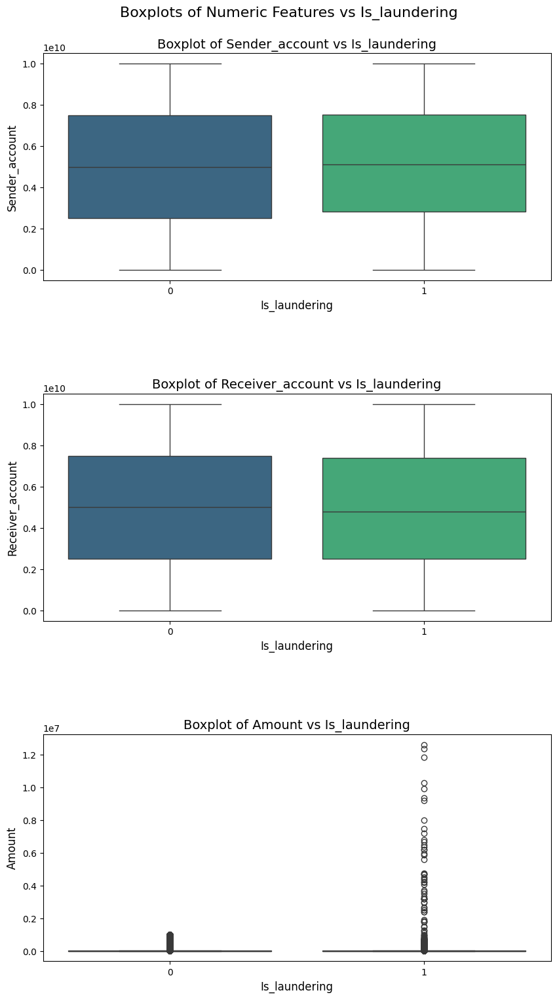

In [ ]:

# Defining numeric columns based on analysis
numeric_columns = ['Sender_account', 'Receiver_account', 'Amount']


# Ploting boxplots in a single-column layout (one after another)
fig, axes = plt.subplots(len(numeric_columns), 1, figsize=(10, len(numeric_columns) * 6))  # Adjusting height dynamically
for ax, col in zip(axes, numeric_columns):
    sns.boxplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
    ax.set_title(f'Boxplot of {col} vs Is_laundering', fontsize=14)
    ax.set_xlabel('Is_laundering', fontsize=12)
    ax.set_ylabel(col, fontsize=12)
plt.suptitle("Boxplots of Numeric Features vs Is_laundering", fontsize=16, y=0.92)
plt.subplots_adjust(hspace=0.5)  # Adding vertical spacing between plots
plt.show()

Analysis of Numeric Features Against Target Class Using Violen Plots

<ipython-input-45-20efb2fb5852>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
<ipython-input-45-20efb2fb5852>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
<ipython-input-45-20efb2fb5852>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)


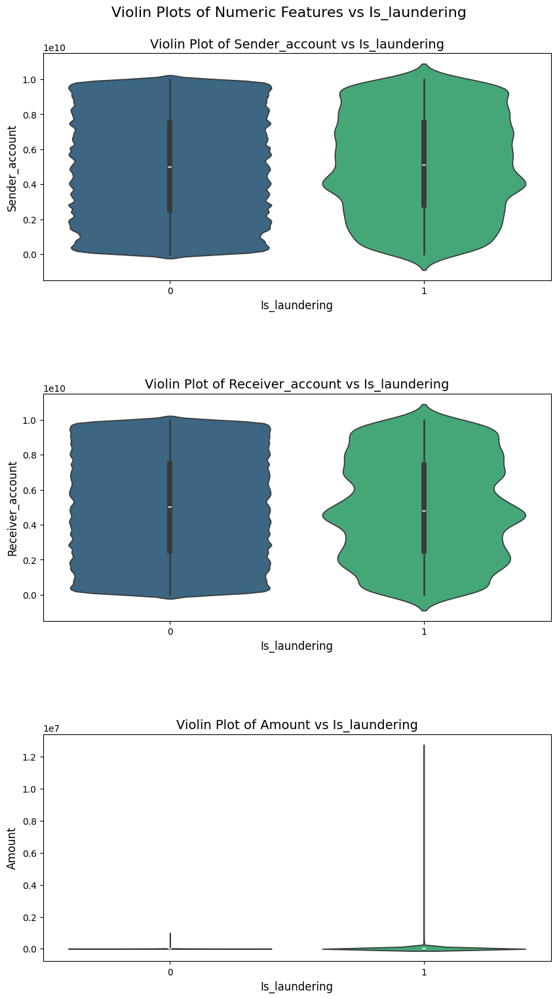

In [ ]:


# Ploting violin plots in a single-column layout (one after another)
fig, axes = plt.subplots(len(numeric_columns), 1, figsize=(10, len(numeric_columns) * 6))
for ax, col in zip(axes, numeric_columns):
    sns.violinplot(x='Is_laundering', y=col, data=df, palette='viridis', ax=ax)
    ax.set_title(f'Violin Plot of {col} vs Is_laundering', fontsize=14)
    ax.set_xlabel('Is_laundering', fontsize=12)
    ax.set_ylabel(col, fontsize=12)
plt.suptitle("Violin Plots of Numeric Features vs Is_laundering", fontsize=16, y=0.92)
plt.subplots_adjust(hspace=0.5)
plt.show()

Feature-Target Relationship Analysis Using Chi-Square and T-Tests for Identifying Statistical Significance

In [ ]:
# Feature-Target Relationships


# Chi-square test for categorical features
for col in categorical_columns:
    contingency_table = pd.crosstab(df[col], df['Is_laundering'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f'Chi-square Test for {col}: Chi2={chi2}, p-value={p}')

# t-tests for numerical features with the target variable
for col in numeric_columns:
    group_0 = df[df['Is_laundering'] == 0][col]
    group_1 = df[df['Is_laundering'] == 1][col]
    t_stat, p_val = stats.ttest_ind(group_0, group_1)
    print(f'T-test for {col}: t-statistic={t_stat}, p-value={p_val}')

Chi-square Test for Sender_bank_location: Chi2=329.0646760634946, p-value=1.0948024751480456e-59
Chi-square Test for Payment_currency: Chi2=1021.4938326652416, p-value=4.482746309732999e-211
T-test for Sender_account: t-statistic=-4.900506601685188, p-value=9.559141436414671e-07
T-test for Receiver_account: t-statistic=1.1763160185015433, p-value=0.2394686464900364
T-test for Amount: t-statistic=-123.61460489967246, p-value=0.0
T-test for Is_laundering: t-statistic=-inf, p-value=0.0


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


Cluster Analysis for Grouping Transactions Based on Key Features

In [ ]:
# Selecting relevant numeric columns for clustering
numeric_columns = ['Sender_account', 'Receiver_account', 'Amount']

# Applying KMeans clustering on the selected numeric columns
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(df[numeric_columns])

# Adding cluster labels to the DataFrame
df['Cluster'] = clusters

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


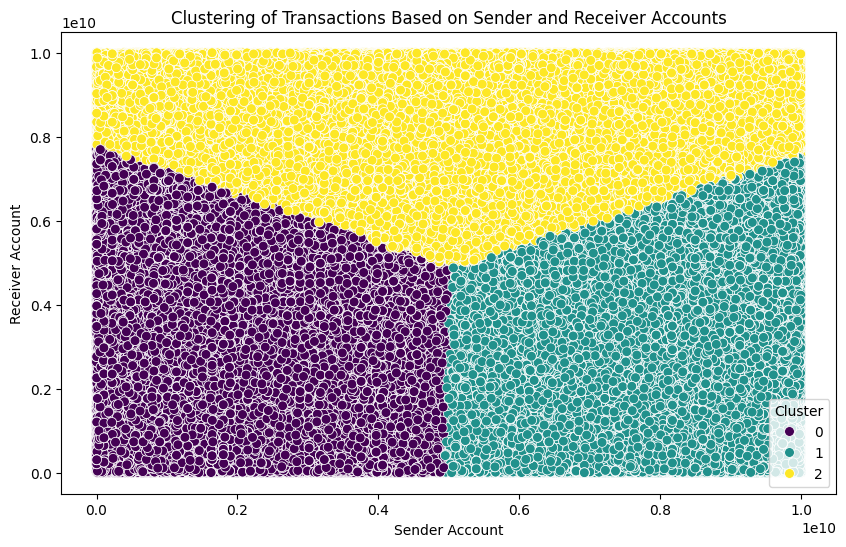

<ipython-input-13-ff19279f19bd>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='Amount', data=df, palette='viridis')


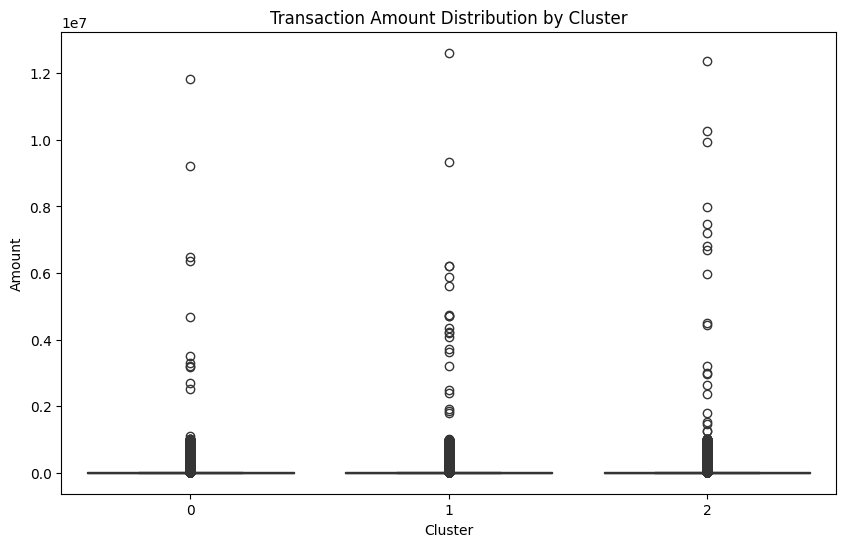

In [ ]:
# Visualizing clusters based on Sender_account and Receiver_account
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Sender_account', y='Receiver_account', hue='Cluster', data=df, palette='viridis', s=50)
plt.title("Clustering of Transactions Based on Sender and Receiver Accounts")
plt.xlabel("Sender Account")
plt.ylabel("Receiver Account")
plt.show()

# Visualizing clusters based on Amount
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cluster', y='Amount', data=df, palette='viridis')
plt.title("Transaction Amount Distribution by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Amount")
plt.show()

# **Step 3: Acquiring the Preprocessed/ Feature Engineered Dataset**

In [ ]:
# Importing necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

Data Preprocessing and Feature Transformation Pipeline

In [ ]:
# Defining categorical and numerical features based on the raw dataset
categorical_features = ['Payment_currency', 'Received_currency', 'Sender_bank_location', 'Receiver_bank_location', 'Payment_type', 'Laundering_type']
numeric_features = ['Sender_account', 'Receiver_account', 'Amount']


In [ ]:
# Defining the ColumnTransformer for preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(sparse_output=False), categorical_features)
    ]
)

In [ ]:
# Fiting and transform the data using the preprocessor
X = df.drop(columns=['Is_laundering'])  # Retain Time and Date in the dataset for feature engineering
X_processed = preprocessor.fit_transform(X.drop(columns=['Time', 'Date']))  # Preprocess only the relevant features

In [ ]:
# Extract feature names after one-hot encoding
encoded_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(encoded_feature_names)

In [ ]:
# Create a DataFrame with the processed data
X_processed_df = pd.DataFrame(X_processed, columns=all_feature_names)

# Add the target variable back to the processed DataFrame
X_processed_df['Is_laundering'] = df['Is_laundering'].values

In [ ]:
X_processed_df.head(1000)

,Sender_account,Receiver_account,Amount,Payment_currency_Albanian lek,Payment_currency_Dirham,Payment_currency_Euro,Payment_currency_Indian rupee,Payment_currency_Mexican Peso,Payment_currency_Moroccan dirham,Payment_currency_Naira,...,Laundering_type_Normal_Plus_Mutual,Laundering_type_Normal_Small_Fan_Out,Laundering_type_Normal_single_large,Laundering_type_Over-Invoicing,Laundering_type_Scatter-Gather,Laundering_type_Single_large,Laundering_type_Smurfing,Laundering_type_Stacked Bipartite,Laundering_type_Structuring,Is_laundering
0,1.288410,-0.775333,-0.285139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,-1.217899,1.176959,-0.107099,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,-1.635350,-0.208419,0.217274,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.128225,1.592649,0.122274,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.596627,-0.416904,-0.337604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.224864,0.236583,0.492520,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
996,1.152871,-1.227317,0.300790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
997,-0.133225,-0.663797,0.130450,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
998,0.857048,-1.353255,-0.329717,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


TIME AND DATE FEATURE ENGINEERING - Adding temporal features

In [ ]:

# Extracting hour of transaction
df['Transaction_hour'] = pd.to_datetime(df['Time'], format='%H:%M:%S').dt.hour  # Extract hour

# Extracting day of the week (0 = Monday, 6 = Sunday)
df['Transaction_weekday'] = pd.to_datetime(df['Date']).dt.weekday

# Adding a binary flag for weekend transactions
df['Is_Weekend'] = df['Transaction_weekday'].isin([5, 6]).astype(int)


In [ ]:
# ing clusters of hours (e.g., night, morning, afternoon, evening)
df['Time_Cluster'] = pd.cut(
    df['Transaction_hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    right=False
)


In [ ]:
# Time since the last transaction for each Sender_account
df['Transaction_Time_Since_Last'] = df.groupby('Sender_account')['Time'].apply(
    lambda x: (pd.to_datetime(x, format='%H:%M:%S') - pd.to_datetime(x, format='%H:%M:%S').shift(1)).dt.total_seconds()
).reset_index(level=0, drop=True).fillna(0)

Feature Engineering for Transaction Behavior Analysis

In [ ]:
#  Transaction frequency for Sender and Receiver
df['Sender_account_freq'] = df['Sender_account'].map(df['Sender_account'].value_counts())
df['Receiver_account_freq'] = df['Receiver_account'].map(df['Receiver_account'].value_counts())

#  Average transaction value for Sender and Receiver
df['Sender_avg_amount'] = df.groupby('Sender_account')['Amount'].transform('mean')
df['Receiver_avg_amount'] = df.groupby('Receiver_account')['Amount'].transform('mean')


# Ratio of current transaction amount to Sender and Receiver average transaction amount
df['Amount_to_Sender_avg_ratio'] = df['Amount'] / (df['Sender_avg_amount'] + 1)
df['Amount_to_Receiver_avg_ratio'] = df['Amount'] / (df['Receiver_avg_amount'] + 1)


Feature Engineering for Risk and Transaction Profiling

In [ ]:
# Flag for high-risk Sender and Receiver countries
high_risk_countries = ['Pakistan', 'Nigeria', 'Turkey']
df['Sender_high_risk'] = df['Sender_bank_location'].isin(high_risk_countries).astype(int)
df['Receiver_high_risk'] = df['Receiver_bank_location'].isin(high_risk_countries).astype(int)

# Flag for high-risk currencies
high_risk_currencies = ['Dirham', 'Naira', 'Pakistani rupee']
df['High_risk_currency'] = df['Payment_currency'].isin(high_risk_currencies).astype(int)

# Dynamic large transaction flag
large_transaction_threshold = df['Amount'].quantile(0.95)  # Top 5% as large
df['Is_large_transaction'] = (df['Amount'] > large_transaction_threshold).astype(int)

Feature Engineering for Temporal Patterns in Transaction Behavior

In [ ]:
# Rolling metrics for transactions (7-day window)
df['Rolling_7D_Transaction_Sum'] = df.groupby('Sender_account')['Amount'].rolling(
    window=7, min_periods=1
).sum().reset_index(0, drop=True)

df['Rolling_7D_Transaction_Count'] = df.groupby('Sender_account')['Amount'].rolling(
    window=7, min_periods=1
).count().reset_index(0, drop=True)


Feature Engineering for Relationship Dynamics Between Sender and Receiver

In [ ]:
# Sender-Receiver Frequency Ratio
df['Sender_Receiver_Freq_Ratio'] = (
    df['Sender_account_freq'] / (df['Receiver_account_freq'] + 1e-9)  # Add small constant to avoid division by zero
)

#  Unique Sender-Receiver Pairs
df['Unique_Sender_Receiver_Pairs'] = df.groupby('Sender_account')['Receiver_account'].nunique()



Feature Engineering: Outlier Detection in Transaction Amounts

In [ ]:
#  Flagging transaction amounts as outliers based on z-scores
df['Amount_Outlier'] = ((df['Amount'] - df['Amount'].mean()) / df['Amount'].std()).abs() > 3

Updated Preprocessing Pipeline after the additional features - Transforming Data for Enhanced Model Training

In [ ]:
# PREPROCESSING PIPELINE

# Defining categorical and numerical features
categorical_features = ['Payment_currency', 'Received_currency', 'Sender_bank_location',
                        'Receiver_bank_location', 'Payment_type', 'Laundering_type', 'Time_Cluster']
numeric_features = ['Sender_account', 'Receiver_account', 'Amount',
                    'Sender_account_freq', 'Receiver_account_freq',
                    'Sender_avg_amount', 'Receiver_avg_amount',
                    'Amount_to_Sender_avg_ratio', 'Amount_to_Receiver_avg_ratio',
                    'Transaction_Time_Since_Last', 'Rolling_7D_Transaction_Sum',
                    'Rolling_7D_Transaction_Count', 'Sender_Receiver_Freq_Ratio']


In [ ]:
# Defining the ColumnTransformer for preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(sparse_output=False), categorical_features)
    ]
)


In [ ]:
# Fit and transforming the data using the preprocessor
X = df.drop(columns=['Time', 'Date', 'Is_laundering'])
X_processed = preprocessor.fit_transform(X)

# Extract feature names after one-hot encoding
encoded_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numeric_features + list(encoded_feature_names)



In [ ]:
# Creating a DataFrame with the processed data
X_processed_df = pd.DataFrame(X_processed, columns=all_feature_names)

# Adding the target variable back to the processed DataFrame
X_processed_df['Is_laundering'] = df['Is_laundering'].values

Final preprocessed dataset head after feature engineering

In [ ]:
X_processed_df.head()

,Sender_account,Receiver_account,Amount,Sender_account_freq,Receiver_account_freq,Sender_avg_amount,Receiver_avg_amount,Amount_to_Sender_avg_ratio,Amount_to_Receiver_avg_ratio,Transaction_Time_Since_Last,...,Laundering_type_Scatter-Gather,Laundering_type_Single_large,Laundering_type_Smurfing,Laundering_type_Stacked Bipartite,Laundering_type_Structuring,Time_Cluster_Afternoon,Time_Cluster_Evening,Time_Cluster_Morning,Time_Cluster_Night,Is_laundering
0,1.288410,-0.775333,-0.285139,-1.311042,-0.408706,-1.135141,-0.047669,-0.091290,-1.652081,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,-1.217899,1.176959,-0.107099,0.969666,-0.553993,-0.472404,-0.125089,0.009391,0.000736,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,-1.635350,-0.208419,0.217274,-0.332238,-0.477076,0.230923,0.065155,0.173856,0.829062,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
3,0.128225,1.592649,0.122274,-1.339551,0.437373,0.521912,0.163314,-0.001494,-0.072592,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
4,1.596627,-0.416904,-0.337604,-1.353805,0.360457,-1.264840,0.050284,-0.379012,-2.013713,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


Saving Preprocessed Dataset with Engineered Features in my Google Drive

In [ ]:
# Saving the preprocessed dataset with engineered features
preprocessed_dataset_path = '/content/drive/My Drive/updated_pp_dataset.csv'
X_processed_df.to_csv(preprocessed_dataset_path, index=False)

print("Updated dataset with enhanced features saved successfully.")

Updated dataset with enhanced features saved successfully.


# Loading the Updated/Preprocessed Dataset

In [ ]:
import numpy as np
import pandas as pd



In [ ]:
# Loading the preprocessed dataset from Google Drive
preprocessed_dataset_path = '/content/drive/My Drive/updated_pp_dataset.csv'
processed_df = pd.read_csv(preprocessed_dataset_path)

In [ ]:
processed_df.head(1000)

,Sender_account,Receiver_account,Amount,Sender_account_freq,Receiver_account_freq,Sender_avg_amount,Receiver_avg_amount,Amount_to_Sender_avg_ratio,Amount_to_Receiver_avg_ratio,Transaction_Time_Since_Last,...,Laundering_type_Scatter-Gather,Laundering_type_Single_large,Laundering_type_Smurfing,Laundering_type_Stacked Bipartite,Laundering_type_Structuring,Time_Cluster_Afternoon,Time_Cluster_Evening,Time_Cluster_Morning,Time_Cluster_Night,Is_laundering
0,1.288410,-0.775333,-0.285139,-1.311042,-0.408706,-1.135141,-0.047669,-0.091290,-1.652081,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,-1.217899,1.176959,-0.107099,0.969666,-0.553993,-0.472404,-0.125089,0.009391,0.000736,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,-1.635350,-0.208419,0.217274,-0.332238,-0.477076,0.230923,0.065155,0.173856,0.829062,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
3,0.128225,1.592649,0.122274,-1.339551,0.437373,0.521912,0.163314,-0.001494,-0.072592,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
4,1.596627,-0.416904,-0.337604,-1.353805,0.360457,-1.264840,0.050284,-0.379012,-2.013713,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.224864,0.236583,0.492520,1.040938,-0.494169,-0.072313,0.436007,0.666345,0.341851,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
996,1.152871,-1.227317,0.300790,-1.334799,0.881778,1.266439,0.177348,0.000062,0.616629,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
997,-0.133225,-0.663797,0.130450,0.637063,-0.545446,-0.067733,0.130226,0.190942,0.086827,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
998,0.857048,-1.353255,-0.329717,0.869885,-0.639455,0.524555,-0.385035,-0.413500,-0.040899,-0.055943,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [ ]:
processed_df.shape

(9504852, 115)

# **Step 4:- EDA of the Preprocessed/ Feature Engineered dataset**

Importing necessary libraries for the EDA

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
import math
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import math
from scipy.stats import skew


Basic Dataset Overview

In [ ]:
print("Basic Information:")
processed_df.info()

Basic Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9504852 entries, 0 to 9504851
Columns: 115 entries, Sender_account to Is_laundering
dtypes: float64(114), int64(1)
memory usage: 8.1 GB


Dataset Statistics

In [ ]:
# Displaying basic stats
data_summary = processed_df.describe()

print("Data Summary:")
print(data_summary)

Data Summary:
       Sender_account  Receiver_account        Amount  Sender_account_freq  \
count    9.504852e+06      9.504852e+06  9.504852e+06         9.504852e+06   
mean    -1.723807e-15     -7.699151e-16  1.013285e-16        -6.440361e-17   
std      1.000000e+00      1.000000e+00  1.000000e+00         1.000000e+00   
min     -1.734904e+00     -1.735324e+00 -3.419580e-01        -1.377563e+00   
25%     -8.640496e-01     -8.641220e-01 -2.584147e-01        -1.325296e+00   
50%     -1.941478e-03     -1.190385e-03 -1.034258e-01         1.999270e-01   
75%      8.657633e-01      8.653713e-01  6.619161e-02         8.413761e-01   
max      1.730315e+00      1.731153e+00  4.922803e+02         2.200298e+00   

       Receiver_account_freq  Sender_avg_amount  Receiver_avg_amount  \
count           9.504852e+06       9.504852e+06         9.504852e+06   
mean           -3.315569e-17      -1.416734e-15         3.556873e-16   
std             1.000000e+00       1.000000e+00         1.000000e+0

Dataset Class Imbalance Analysis

In [ ]:
# Class Distribution
class_distribution = processed_df['Is_laundering'].value_counts(normalize=True) * 100

print("Class Distribution (%):\n", class_distribution)


Class Distribution (%):
 Is_laundering
0    99.896127
1     0.103873
Name: proportion, dtype: float64


Visualizing Class Distribution of the Target Variable

<ipython-input-9-c905f2098c42>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Is_laundering', data=processed_df, palette='viridis')


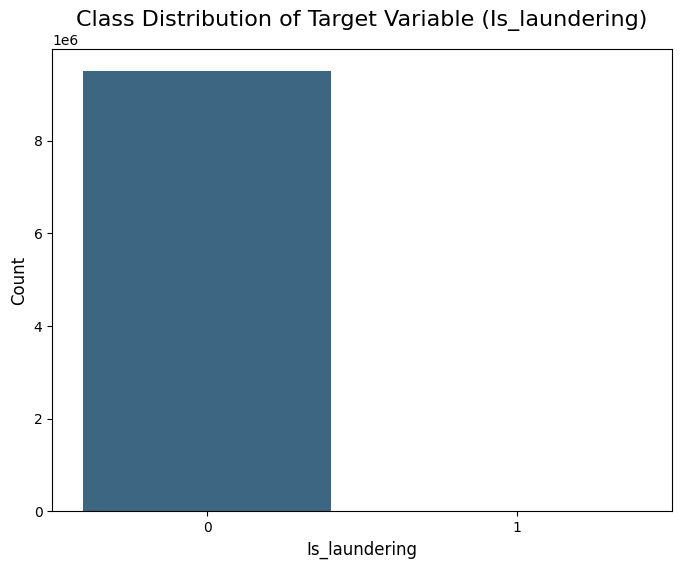

In [ ]:
# Class distribution bar chart
plt.figure(figsize=(8, 6))
sns.countplot(x='Is_laundering', data=processed_df, palette='viridis')
plt.title('Class Distribution of Target Variable (Is_laundering)', fontsize=16)
plt.xlabel('Is_laundering', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()



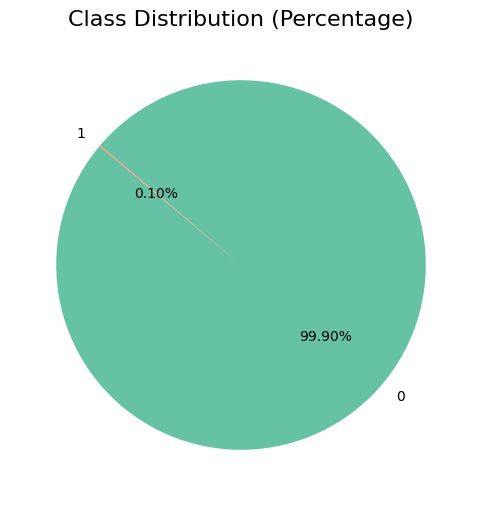

Class Distribution (%):
 Is_laundering
0    99.896127
1     0.103873
Name: proportion, dtype: float64


In [ ]:
# Class distribution pie chart
class_counts = processed_df['Is_laundering'].value_counts()
plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.2f%%', colors=['#66c2a5', '#fc8d62'], startangle=140)
plt.title('Class Distribution (Percentage)', fontsize=16)
plt.show()

# Printing class distribution percentages
class_distribution = processed_df['Is_laundering'].value_counts(normalize=True) * 100
print("Class Distribution (%):\n", class_distribution)

Missing Values Analysis

In [ ]:
# Missing Values Check
missing_values = processed_df.isnull().sum()
print("Missing Values in Each Column:\n", missing_values[missing_values > 0])

Missing Values in Each Column:
 Series([], dtype: int64)


NUMERIC FEATURES DISTRIBUTION

In [ ]:
numeric_features = processed_df.select_dtypes(include=[np.number]).columns

Visualizing Data Distributions of Numeric Features using Histograms

In [ ]:
# Selecting numeric features
numeric_features = processed_df.select_dtypes(include=[np.number]).columns

# Calculating the grid layout dynamically
num_features = len(numeric_features)
cols = 4  # Number of columns for the layout
rows = math.ceil(num_features / cols)  # Determine rows based on number of features

# Seting figure size
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
axes = axes.flatten()  # Flatten to easily iterate over axes

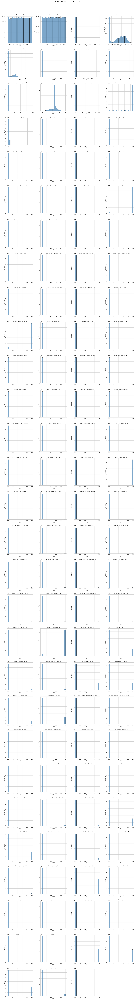

In [ ]:
#  histograms
for i, feature in enumerate(numeric_features):
    processed_df[feature].plot.hist(bins=20, ax=axes[i], alpha=0.7, color='steelblue', edgecolor='black')
    axes[i].set_title(feature, fontsize=10)
    axes[i].set_xlabel("Value", fontsize=9)
    axes[i].set_ylabel("Frequency", fontsize=9)

# Removing empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adding overall title and adjusting layout
plt.suptitle("Histograms of Numeric Features", fontsize=16, y=1.01)
plt.tight_layout()
plt.show()

Pairwise Correlation Analysis

In [ ]:
#Pairwise Correlation Analysis


# Compute the correlation matrix
correlation_matrix = processed_df[numeric_features].corr()


Correlation Heatmap of Numeric Features

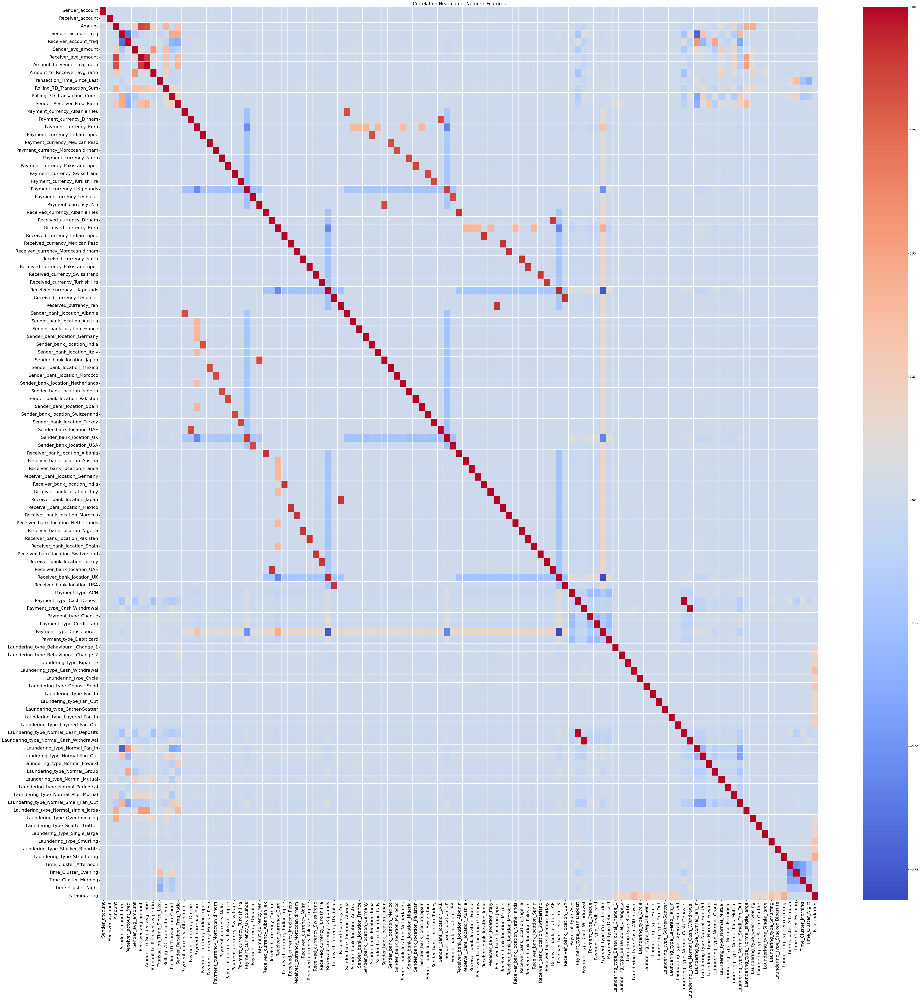

In [ ]:
 #Seting the figure size for better visibility
plt.figure(figsize=(50, 50))

# Creating heatmap with adjusted label sizes and rotation
sns.heatmap(
    correlation_matrix,
    annot=False,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='white'
)

# Rotate x and y ticks for better readability
plt.xticks(rotation=90, fontsize=16, ha='center', va='top')
plt.yticks(rotation=0, fontsize=16)



# title
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)

# Adjusting layout for better spacing
plt.tight_layout()

# plot
plt.show()

Analyzing Categorical Feature Distributions

In [ ]:
# Selecting categorical features
categorical_features = processed_df.select_dtypes(include=['int', 'float']).columns.difference(numeric_features)

Frequency Distribution of Categorical Features

In [ ]:
# Explicitly identifying categorical features
categorical_features = [
    col for col in processed_df.columns
    if col not in numeric_features and col != 'Is_laundering'
]


In [ ]:
# Checking if any categorical features exist
if len(categorical_features) == 0:
    print("No categorical features found. Entire dataset has numeric features.")
else:
    # Ploting frequency distributions
    fig, axes = plt.subplots(len(categorical_features), 1, figsize=(10, len(categorical_features) * 4))

    for i, feature in enumerate(categorical_features):
        sns.countplot(data=processed_df, x=feature, ax=axes[i], order=processed_df[feature].value_counts().index)
        axes[i].set_title(f"Frequency Distribution of {feature}", fontsize=12)
        axes[i].set_xlabel(feature, fontsize=10)
        axes[i].set_ylabel("Count", fontsize=10)
        axes[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

No categorical features found. Entire dataset has numeric features.


Analyzing Relationships between numerical features and the target variable

Boxplots of Numeric Features vs Is_laundering

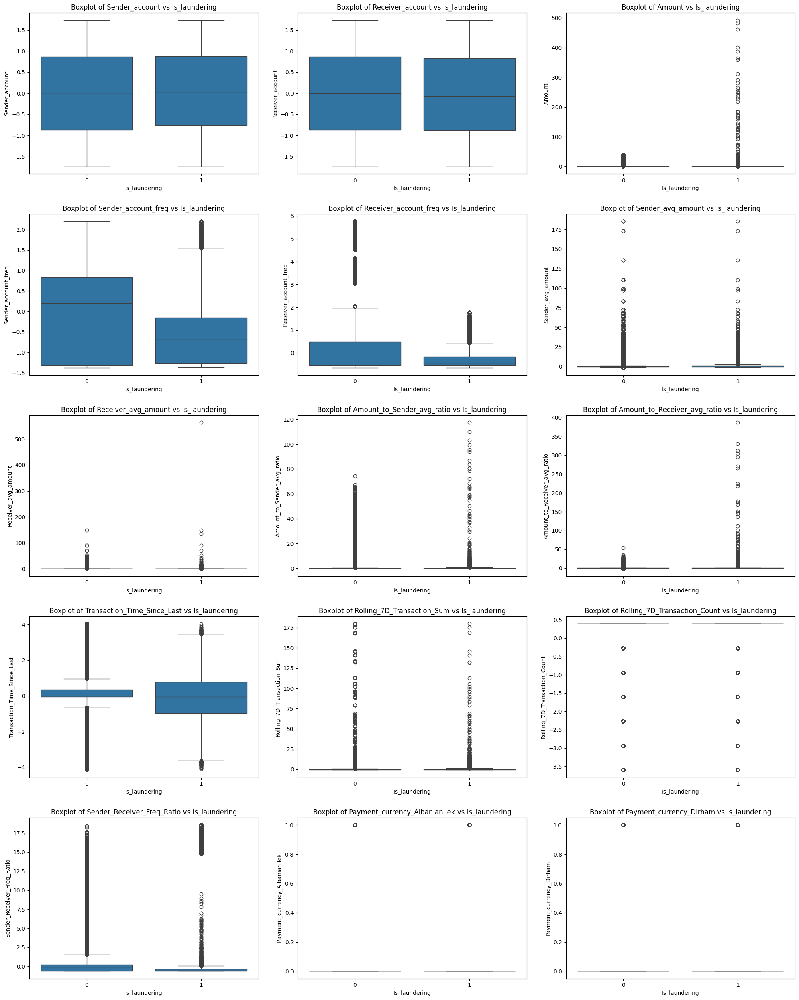

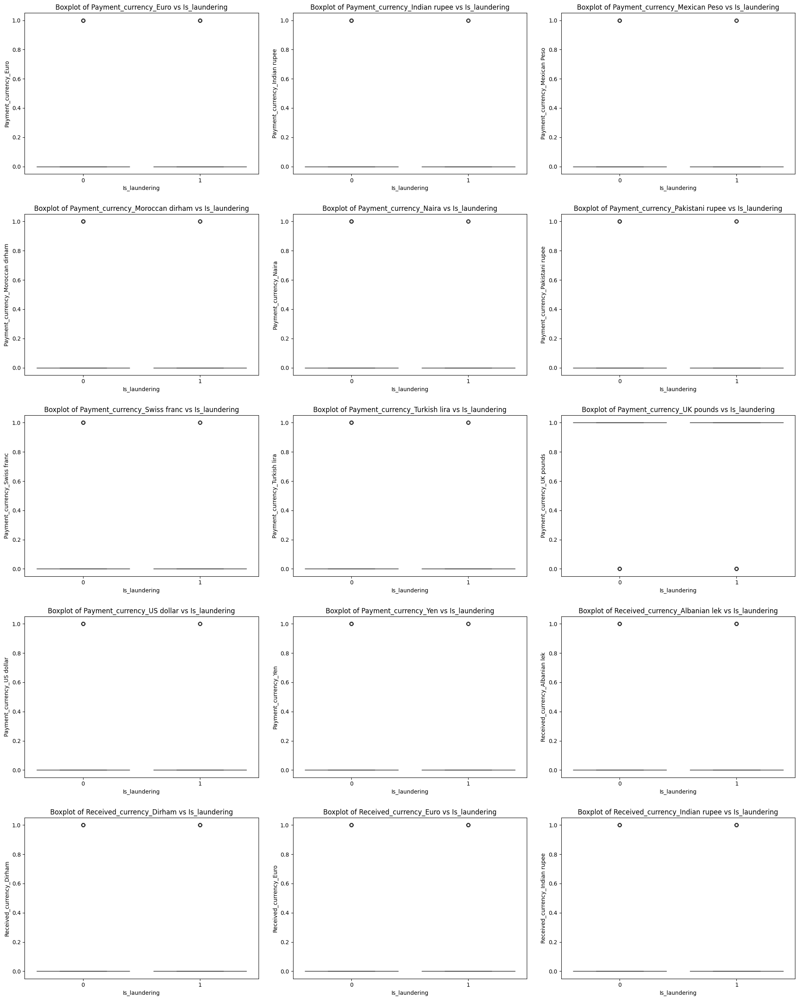

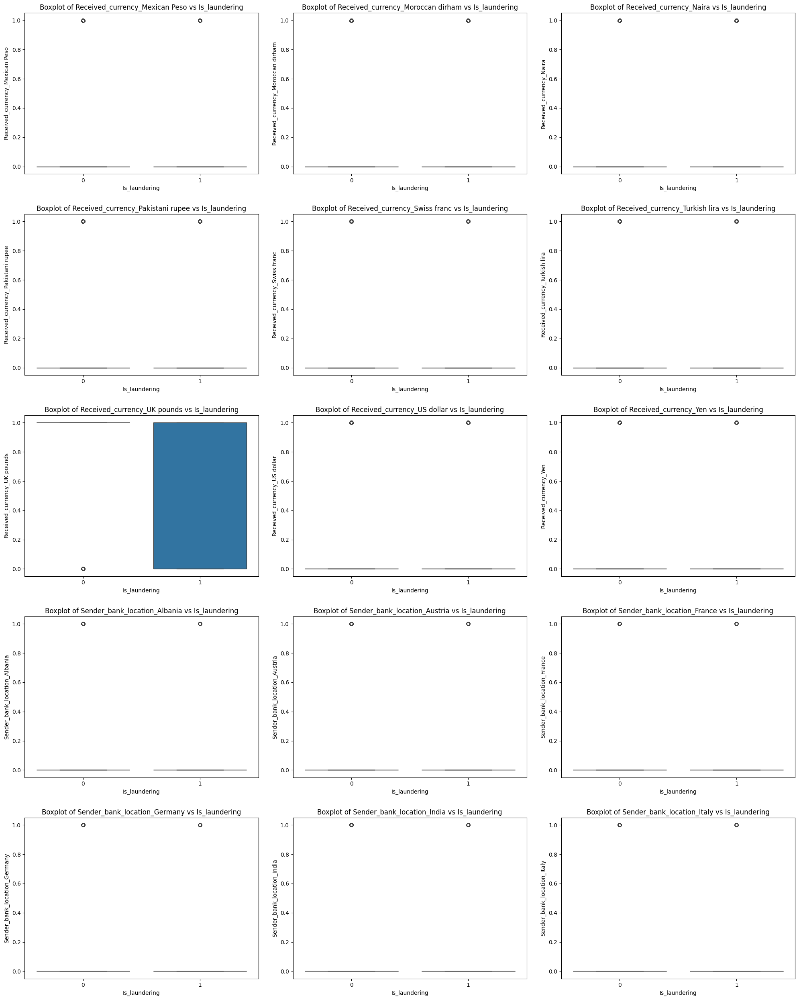

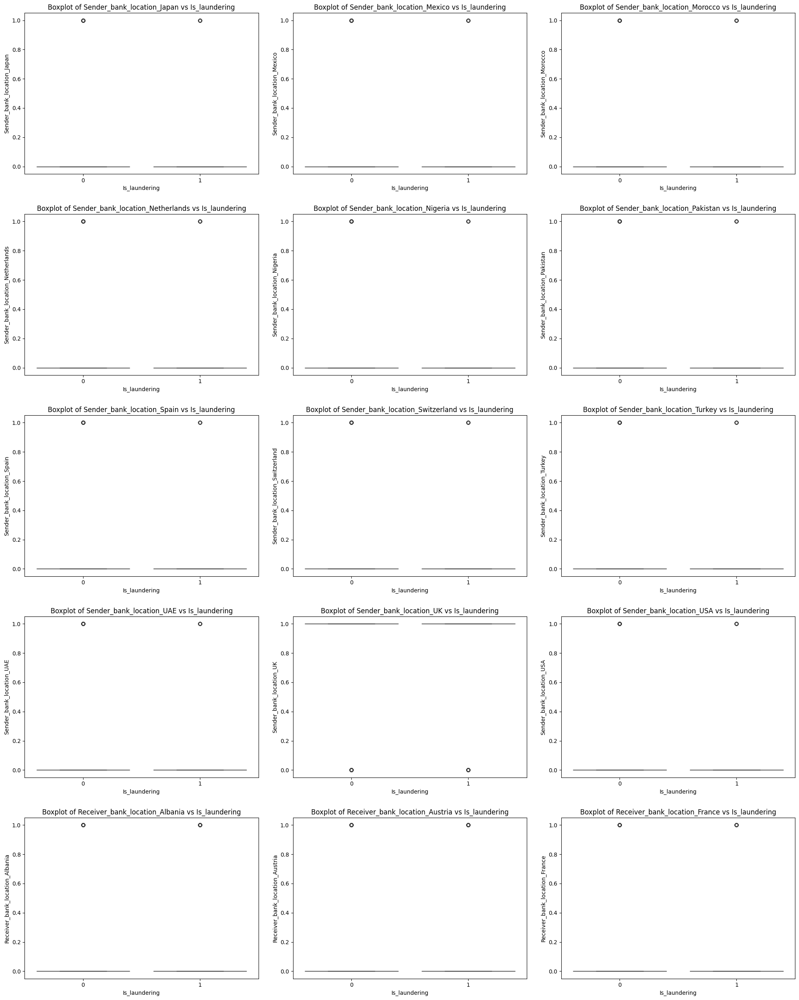

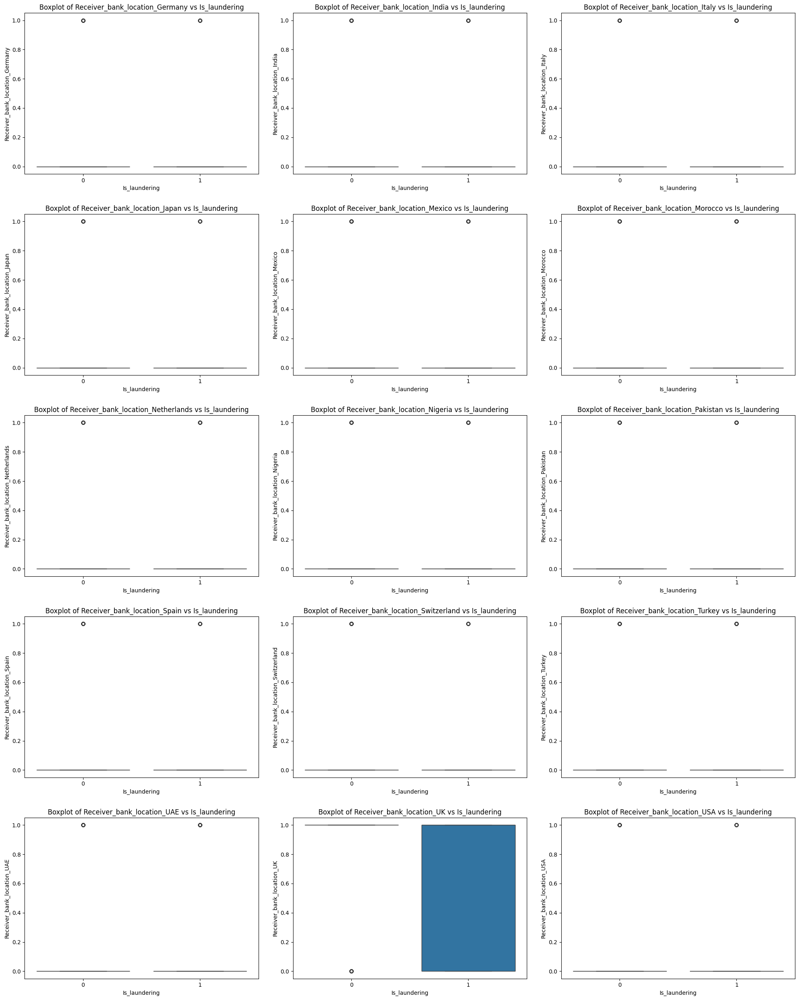

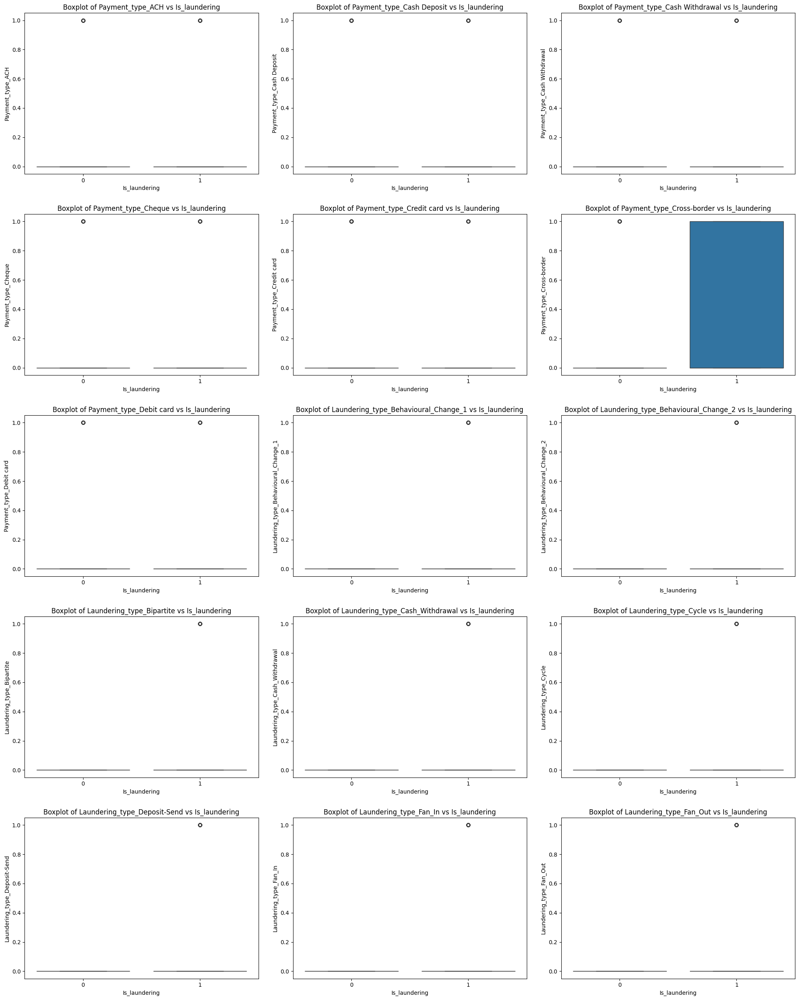

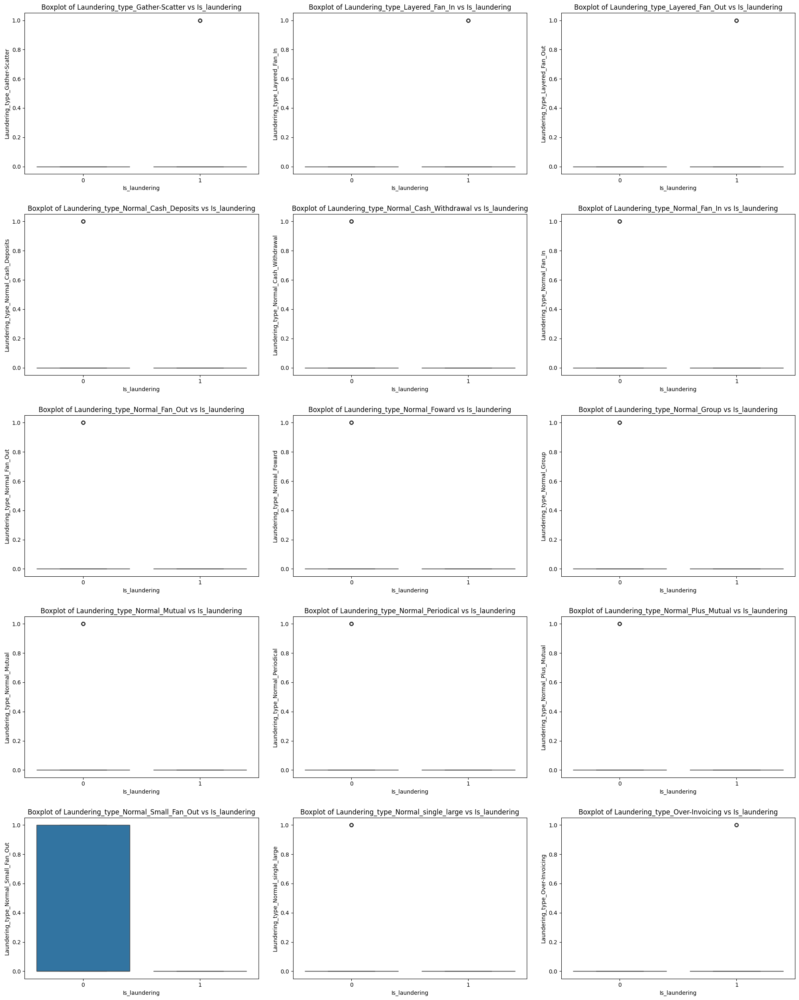

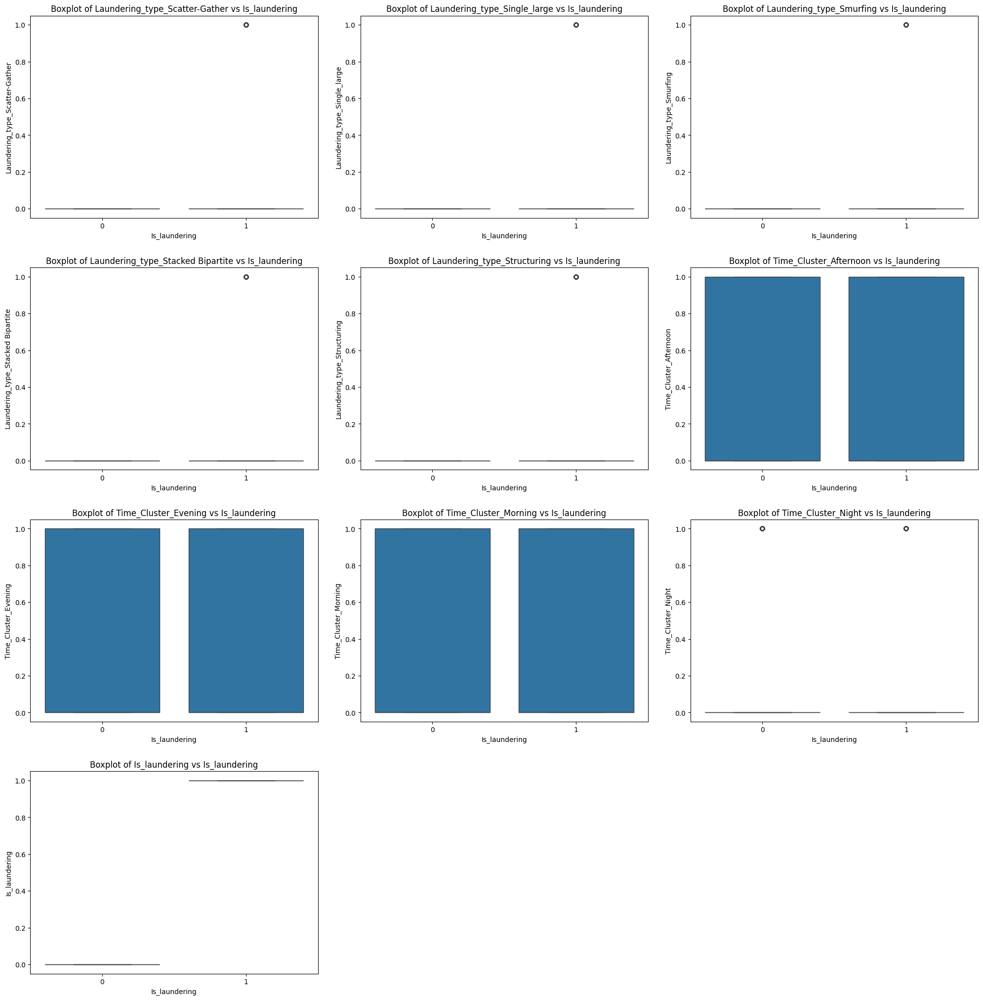

In [ ]:
# Number of features per figure
plots_per_fig = 15  # Total plots per figure (3 rows * 4 columns)

# Adjusting figure aesthetics
for i in range(0, len(numeric_features), plots_per_fig):
    fig, axes = plt.subplots(math.ceil(plots_per_fig / 3), 3, figsize=(20, math.ceil(plots_per_fig / 3) * 5))  # 3 plots per row
    axes = axes.flatten()

    for j, col in enumerate(numeric_features[i:i + plots_per_fig]):
        sns.boxplot(x='Is_laundering', y=col, data=processed_df, ax=axes[j])
        axes[j].set_title(f'Boxplot of {col} vs Is_laundering', fontsize=12)
        axes[j].set_xlabel('Is_laundering', fontsize=10)
        axes[j].set_ylabel(col, fontsize=10)

    # Removing unused subplots
    for k in range(j + 1, len(axes)):
        fig.delaxes(axes[k])

    # Adjusting layout for spacing
    plt.tight_layout(h_pad=2.5, w_pad=2.5)
    plt.show()

Violin Plots of Numeric Features vs Is_laundering

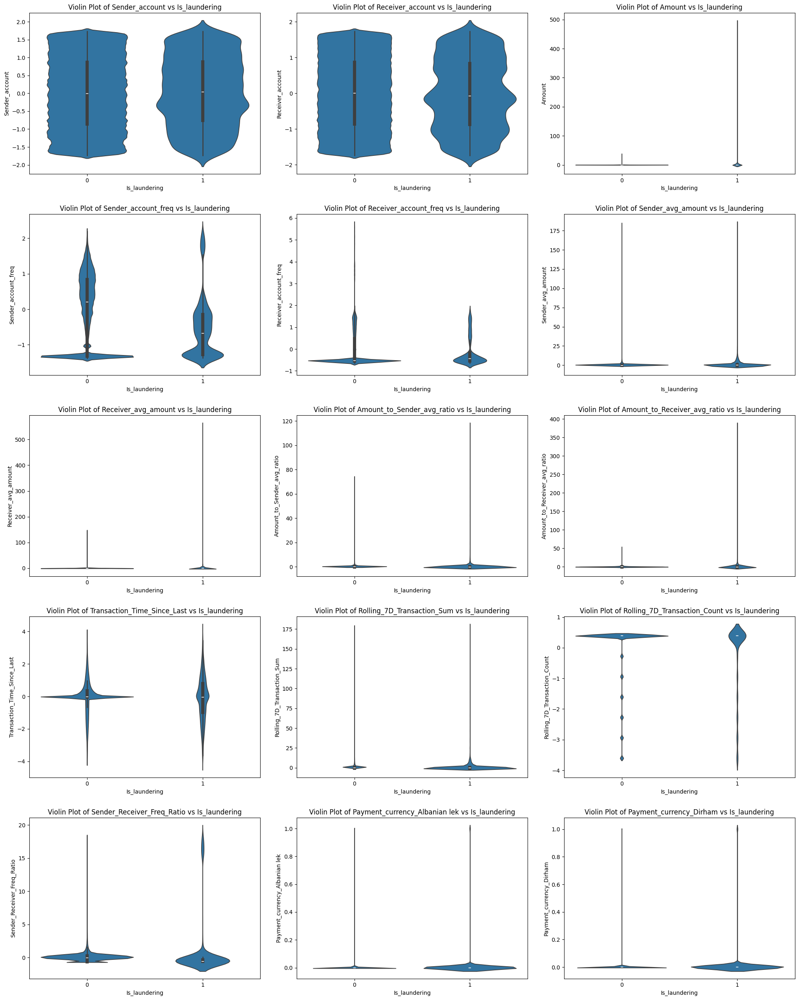

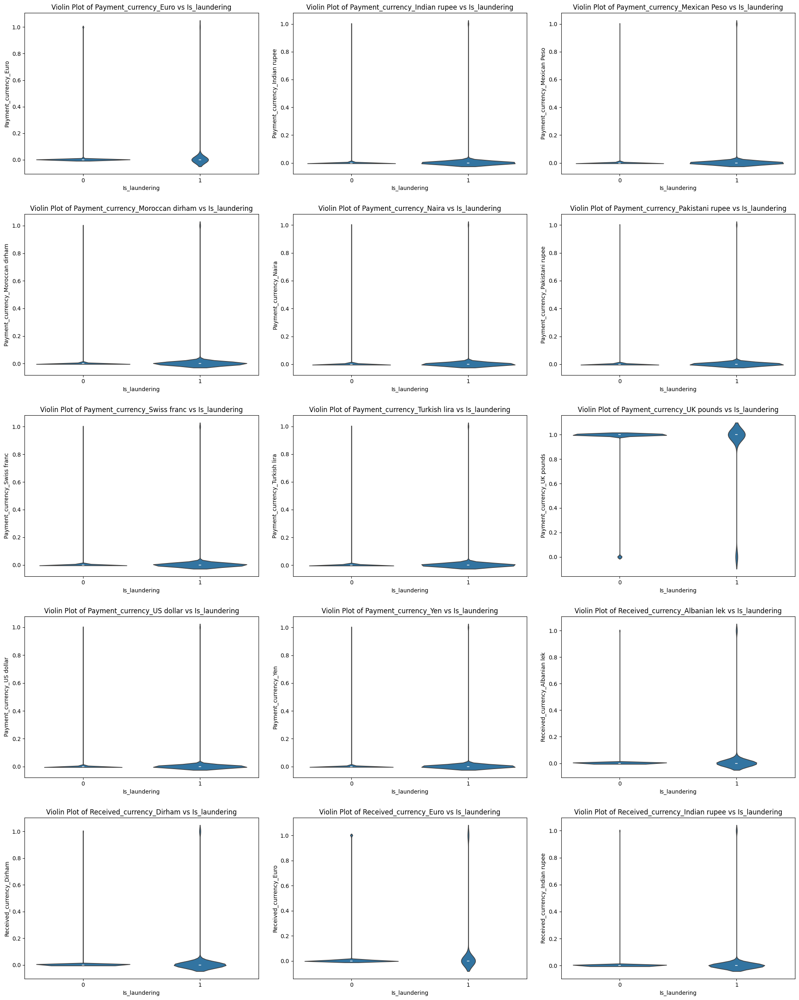

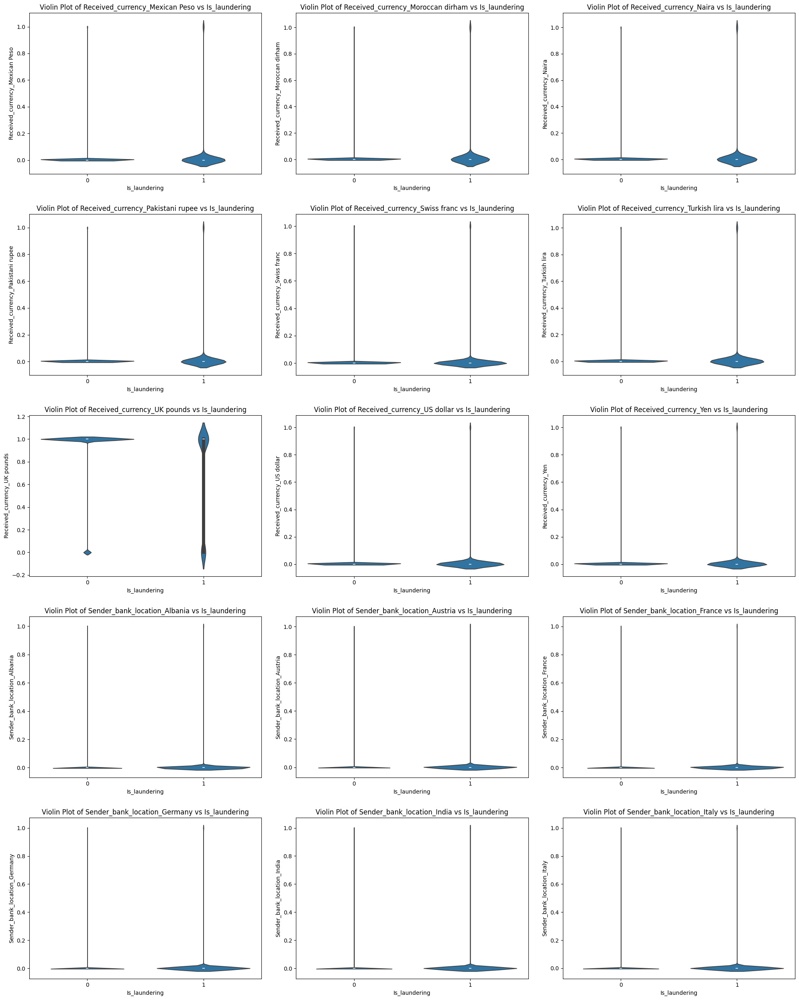

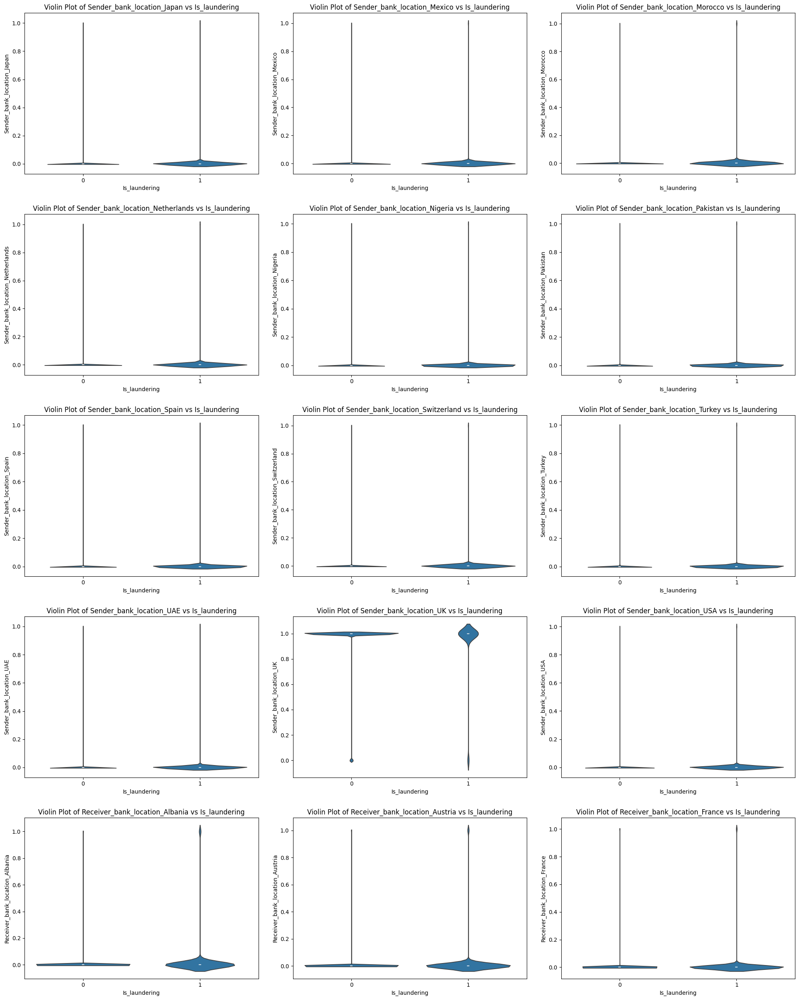

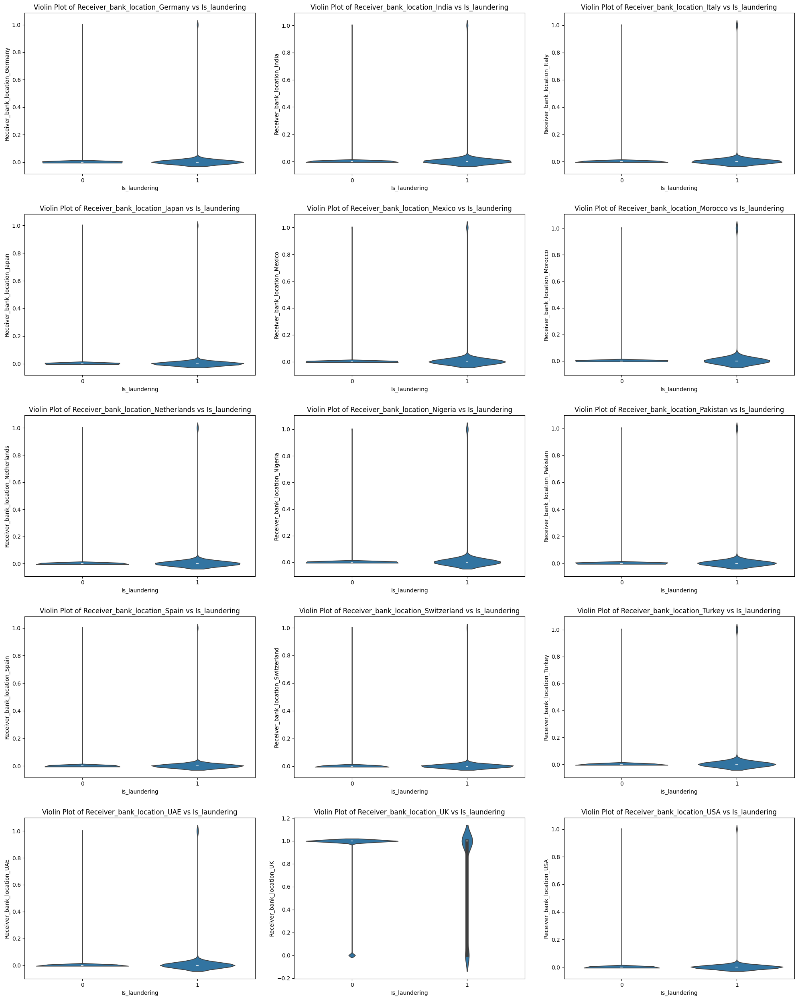

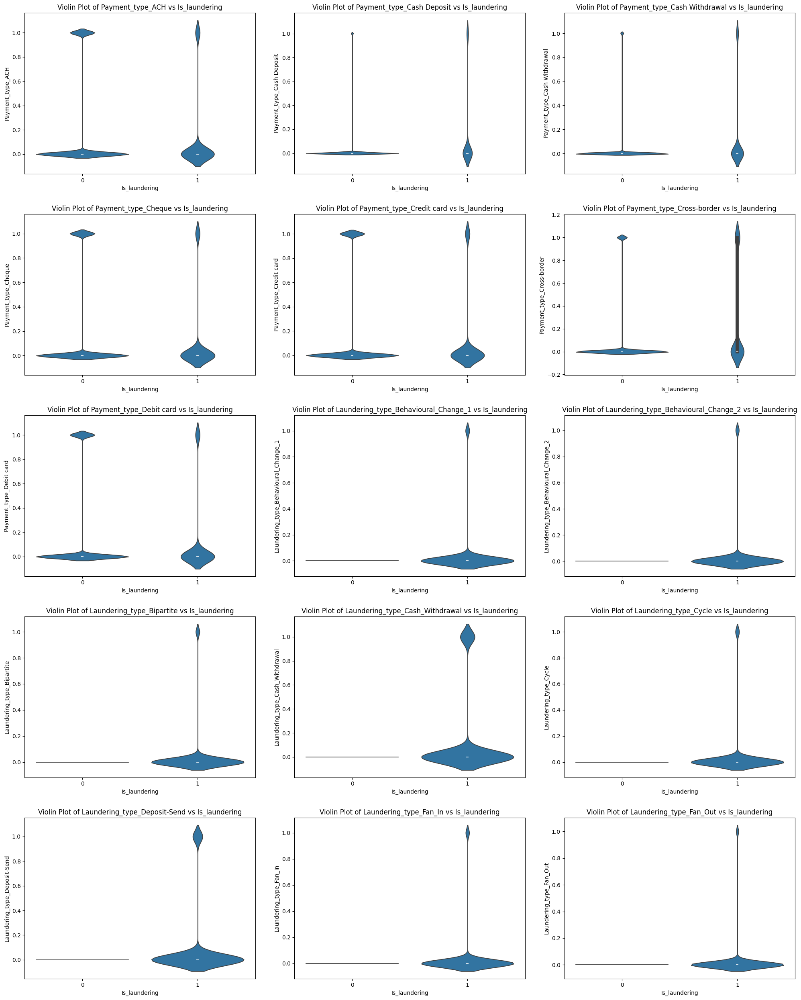

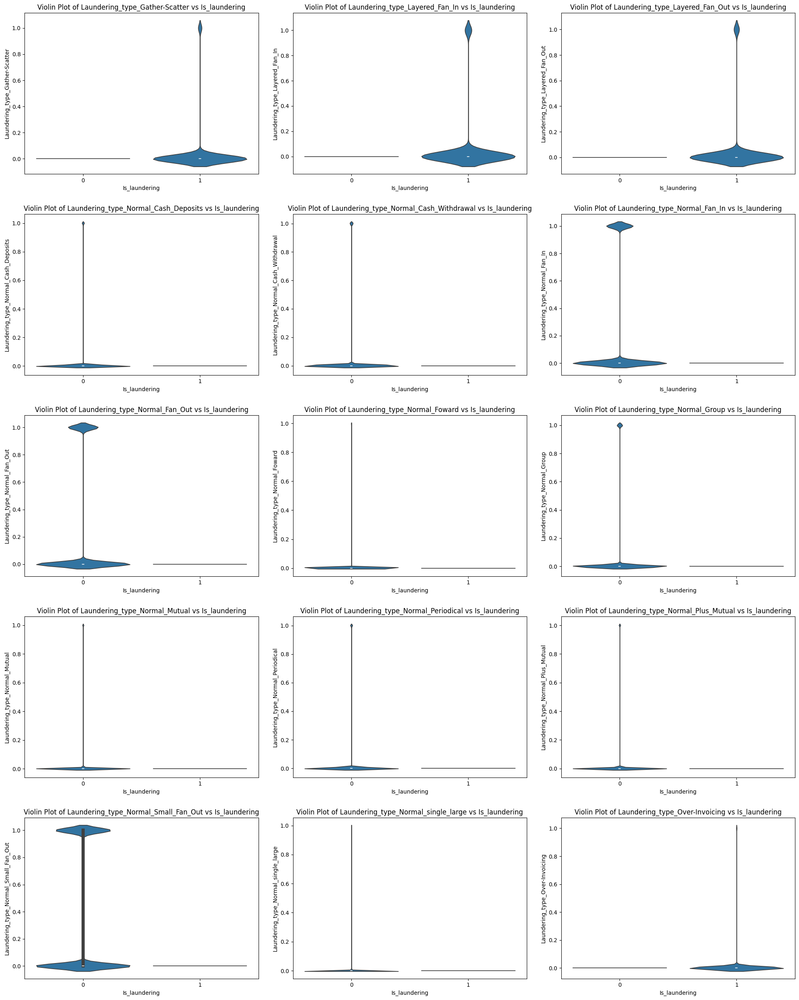

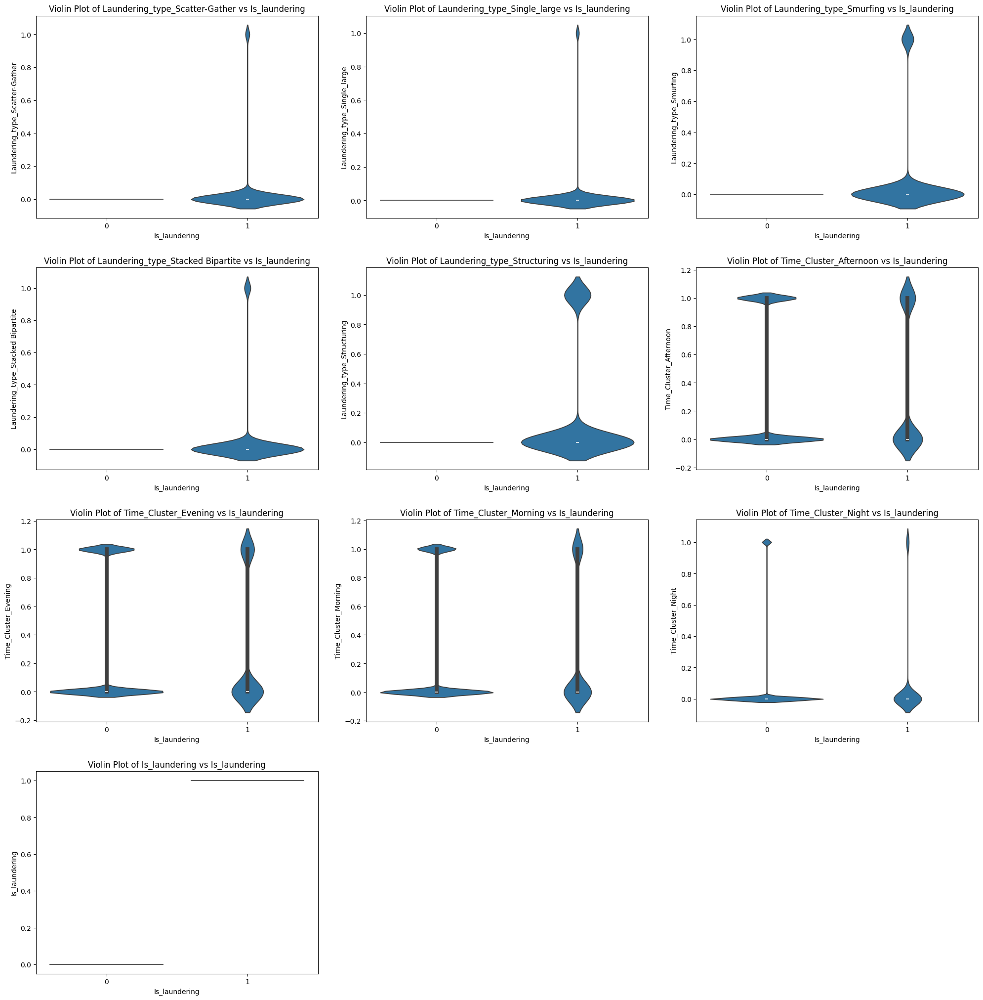

In [ ]:
# Number of features per figure
plots_per_fig = 15  # Total plots per figure (3 rows * 4 columns)

# Adjusting figure aesthetics
for i in range(0, len(numeric_features), plots_per_fig):
    fig, axes = plt.subplots(math.ceil(plots_per_fig / 3), 3, figsize=(20, math.ceil(plots_per_fig / 3) * 5))  # 3 plots per row
    axes = axes.flatten()

    for j, col in enumerate(numeric_features[i:i + plots_per_fig]):
        sns.violinplot(x='Is_laundering', y=col, data=processed_df, ax=axes[j])
        axes[j].set_title(f'Violin Plot of {col} vs Is_laundering', fontsize=12)
        axes[j].set_xlabel('Is_laundering', fontsize=10)
        axes[j].set_ylabel(col, fontsize=10)

    # Removing unused subplots
    for k in range(j + 1, len(axes)):
        fig.delaxes(axes[k])

    # Adjusting layout for spacing
    plt.tight_layout(h_pad=2.5, w_pad=2.5)
    plt.show()

Feature Importance Analysis

XGBoost (eXtreme Gradient Boosting) would be an excellent choice for feature importance analysis. XGBoost is robust, handles imbalanced datasets effectively, and is efficient for large datasets like the one being used in this project

Importing necessary librabries for XG Boost

In [ ]:
pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.0/199.0 MB 5.2 MB/s eta 0:00:00


In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


Feature Importance Analysis with XGBoost

In [ ]:
# Splitting the data into features (X) and target (y)
X = processed_df.drop(columns=['Is_laundering'])  # Droping the target column
y = processed_df['Is_laundering']  # Target variable

# Splitting into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [ ]:
# Training an XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [23:10:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Geting feature importance
feature_importance = xgb_model.feature_importances_

# Creating a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)


Plotting Top 20 Features by Importance - XGBoost Analysis

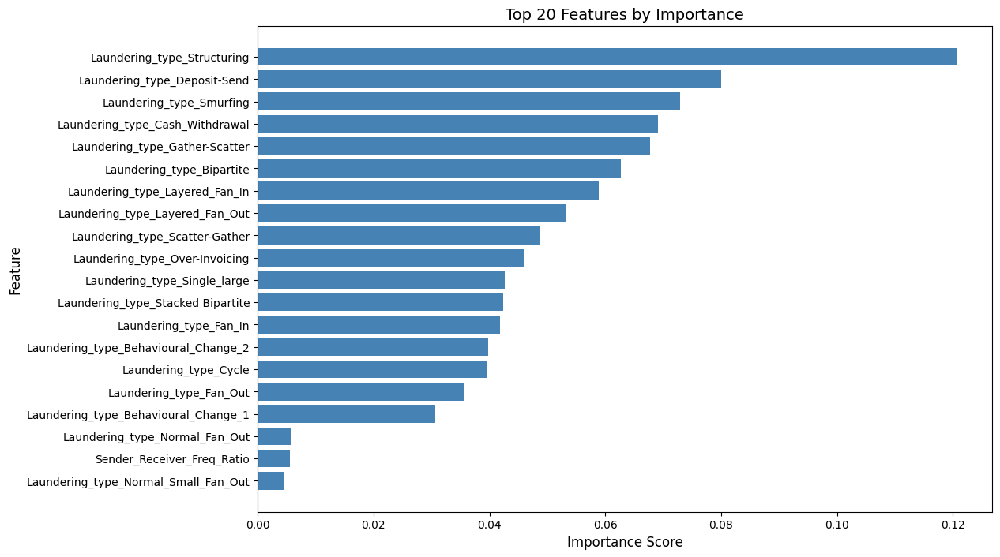

In [ ]:
# Ploting the top 20 most important features
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'][:20], importance_df['Importance'][:20], color='steelblue')
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Feature', fontsize=12)
plt.title('Top 20 Features by Importance', fontsize=14)
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# Displaying the feature importance DataFrame
print("Feature Importance Scores:")
print(importance_df)

Feature Importance Scores:
                             Feature  Importance
109      Laundering_type_Structuring    0.120768
87      Laundering_type_Deposit-Send    0.080051
107         Laundering_type_Smurfing    0.072890
85   Laundering_type_Cash_Withdrawal    0.069137
90    Laundering_type_Gather-Scatter    0.067686
..                               ...         ...
42      Sender_bank_location_Germany    0.000000
41       Sender_bank_location_France    0.000000
40      Sender_bank_location_Austria    0.000000
39      Sender_bank_location_Albania    0.000000
51        Sender_bank_location_Spain    0.000000

[114 rows x 2 columns]


Outlier analyis using Boxplots of Top 10 Features by Importance

In [ ]:
# Selecting top 10 numeric features based on feature importance
top_numeric_features = importance_df['Feature'][:10]

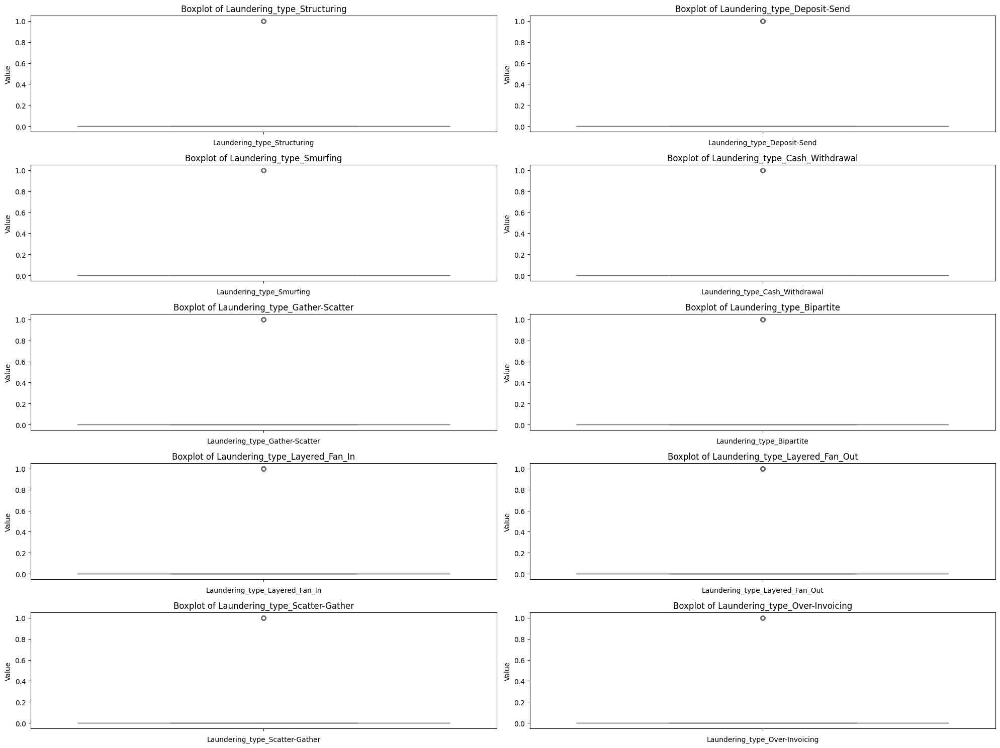

In [ ]:
# Creating boxplots
plt.figure(figsize=(20, 15))
for i, feature in enumerate(top_numeric_features):
    plt.subplot(5, 2, i + 1)  # 5 rows, 2 columns for top 10 features
    sns.boxplot(data=processed_df, y=feature, color='skyblue')
    plt.title(f'Boxplot of {feature}', fontsize=12)
    plt.xlabel(feature, fontsize=10)
    plt.ylabel('Value', fontsize=10)
plt.tight_layout()
plt.show()

Skewness Analysis and Distribution of Top Numeric Features to Evaluate Data Transformation Needs

In [ ]:
# Calculating skewness for the top numeric features
skewness = processed_df[top_numeric_features].apply(lambda x: skew(x.dropna()))

In [ ]:
print("Skewness of Top Numeric Features:")
print(skewness)

Skewness of Top Numeric Features:
Laundering_type_Structuring         71.272777
Laundering_type_Deposit-Send       100.274845
Laundering_type_Smurfing           100.971972
Laundering_type_Cash_Withdrawal     84.392397
Laundering_type_Gather-Scatter     163.850128
Laundering_type_Bipartite          157.524112
Laundering_type_Layered_Fan_In     120.358231
Laundering_type_Layered_Fan_Out    134.032027
Laundering_type_Scatter-Gather     167.683821
Laundering_type_Over-Invoicing     419.538768
dtype: float64


Skewness Analyis visualization through Histograms

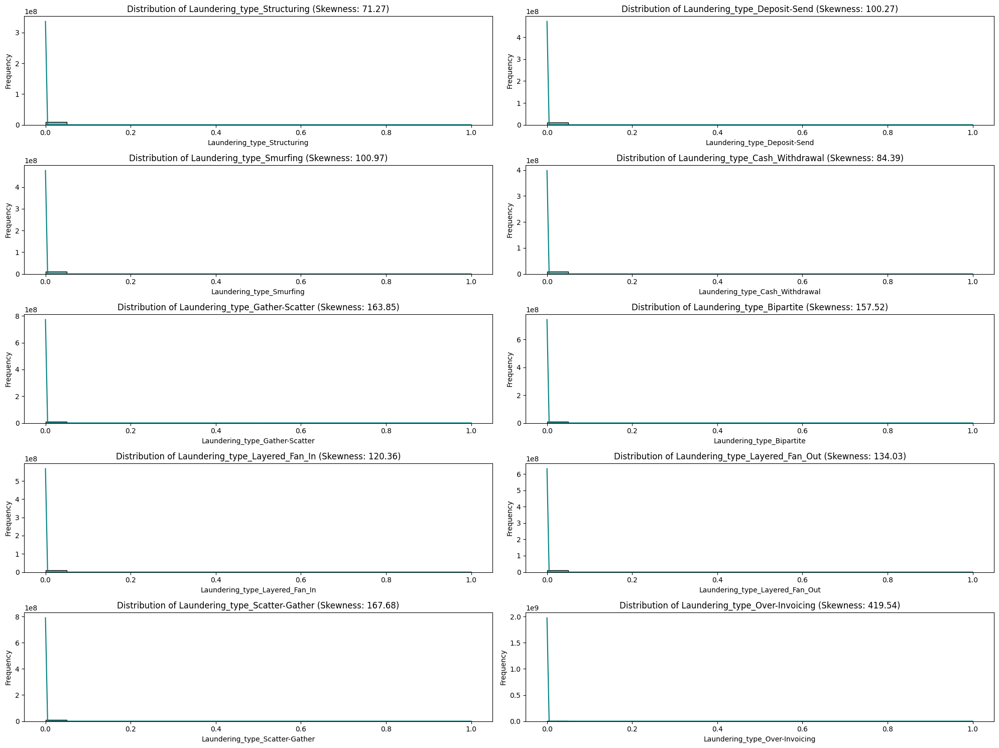

In [ ]:
# Ploting histograms and density plots for each top numeric feature
plt.figure(figsize=(20, 15))
for i, feature in enumerate(top_numeric_features):
    plt.subplot(5, 2, i + 1)  # 5 rows and 2 columns
    sns.histplot(data=processed_df, x=feature, kde=True, color='teal', bins=20)
    plt.title(f'Distribution of {feature} (Skewness: {skewness[feature]:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=10)
    plt.ylabel('Frequency', fontsize=10)

plt.tight_layout()
plt.show()

Analyzing Distribution of Rolling 7-Day Transaction Sum for Behavioral Insights

In [ ]:
# Seting figure size
plt.figure(figsize=(15, 8))

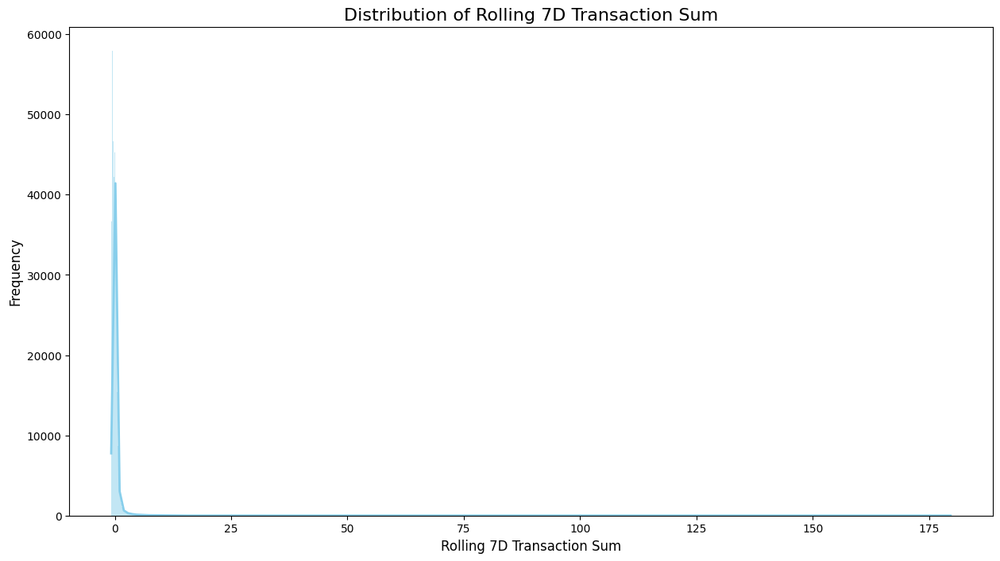

In [ ]:
# Ploting Rolling_7D_Transaction_Sum with a darker KDE line
sns.histplot(data=processed_df, x="Rolling_7D_Transaction_Sum", kde=True, color="skyblue", line_kws={'color': 'darkblue', 'lw': 2})
plt.title("Distribution of Rolling 7D Transaction Sum", fontsize=16)
plt.xlabel("Rolling 7D Transaction Sum", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()

Distribution of Transaction Time Since Last for Temporal Insights

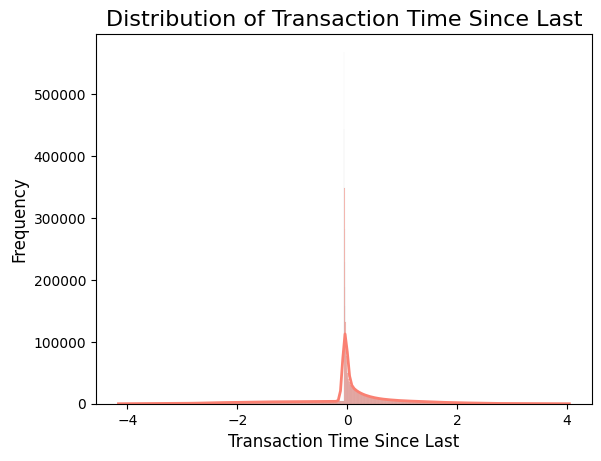

In [ ]:
# Ploting Transaction_Time_Since_Last with a darker KDE line
sns.histplot(data=processed_df, x="Transaction_Time_Since_Last", kde=True, color="salmon", line_kws={'color': 'darkred', 'lw': 2})
plt.title("Distribution of Transaction Time Since Last", fontsize=16)
plt.xlabel("Transaction Time Since Last", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()


Time Cluster Analysis: Patterns of Transactions and Laundering

In [ ]:
# List of time cluster features

time_clusters = ['Time_Cluster_Morning', 'Time_Cluster_Afternoon',
                 'Time_Cluster_Evening', 'Time_Cluster_Night']

In [ ]:
# Seting up the figure with a grid layout (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # 2 rows, 2 columns grid layout
axes = axes.flatten()  # Flatten axes array for easy iteration

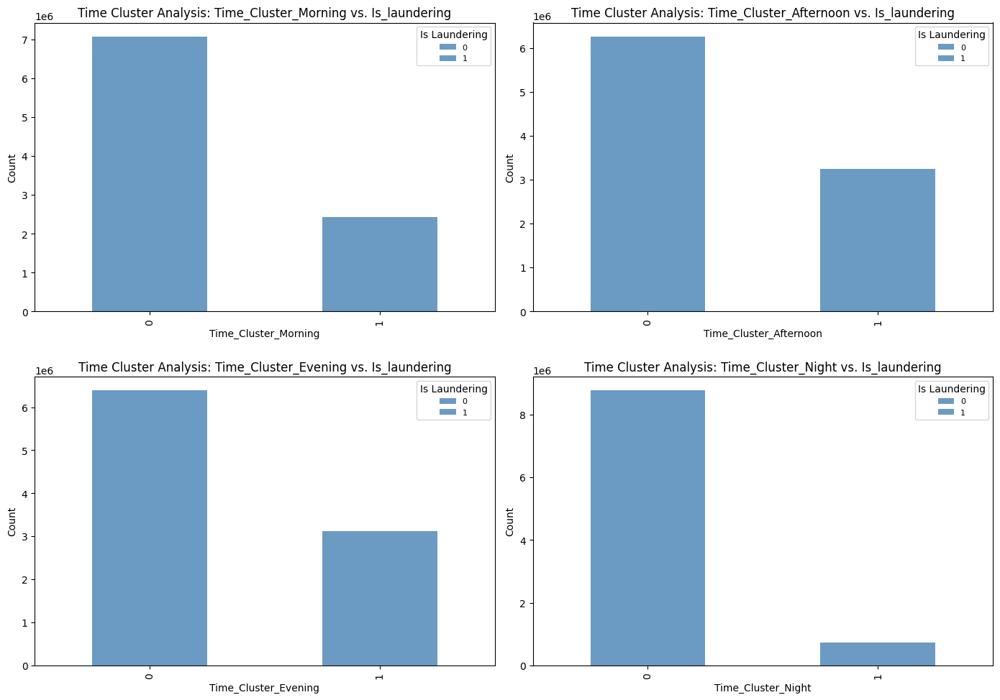

In [ ]:
# Looping through each time cluster
for i, cluster in enumerate(time_clusters):
    cluster_counts = processed_df.groupby([cluster, 'Is_laundering']).size().unstack(fill_value=0)

    # Ploting stacked bars with the same color
    cluster_counts.plot(kind='bar', stacked=True, ax=axes[i], color='steelblue', alpha=0.8)
    axes[i].set_title(f'Time Cluster Analysis: {cluster} vs. Is_laundering', fontsize=12)
    axes[i].set_ylabel('Count', fontsize=10)
    axes[i].set_xlabel(cluster, fontsize=10)
    axes[i].legend(title="Is Laundering", fontsize=8)
    axes[i].set_xticklabels(['0', '1'], fontsize=10)  # Seting x-tick labels to "0" and "1"

# Removing unused subplots if any
for j in range(len(time_clusters), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

 Exploration of Payment and Receiver Patterns

In [ ]:
# Filter columns related to Payment and Received currencies
payment_currency_cols = [col for col in processed_df.columns if col.startswith('Payment_currency_')]
received_currency_cols = [col for col in processed_df.columns if col.startswith('Received_currency_')]

In [ ]:
# Sum occurrences of each currency across all rows
payment_currency_counts = processed_df[payment_currency_cols].sum().sort_values(ascending=False)
received_currency_counts = processed_df[received_currency_cols].sum().sort_values(ascending=False)


Analysis of Payment and Received Currency Distributions

<ipython-input-16-778981292422>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=payment_currency_counts.index, y=payment_currency_counts.values, palette="viridis")


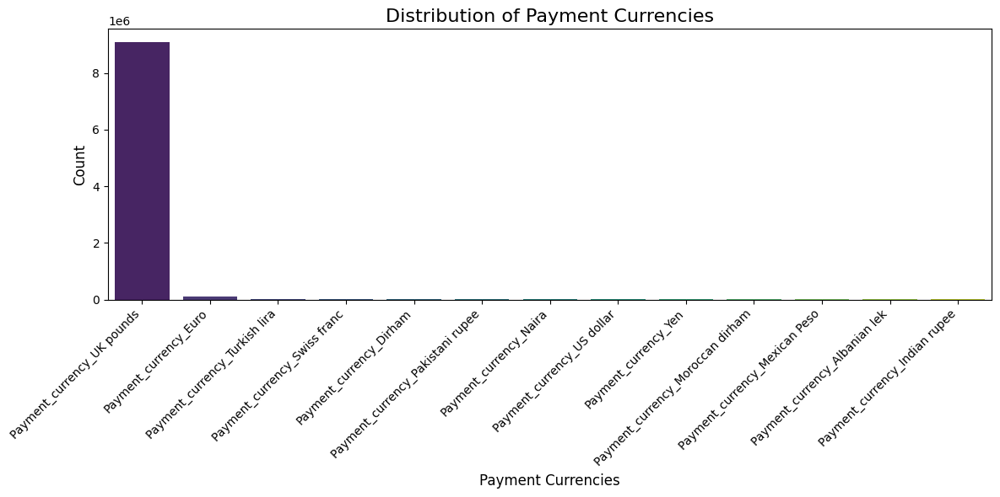

In [ ]:
# Ploting Payment Currency Distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=payment_currency_counts.index, y=payment_currency_counts.values, palette="viridis")
plt.title('Distribution of Payment Currencies', fontsize=16)
plt.xlabel('Payment Currencies', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.tight_layout()
plt.show()

<ipython-input-17-2e7117eb29ef>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=received_currency_counts.index, y=received_currency_counts.values, palette="plasma")


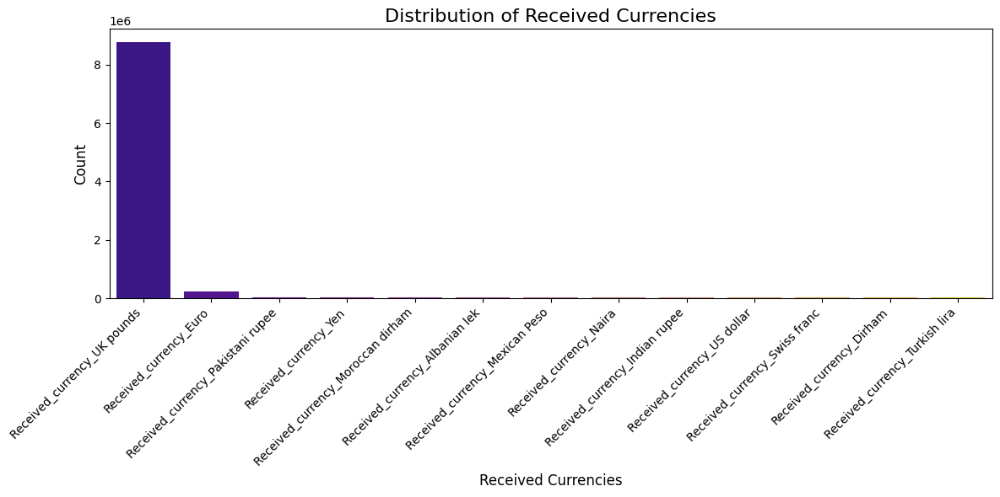

In [ ]:
# Ploting Received Currency Distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=received_currency_counts.index, y=received_currency_counts.values, palette="plasma")
plt.title('Distribution of Received Currencies', fontsize=16)
plt.xlabel('Received Currencies', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.tight_layout()
plt.show()

Payment vs. Laundering Analysis:

In [ ]:
# Extracting payment currency columns
payment_currency_columns = [col for col in processed_df.columns if col.startswith('Payment_currency_')]

In [ ]:
# Ensuring the category names are correct
laundering_proportions = (
    processed_df.groupby('Is_laundering')
    .mean()
    .loc[1, payment_currency_columns]
    .sort_values(ascending=False)
)

# Reseting index to ensuring proper labels
laundering_proportions = laundering_proportions.reset_index()
laundering_proportions.columns = ['Payment_Currency', 'Laundering_Proportion']

Laundering Proportions Across Payment Currencies

<ipython-input-22-49bf6dc534ac>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


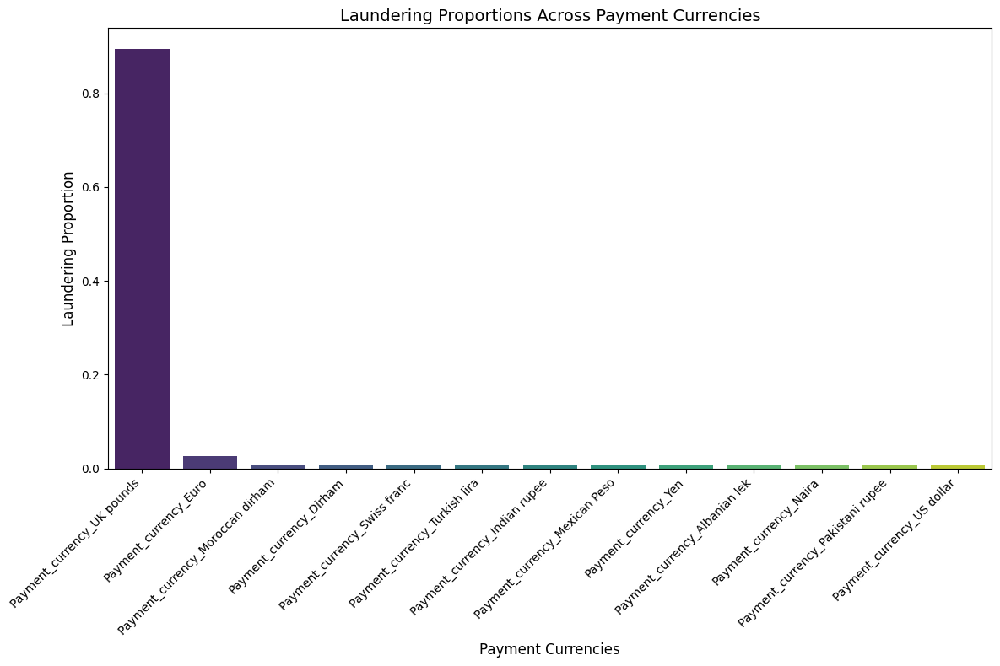

In [ ]:
# Plotting the bar graph
plt.figure(figsize=(12, 8))
sns.barplot(
    data=laundering_proportions,
    x='Payment_Currency',
    y='Laundering_Proportion',
    palette='viridis'
)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.xlabel('Payment Currencies', fontsize=12)
plt.ylabel('Laundering Proportion', fontsize=12)
plt.title('Laundering Proportions Across Payment Currencies', fontsize=14)
plt.tight_layout()
plt.show()

Receiver Currency Patterns

In [ ]:
# Filtering columns for receiver currencies
receiver_currency_cols = [col for col in processed_df.columns if "Received_currency_" in col]

# Calculating the distribution of receiver currencies
receiver_currency_distribution = processed_df[receiver_currency_cols].sum()


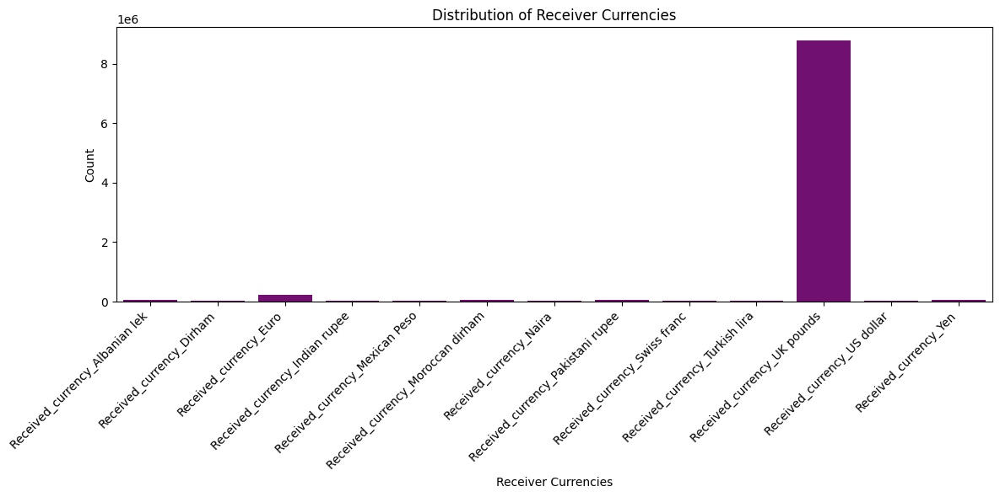

In [ ]:
# Ploting the distribution of receiver currencies
plt.figure(figsize=(12, 6))
sns.barplot(x=receiver_currency_distribution.index, y=receiver_currency_distribution.values, color="purple")
plt.xticks(rotation=45, ha="right")
plt.title("Distribution of Receiver Currencies")
plt.xlabel("Receiver Currencies")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

Laundering Proportions Across Receiver Currencies

In [ ]:
# Calculating laundering proportions for receiver currencies
receiver_currency_laundering = {}
for col in receiver_currency_cols:
    laundering_proportion = processed_df.loc[processed_df[col] == 1, 'Is_laundering'].mean()
    receiver_currency_laundering[col] = laundering_proportion

# Converting to a sorted dataframe for plotting
receiver_currency_laundering_df = pd.DataFrame.from_dict(receiver_currency_laundering, orient="index", columns=["Laundering_Proportion"])
receiver_currency_laundering_df.sort_values(by="Laundering_Proportion", ascending=False, inplace=True)


<ipython-input-24-f88910f15045>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=receiver_currency_laundering_df.index, y=receiver_currency_laundering_df["Laundering_Proportion"], palette="viridis")


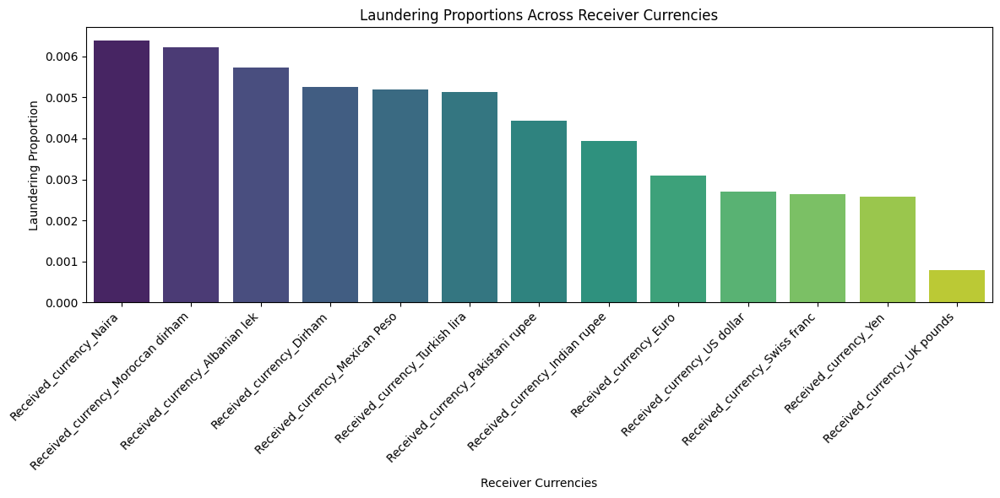

In [ ]:
# Ploting laundering proportions for receiver currencies
plt.figure(figsize=(12, 6))
sns.barplot(x=receiver_currency_laundering_df.index, y=receiver_currency_laundering_df["Laundering_Proportion"], palette="viridis")
plt.xticks(rotation=45, ha="right")
plt.title("Laundering Proportions Across Receiver Currencies")
plt.xlabel("Receiver Currencies")
plt.ylabel("Laundering Proportion")
plt.tight_layout()
plt.show()

Exploration of Transaction Amount Patterns

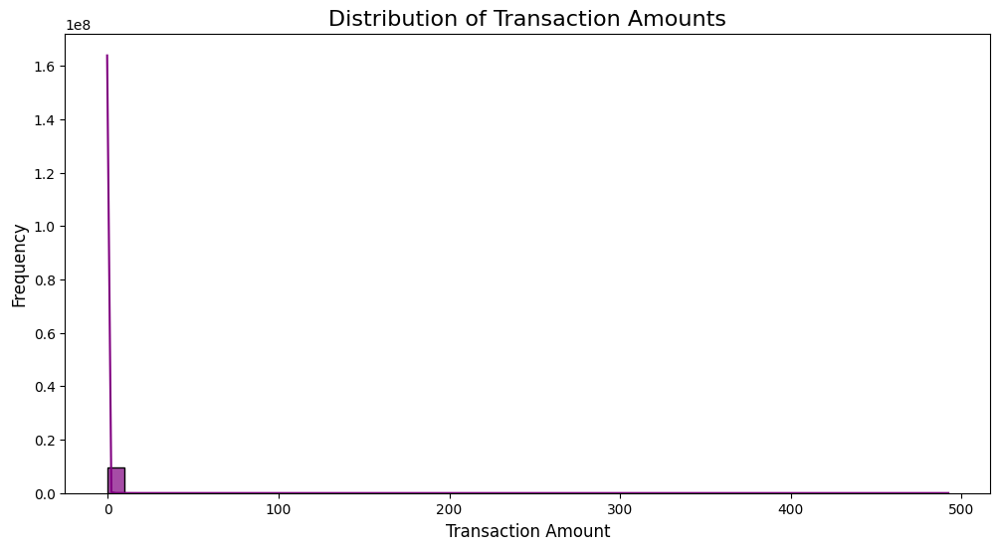

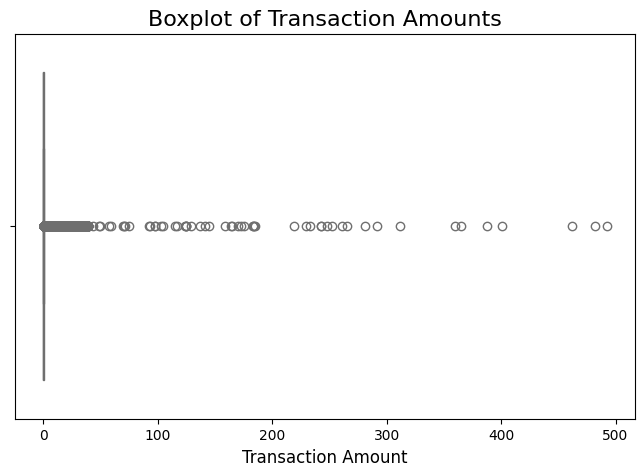

In [ ]:
# Distribution of Transaction Amounts
plt.figure(figsize=(12, 6))
sns.histplot(data=processed_df, x='Amount', bins=50, kde=True, color='purple', alpha=0.7)
plt.title("Distribution of Transaction Amounts", fontsize=16)
plt.xlabel("Transaction Amount", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()

# Boxplot to visualize outliers
plt.figure(figsize=(8, 5))
sns.boxplot(data=processed_df, x='Amount', color='skyblue')
plt.title("Boxplot of Transaction Amounts", fontsize=16)
plt.xlabel("Transaction Amount", fontsize=12)
plt.show()

Analysis of Transaction Amounts Based on Laundering Activity (Boxplot and Violin Plot)

<ipython-input-26-2c96d56da781>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y='Amount', palette='Set2')


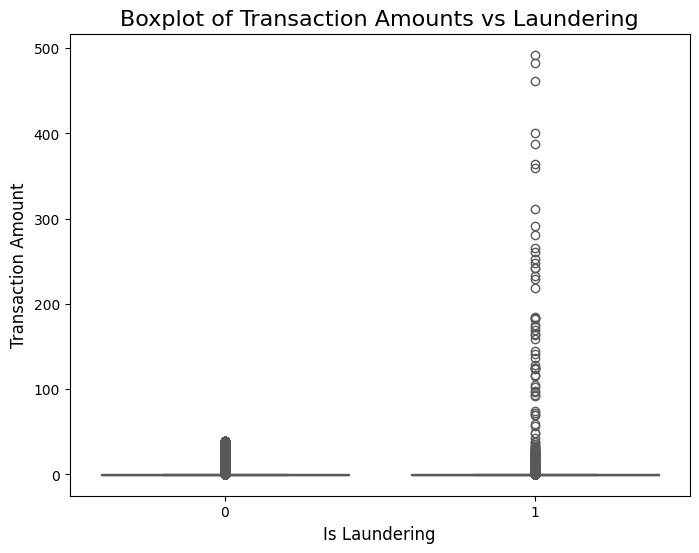

<ipython-input-26-2c96d56da781>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=processed_df, x='Is_laundering', y='Amount', palette='Set2', inner='quartile')


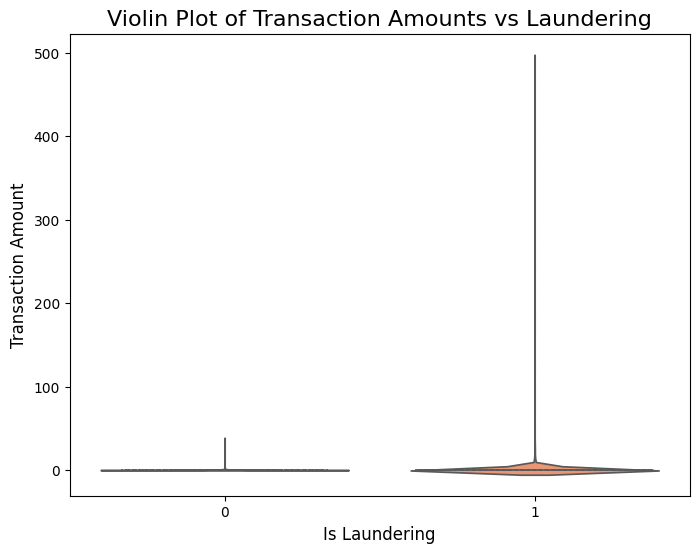

In [ ]:
# Amount vs is_Laundering
plt.figure(figsize=(8, 6))
sns.boxplot(data=processed_df, x='Is_laundering', y='Amount', palette='Set2')
plt.title("Boxplot of Transaction Amounts vs Laundering", fontsize=16)
plt.xlabel("Is Laundering", fontsize=12)
plt.ylabel("Transaction Amount", fontsize=12)
plt.show()

plt.figure(figsize=(8, 6))
sns.violinplot(data=processed_df, x='Is_laundering', y='Amount', palette='Set2', inner='quartile')
plt.title("Violin Plot of Transaction Amounts vs Laundering", fontsize=16)
plt.xlabel("Is Laundering", fontsize=12)
plt.ylabel("Transaction Amount", fontsize=12)
plt.show()

Distribution Analysis of Log-Transformed Transaction Amounts

In [ ]:
# 3. Log Transformation of Amount
processed_df['Log_Amount'] = np.log1p(processed_df['Amount'])  # Applying log transformation

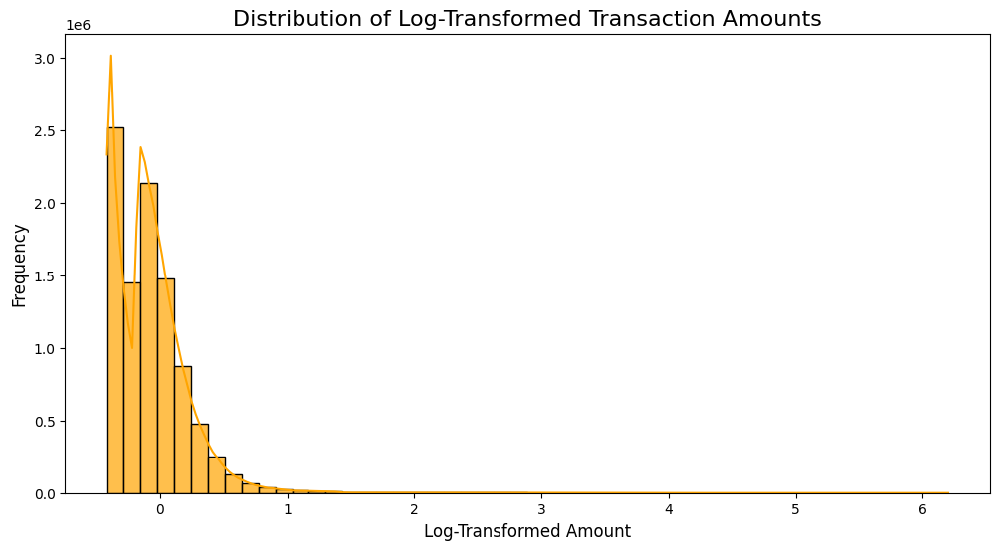

In [ ]:
# Re-ploting the histogram for Log-Transformed Amount
plt.figure(figsize=(12, 6))
sns.histplot(data=processed_df, x='Log_Amount', bins=50, kde=True, color='orange', alpha=0.7)
plt.title("Distribution of Log-Transformed Transaction Amounts", fontsize=16)
plt.xlabel("Log-Transformed Amount", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()



High and Low Transaction Amount Analysis (Investigating top 1% and bottom 1% amounts)

In [ ]:
# Filtering for high and low amounts
high_amounts = processed_df[processed_df['Amount'] > processed_df['Amount'].quantile(0.99)]
low_amounts = processed_df[processed_df['Amount'] < processed_df['Amount'].quantile(0.01)]

# summary statistics
high_amounts_summary = high_amounts.describe().T.reset_index()
low_amounts_summary = low_amounts.describe().T.reset_index()

# Renaming columns for better readability
high_amounts_summary.columns = ['Feature', 'Count', 'Mean', 'Std', 'Min', '25%', '50%', '75%', 'Max']
low_amounts_summary.columns = ['Feature', 'Count', 'Mean', 'Std', 'Min', '25%', '50%', '75%', 'Max']

In [ ]:

# Display summary as DataFrame
print("Top 1% High Amount Transactions:")
display(high_amounts_summary)

print("\nBottom 1% Low Amount Transactions:")
display(low_amounts_summary)

Top 1% High Amount Transactions:


,Feature,Count,Mean,Std,Min,25%,50%,75%,Max
0,Sender_account,95049.0,0.002942,1.002239,-1.734853,-0.868665,-0.004167,0.875546,1.730257
1,Receiver_account,95049.0,0.004490,0.997982,-1.735317,-0.862670,0.007504,0.870886,1.731123
2,Amount,95049.0,5.156197,8.138605,1.415528,1.728937,2.358671,5.076650,492.280275
3,Sender_account_freq,95049.0,-0.198693,0.981004,-1.377563,-1.339551,-0.061404,0.637063,2.176541
4,Receiver_account_freq,95049.0,-0.244106,0.694371,-0.648001,-0.648001,-0.622363,-0.417253,2.044069
...,...,...,...,...,...,...,...,...,...
111,Time_Cluster_Evening,95049.0,0.336511,0.472518,0.000000,0.000000,0.000000,1.000000,1.000000
112,Time_Cluster_Morning,95049.0,0.246378,0.430904,0.000000,0.000000,0.000000,0.000000,1.000000
113,Time_Cluster_Night,95049.0,0.075856,0.264768,0.000000,0.000000,0.000000,0.000000,1.000000
114,Is_laundering,95049.0,0.004598,0.067650,0.000000,0.000000,0.000000,0.000000,1.000000



Bottom 1% Low Amount Transactions:


,Feature,Count,Mean,Std,Min,25%,50%,75%,Max
0,Sender_account,95036.0,-0.017290,0.994657,-1.734875,-0.872442,-0.020584,0.837100,1.730028
1,Receiver_account,95036.0,-0.008345,0.999310,-1.735284,-0.872182,-0.014124,0.850513,1.731139
2,Amount,95036.0,-0.340249,0.000562,-0.341958,-0.340655,-0.340172,-0.339776,-0.339409
3,Sender_account_freq,95036.0,0.454598,0.671762,-1.372811,0.033625,0.489767,0.950660,2.176541
4,Receiver_account_freq,95036.0,-0.518264,0.093954,-0.648001,-0.553993,-0.519808,-0.485623,1.958606
...,...,...,...,...,...,...,...,...,...
111,Time_Cluster_Evening,95036.0,0.304169,0.460057,0.000000,0.000000,0.000000,1.000000,1.000000
112,Time_Cluster_Morning,95036.0,0.252094,0.434217,0.000000,0.000000,0.000000,1.000000,1.000000
113,Time_Cluster_Night,95036.0,0.139936,0.346923,0.000000,0.000000,0.000000,0.000000,1.000000
114,Is_laundering,95036.0,0.002557,0.050502,0.000000,0.000000,0.000000,0.000000,1.000000


Analysis of Sender and Receiver Frequencies:

In [ ]:
# High-Frequency Senders
top_senders = processed_df.sort_values(by='Sender_account_freq', ascending=False).head(20)
print("Top 20 High-Frequency Senders:")
display(top_senders[['Sender_account', 'Sender_account_freq', 'Is_laundering']])


Top 20 High-Frequency Senders:


,Sender_account,Sender_account_freq,Is_laundering
1069615,-0.068613,2.200298,0
8557520,-0.068613,2.200298,0
2056118,-0.068613,2.200298,0
6180385,-0.068613,2.200298,1
3991139,-0.068613,2.200298,0
1347430,-0.068613,2.200298,0
3339756,-0.068613,2.200298,0
8749532,-0.068613,2.200298,0
5826717,-0.068613,2.200298,0
3369088,-0.068613,2.200298,0


In [ ]:
# High-Frequency Receivers
top_receivers = processed_df.sort_values(by='Receiver_account_freq', ascending=False).head(20)
print("Top 20 High-Frequency Receivers:")
display(top_receivers[['Receiver_account', 'Receiver_account_freq', 'Is_laundering']])

Top 20 High-Frequency Receivers:


,Receiver_account,Receiver_account_freq,Is_laundering
1110492,1.246042,5.761689,0
1048650,1.246042,5.761689,0
53611,1.246042,5.761689,0
2509127,1.246042,5.761689,0
8884839,1.246042,5.761689,0
1647463,1.246042,5.761689,0
396562,1.246042,5.761689,0
459501,1.246042,5.761689,0
7195799,1.246042,5.761689,0
7024241,1.246042,5.761689,0


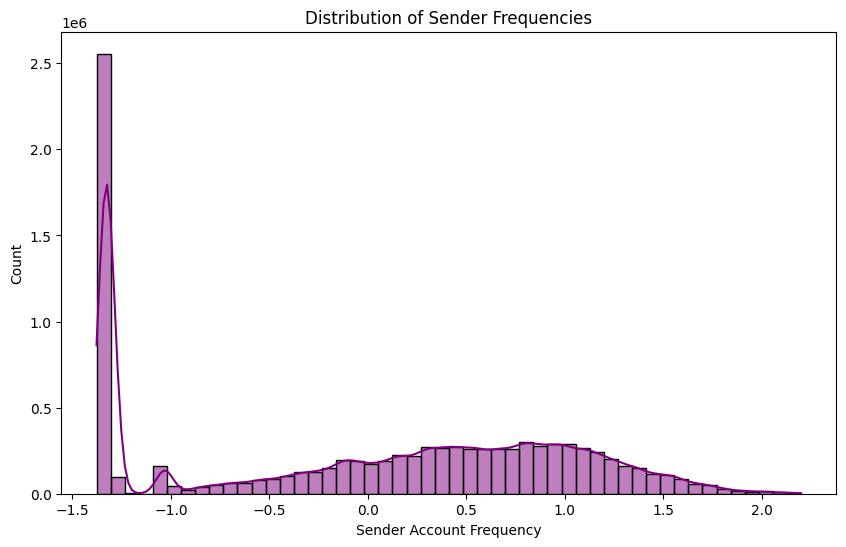

In [ ]:
# Distribution of Sender Frequencies
plt.figure(figsize=(10, 6))
sns.histplot(data=processed_df, x='Sender_account_freq', bins=50, color='purple', kde=True)
plt.title('Distribution of Sender Frequencies')
plt.xlabel('Sender Account Frequency')
plt.ylabel('Count')
plt.show()

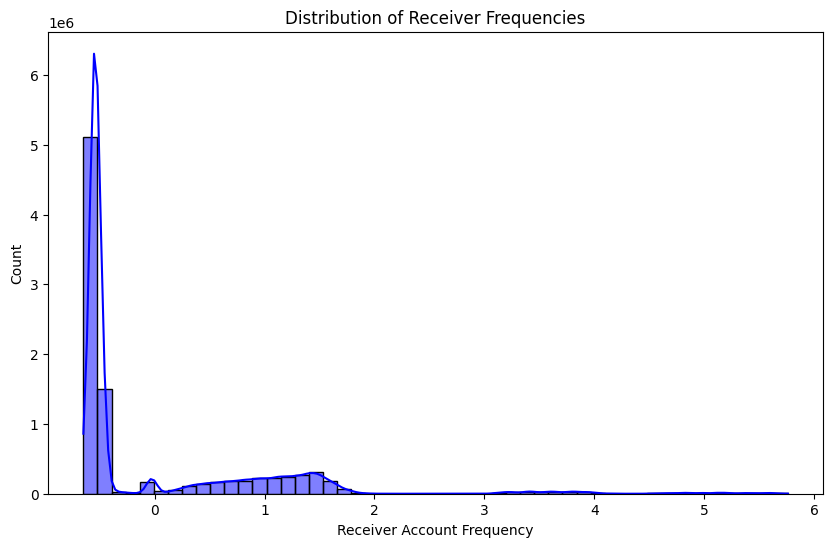

In [ ]:
# Distribution of Receiver Frequencies
plt.figure(figsize=(10, 6))
sns.histplot(data=processed_df, x='Receiver_account_freq', bins=50, color='blue', kde=True)
plt.title('Distribution of Receiver Frequencies')
plt.xlabel('Receiver Account Frequency')
plt.ylabel('Count')
plt.show()

<ipython-input-34-dd0e25d41ec4>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y='Sender_account_freq', palette='coolwarm')


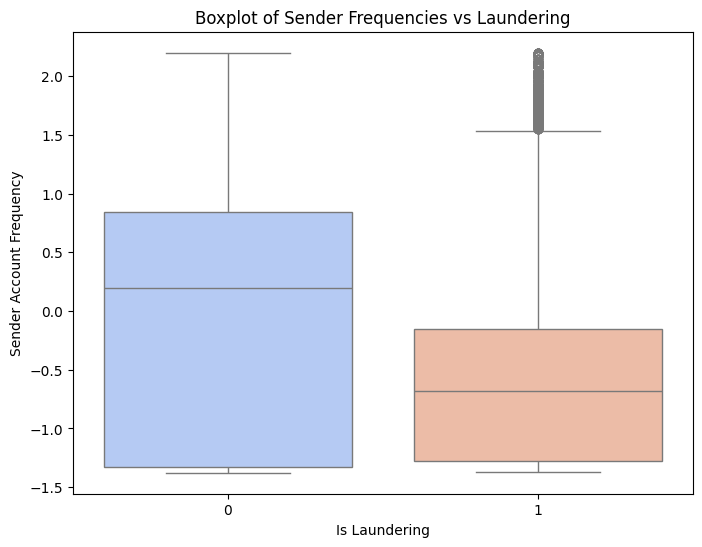

In [ ]:
# Boxplot: Sender Frequencies vs Laundering
plt.figure(figsize=(8, 6))
sns.boxplot(data=processed_df, x='Is_laundering', y='Sender_account_freq', palette='coolwarm')
plt.title('Boxplot of Sender Frequencies vs Laundering')
plt.xlabel('Is Laundering')
plt.ylabel('Sender Account Frequency')
plt.show()

<ipython-input-35-7fc849f86636>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y='Receiver_account_freq', palette='coolwarm')


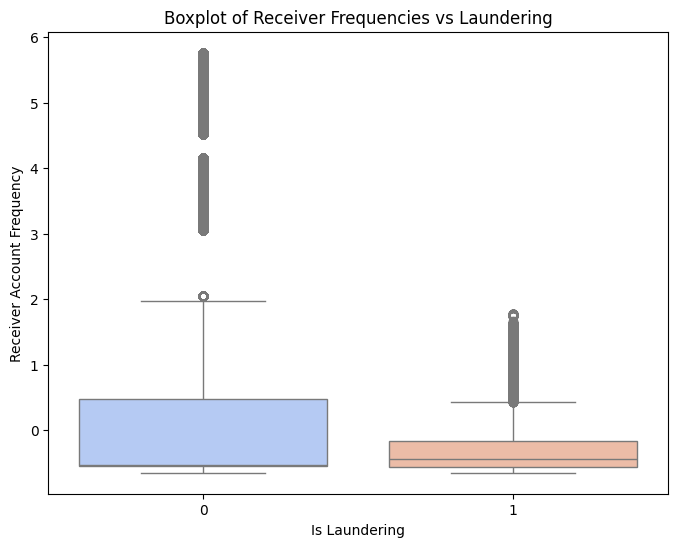

In [ ]:
# Boxplot: Receiver Frequencies vs Laundering
plt.figure(figsize=(8, 6))
sns.boxplot(data=processed_df, x='Is_laundering', y='Receiver_account_freq', palette='coolwarm')
plt.title('Boxplot of Receiver Frequencies vs Laundering')
plt.xlabel('Is Laundering')
plt.ylabel('Receiver Account Frequency')
plt.show()

Temporal Analysis of Transactions

Temporal Analysis of Transactions Across Time Clusters

In [ ]:
# Temporal Analysis of Transactions
def plot_temporal_analysis(df):
    # Check if the necessary columns for temporal analysis are present
    time_columns = ['Time_Cluster_Morning', 'Time_Cluster_Afternoon', 'Time_Cluster_Evening', 'Time_Cluster_Night']
    if not all(col in df.columns for col in time_columns):
        raise ValueError("Required time cluster columns are not present in the dataset.")

    # Calculate the total transactions and laundering transactions for each time cluster
    time_cluster_summary = {}
    for col in time_columns:
        total_transactions = df[col].sum()
        laundering_transactions = df[df['Is_laundering'] == 1][col].sum()
        time_cluster_summary[col] = {
            "Total Transactions": total_transactions,
            "Laundering Transactions": laundering_transactions,
            "Laundering Proportion": laundering_transactions / total_transactions if total_transactions != 0 else 0
        }

    # Convert the summary to a DataFrame for visualization
    time_cluster_df = pd.DataFrame.from_dict(time_cluster_summary, orient='index')

    # Plotting total transactions per time cluster
    plt.figure(figsize=(10, 6))
    sns.barplot(x=time_cluster_df.index, y='Total Transactions', data=time_cluster_df, color="steelblue")
    plt.title("Total Transactions Across Time Clusters")
    plt.xlabel("Time Cluster")
    plt.ylabel("Number of Transactions")
    plt.xticks(rotation=45)
    plt.show()

    # Plotting laundering transactions per time cluster
    plt.figure(figsize=(10, 6))
    sns.barplot(x=time_cluster_df.index, y='Laundering Transactions', data=time_cluster_df, color="orange")
    plt.title("Laundering Transactions Across Time Clusters")
    plt.xlabel("Time Cluster")
    plt.ylabel("Number of Transactions")
    plt.xticks(rotation=45)
    plt.show()

    # Plotting laundering proportion per time cluster
    plt.figure(figsize=(10, 6))
    sns.barplot(x=time_cluster_df.index, y='Laundering Proportion', data=time_cluster_df, palette="viridis")
    plt.title("Laundering Proportion Across Time Clusters")
    plt.xlabel("Time Cluster")
    plt.ylabel("Proportion of Laundering")
    plt.xticks(rotation=45)
    plt.show()

    return time_cluster_df

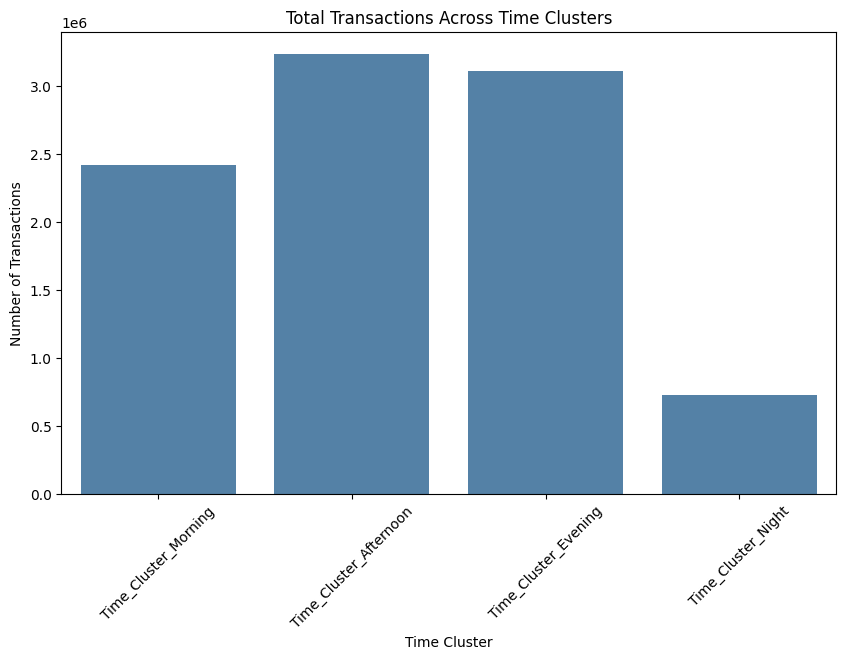

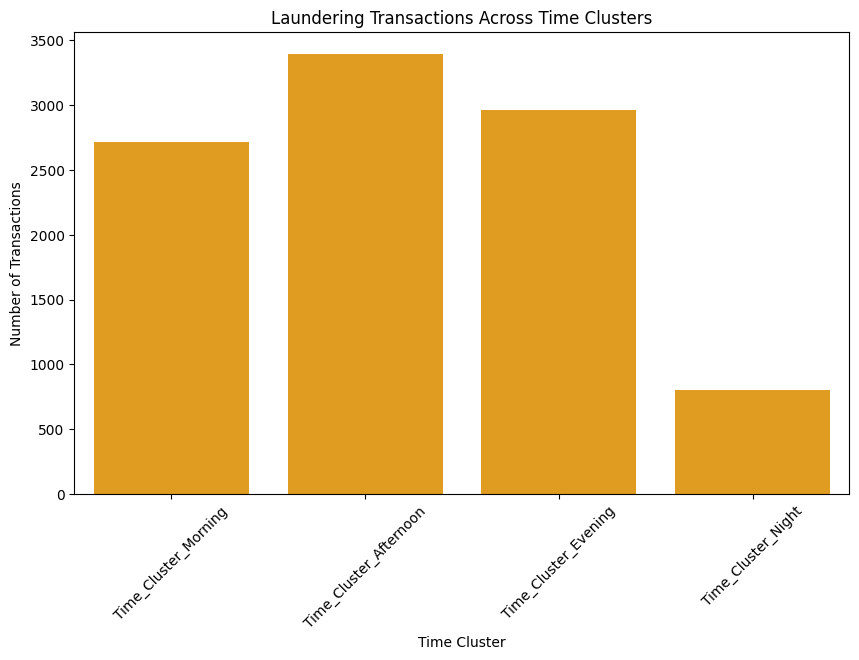

<ipython-input-36-f025cc0e369b>:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=time_cluster_df.index, y='Laundering Proportion', data=time_cluster_df, palette="viridis")


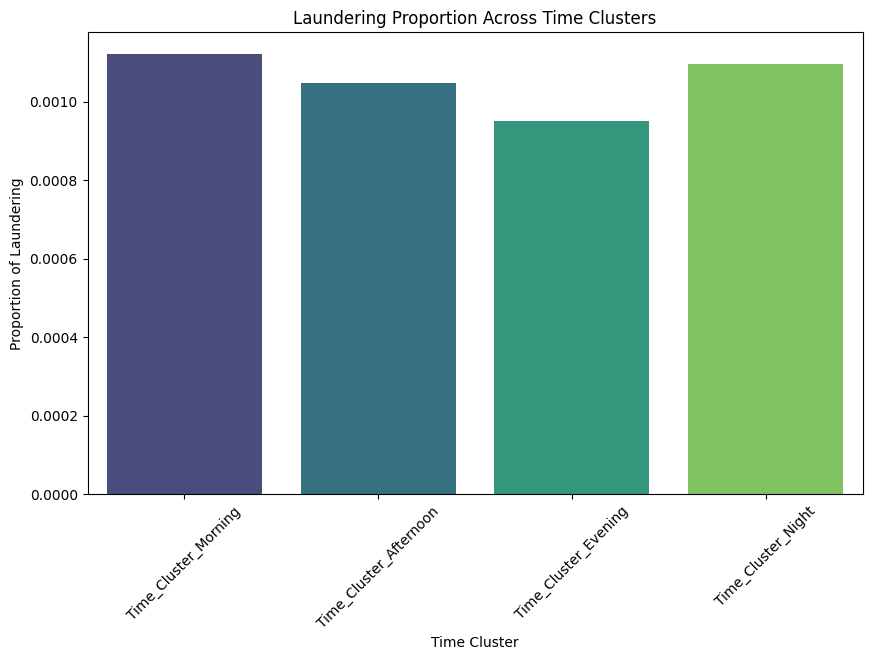

In [ ]:
# Executing Temporal Analysis Function
temporal_analysis_results = plot_temporal_analysis(processed_df)


Temporal Analysis Summary Display

In [ ]:
# Converting temporal_analysis_results into a DataFrame
temporal_analysis_df = pd.DataFrame(temporal_analysis_results)

In [ ]:
# Displaying the DataFrame
print("Summary of Temporal Analysis:")
display(temporal_analysis_df)

Summary of Temporal Analysis:


,Total Transactions,Laundering Transactions,Laundering Proportion
Time_Cluster_Morning,2421860.0,2715.0,0.001121
Time_Cluster_Afternoon,3238424.0,3395.0,0.001048
Time_Cluster_Evening,3114465.0,2963.0,0.000951
Time_Cluster_Night,730103.0,800.0,0.001096


 Exploration of Account Activity Ratios

In [ ]:
# Create histograms for the ratios
ratios = ['Amount_to_Sender_avg_ratio', 'Amount_to_Receiver_avg_ratio', 'Sender_Receiver_Freq_Ratio']

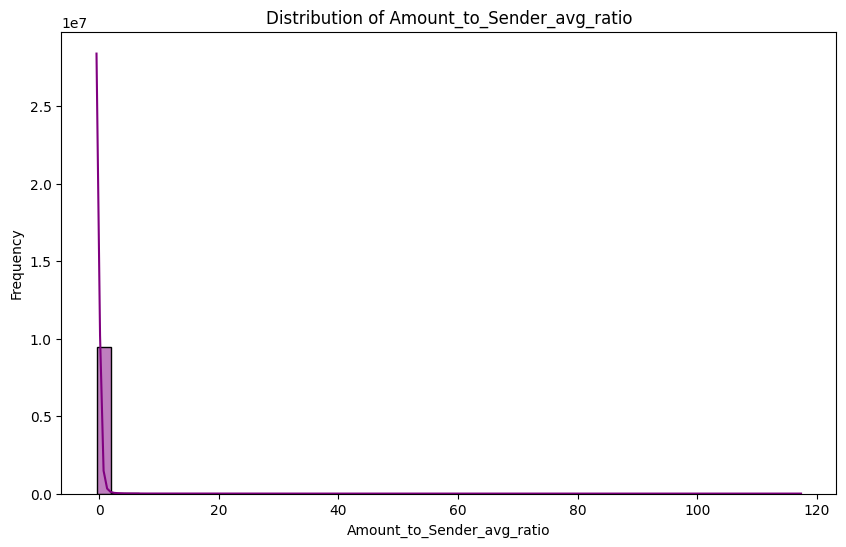

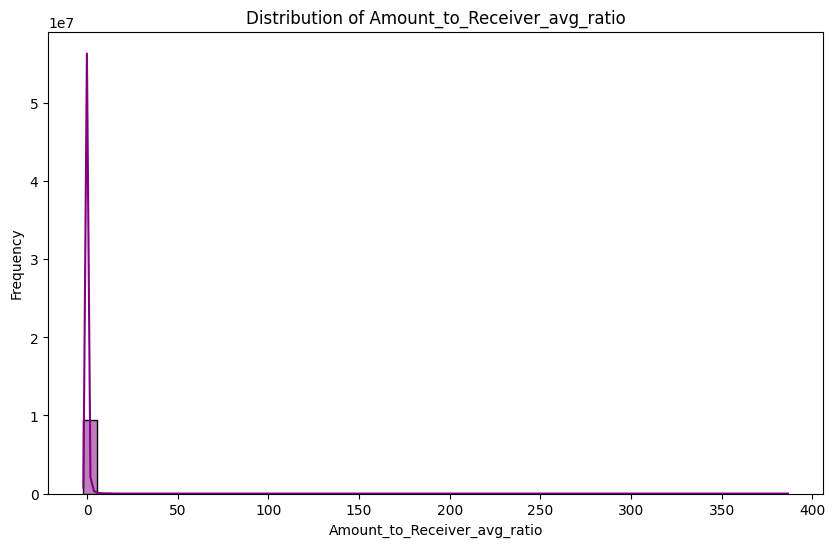

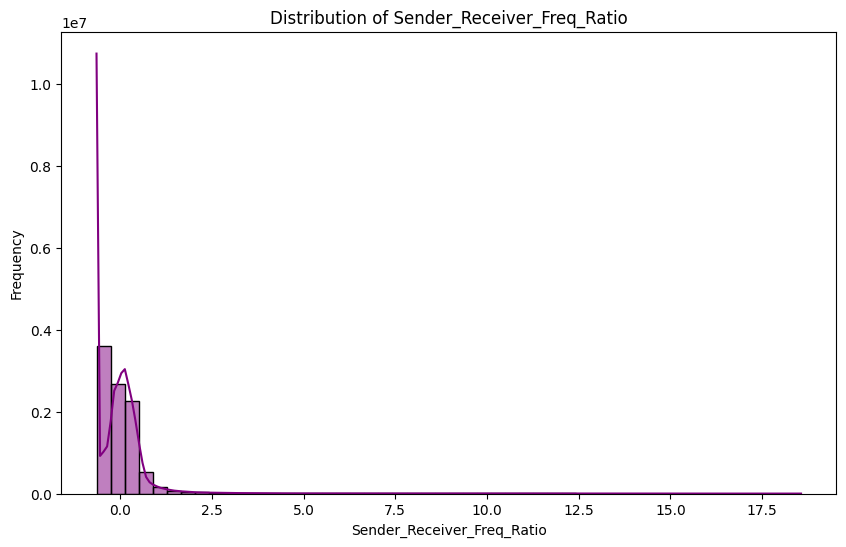

In [ ]:
for ratio in ratios:
    plt.figure(figsize=(10, 6))
    sns.histplot(processed_df[ratio], bins=50, kde=True, color='purple')
    plt.title(f'Distribution of {ratio}')
    plt.xlabel(ratio)
    plt.ylabel('Frequency')
    plt.show()

<ipython-input-53-058146f31c2c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y=ratio, palette='Set2')


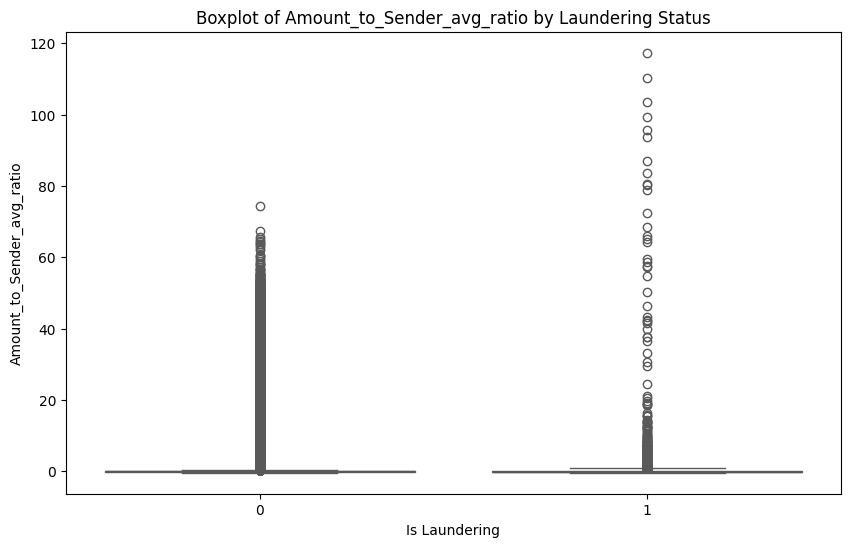

<ipython-input-53-058146f31c2c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y=ratio, palette='Set2')


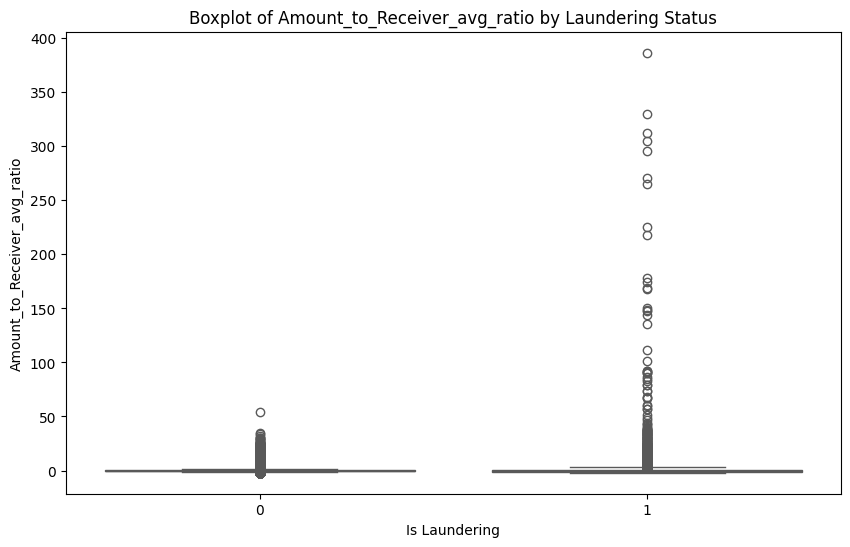

<ipython-input-53-058146f31c2c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=processed_df, x='Is_laundering', y=ratio, palette='Set2')


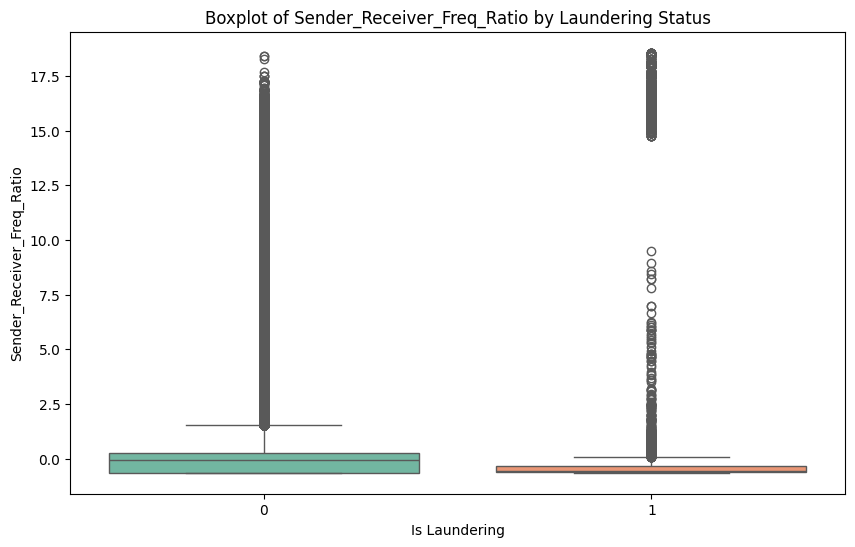

In [ ]:
# Boxplots to compare laundering status for each ratio
for ratio in ratios:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=processed_df, x='Is_laundering', y=ratio, palette='Set2')
    plt.title(f'Boxplot of {ratio} by Laundering Status')
    plt.xlabel('Is Laundering')
    plt.ylabel(ratio)
    plt.show()



In [ ]:
# Printing the summary df

# Summary statistics for ratios by laundering status
summary_stats = processed_df.groupby('Is_laundering')[ratios].describe()

# Convert the multi-level index into a flat DataFrame
summary_stats_flat = summary_stats.reset_index()

In [ ]:
# Display the DataFrame
summary_stats_flat

Is_laundering Amount_to_Sender_avg_ratio                                \
                                     count      mean       std       min   
0             0                  9494979.0 -0.000332  0.991438 -0.424722   
1             1                     9873.0  0.318822  4.158985 -0.424600   

                                            Amount_to_Receiver_avg_ratio  ...  \
        25%       50%       75%         max                        count  ...   
0 -0.273285 -0.023452  0.005737   74.425332                    9494979.0  ...   
1 -0.340708 -0.185899  0.104345  117.350349                       9873.0  ...   

                        Sender_Receiver_Freq_Ratio                      \
        75%         max                      count      mean       std   
0  0.149023   54.222327                  9494979.0 -0.000883  0.989470   
1  0.422555  386.561170                     9873.0  0.849599  4.519681   

                                                      
        min       25%       50%       75%        max  
0 -0.643743 -0.641165 -0.079183  0.237916  18.435062  
1 -0.643643 -0.622373 -0.580142 -0.339652  18.562424  

[2 rows x 25 columns]

# **Step- 5 :- Modeling**

**Preparing Dataset FOR MODELING**

Features Included in selected_features
I included 37 features based on their relevance and importance, derived from the exploratory data analysis (EDA) insights and previous visualizations. Here is the breakdown:

1. Amount-Based Features (7 features)
These represent the transactional behavior and relationships:

**Amount
Log_Amount
Sender_account_freq: Frequency of sender transactions.
Receiver_account_freq: Frequency of receiver transactions.
Amount_to_Sender_avg_ratio: Ratio of transaction amount to the sender's average.
Amount_to_Receiver_avg_ratio: Ratio of transaction amount to the receiver's average, Sender_Receiver_Freq_Ratio: Frequency ratio of sender and receiver**

Why included?
From EDA, it was observed patterns in high/low transaction amounts, frequency trends, and laundering proportions. These features help capture anomalies and key behavioral differences between laundering and non-laundering transactions.

2. Payment and Received Currencies (20 features)
Payment Currencies: Payment_currency_* (10 features)
Received Currencies: Received_currency_* (10 features)
Why included?
EDA revealed laundering proportions for specific currencies like Moroccan dirham and Pakistani rupee. Currency-related features are crucial for capturing potential laundering hotspots.

3. Temporal Features (4 features)
Time_Cluster_Afternoon
Time_Cluster_Evening
Time_Cluster_Morning
Time_Cluster_Night
Why included?
From the temporal analysis, laundering proportions varied across time clusters, especially during night transactions. These features provide temporal insights into laundering behavior.

These features were included based on:

EDA Insights: Each feature aligns with the patterns and anomalies identified in previous visualizations and steps. For example:

Amount-based features were important for high/low amount analysis.
Currency features were critical for laundering patterns.
Time clusters were essential for temporal trends.
Diversity: The selected features cover multiple dimensions:

Transactional behavior (amount-based features)
Categorical trends (currencies, time clusters)
Interaction-based patterns (frequency ratios).
Machine Learning Readiness: These features are meaningful and potentially predictive for training a model to detect laundering.


All these selected features are grounded in the insights from EDA.
They provide a balance between categorical, numerical, and temporal dimensions.
Redundant or noisy features have been excluded.

importing neccessary libraries

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

Feature Selection for modeling

In [ ]:
selected_features = [
    'Amount', 'Log_Amount', 'Sender_account_freq', 'Receiver_account_freq',
    'Amount_to_Sender_avg_ratio', 'Amount_to_Receiver_avg_ratio', 'Sender_Receiver_Freq_Ratio',
    'Payment_currency_Albanian lek', 'Payment_currency_Dirham', 'Payment_currency_Euro',
    'Payment_currency_Indian rupee', 'Payment_currency_Mexican Peso', 'Payment_currency_Moroccan dirham',
    'Payment_currency_Naira', 'Payment_currency_Pakistani rupee', 'Payment_currency_Swiss franc',
    'Payment_currency_Turkish lira', 'Payment_currency_UK pounds', 'Payment_currency_US dollar',
    'Payment_currency_Yen', 'Received_currency_Albanian lek', 'Received_currency_Dirham',
    'Received_currency_Euro', 'Received_currency_Indian rupee', 'Received_currency_Mexican Peso',
    'Received_currency_Moroccan dirham', 'Received_currency_Naira', 'Received_currency_Pakistani rupee',
    'Received_currency_Swiss franc', 'Received_currency_Turkish lira', 'Received_currency_UK pounds',
    'Received_currency_US dollar', 'Received_currency_Yen', 'Time_Cluster_Afternoon',
    'Time_Cluster_Evening', 'Time_Cluster_Morning', 'Time_Cluster_Night'
]
target = 'Is_laundering'


Dividing dataset into train and test data

In [ ]:
# Filtering dataset with selected features
X = processed_df[selected_features]
y = processed_df[target]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)



Scaling continuous features

In [ ]:
# Applying standard scaler
scaler = StandardScaler()
continuous_features = [
    'Amount', 'Log_Amount', 'Sender_account_freq', 'Receiver_account_freq',
    'Amount_to_Sender_avg_ratio', 'Amount_to_Receiver_avg_ratio', 'Sender_Receiver_Freq_Ratio'
]
X_train[continuous_features] = scaler.fit_transform(X_train[continuous_features])
X_test[continuous_features] = scaler.transform(X_test[continuous_features])


Displaying the prepared training data

In [ ]:
X_train_df = pd.DataFrame(X_train, columns=selected_features)
y_train_df = pd.Series(y_train, name='Is_laundering')

In [ ]:
# Display the first 10 rows of the training data
print("Training Dataset Preview:")
display(X_train_df.head(50))

# Display the target distribution in a DataFrame
y_train_distribution = y_train_df.value_counts().reset_index()
y_train_distribution.columns = ['Is_laundering', 'Count']

print("\nTarget Distribution in Training Set:")
display(y_train_distribution)

Training Dataset Preview:


,Amount,Log_Amount,Sender_account_freq,Receiver_account_freq,Amount_to_Sender_avg_ratio,Amount_to_Receiver_avg_ratio,Sender_Receiver_Freq_Ratio,Payment_currency_Albanian lek,Payment_currency_Dirham,Payment_currency_Euro,...,Received_currency_Pakistani rupee,Received_currency_Swiss franc,Received_currency_Turkish lira,Received_currency_UK pounds,Received_currency_US dollar,Received_currency_Yen,Time_Cluster_Afternoon,Time_Cluster_Evening,Time_Cluster_Morning,Time_Cluster_Night
1704229,0.470641,1.497042,0.603899,-0.511348,0.654429,0.349484,-0.017592,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
312713,-0.032804,0.125160,1.539931,-0.545544,0.120506,0.004103,0.560987,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
8578361,0.328817,1.164291,0.504119,-0.554093,0.328164,0.022255,0.198746,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
8878206,-0.125270,-0.202393,1.634959,-0.545544,-0.103186,-0.000736,0.600166,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
86771,-0.260466,-0.748158,1.235839,-0.502800,-0.324470,0.054928,0.135788,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4141263,-0.335134,-1.093036,0.328316,-0.571190,-0.401273,-0.249926,0.273023,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
8066343,-0.141342,-0.262769,0.461356,-0.545544,0.012112,0.000093,0.116308,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
371854,0.131993,0.639211,0.333067,-0.545544,0.057721,-0.013422,0.063416,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
9394440,-0.228989,-0.612855,0.898488,-0.502800,-0.246852,0.131556,0.035338,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4986238,-0.105949,-0.131230,-0.080307,-0.545544,-0.142966,-0.008401,-0.107012,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0



Target Distribution in Training Set:


,Is_laundering,Count
0,0,7595983
1,1,7898


# **MODEL TRAINING**

Following models will be used for this project:


1.   **Random Forrest**
2.   **XG BOOST**
3.   **TCN Model**
4.   **TCN Model with Attention Layer**



# **XG BOOST & RANDOM FORREST Model**

In [ ]:
pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.0/199.0 MB 5.3 MB/s eta 0:00:00


In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve, average_precision_score

In [ ]:
# Initialize dictionaries to store results
model_results = {}


In [ ]:
# Train Random Forest
print("\nTraining Random Forest...\n")
rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    class_weight='balanced',
    max_depth=10
)
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)
y_prob_rf = rf_model.predict_proba(X_test)[:, 1]


Training Random Forest...



In [ ]:
model_results['Random Forest'] = {
    "confusion_matrix": confusion_matrix(y_test, y_pred_rf),
    "classification_report": classification_report(y_test, y_pred_rf),
    "roc_auc": roc_auc_score(y_test, y_prob_rf),
    "accuracy": accuracy_score(y_test, y_pred_rf),
}

In [ ]:
# Train XGBoost
print("\nTraining XGBoost...\n")
xgb_model = XGBClassifier(
    n_estimators=100,
    random_state=42,
    scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]),  # Handles class imbalance
    max_depth=10
)
xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)
y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]




Training XGBoost...



In [ ]:
model_results['XGBoost'] = {
    "confusion_matrix": confusion_matrix(y_test, y_pred_xgb),
    "classification_report": classification_report(y_test, y_pred_xgb),
    "roc_auc": roc_auc_score(y_test, y_prob_xgb),
    "accuracy": accuracy_score(y_test, y_pred_xgb),
}

In [ ]:
# Display results
for model_name, results in model_results.items():
    print(f"\nModel: {model_name}")
    print("Confusion Matrix:\n", results["confusion_matrix"])
    print("\nClassification Report:\n", results["classification_report"])
    print("\nROC-AUC Score:", results["roc_auc"])
    print("\nAccuracy Score:", results["accuracy"])


Model: Random Forest
Confusion Matrix:
 [[1820398   78598]
 [     88    1887]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.96      0.98   1898996
           1       0.02      0.96      0.05      1975

    accuracy                           0.96   1900971
   macro avg       0.51      0.96      0.51   1900971
weighted avg       1.00      0.96      0.98   1900971


ROC-AUC Score: 0.9925795617622968

Accuracy Score: 0.9586074695510873

Model: XGBoost
Confusion Matrix:
 [[1898081     915]
 [    311    1664]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   1898996
           1       0.65      0.84      0.73      1975

    accuracy                           1.00   1900971
   macro avg       0.82      0.92      0.87   1900971
weighted avg       1.00      1.00      1.00   1900971


ROC-AUC Score: 0.9948793277065714

Accuracy Score: 0.9993550664370998


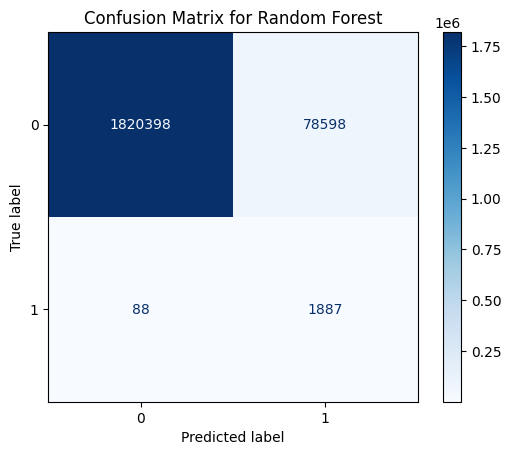

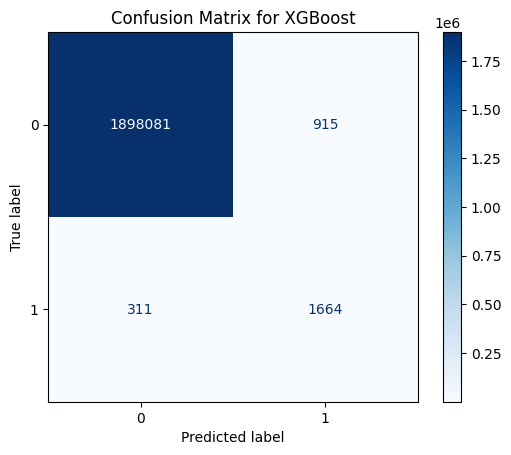

In [ ]:
# Ploting confusion matrix for each model
for model_name, results in model_results.items():
    disp = ConfusionMatrixDisplay(confusion_matrix=results["confusion_matrix"], display_labels=[0, 1])
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

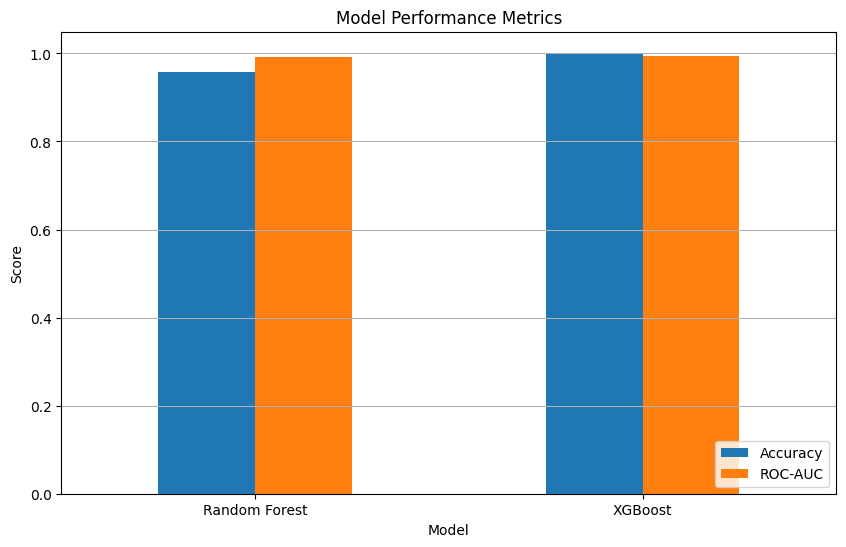

In [ ]:
# Creating a summary DataFrame of model metrics
metrics_df = pd.DataFrame({
    "Model": list(model_results.keys()),
    "Accuracy": [results["accuracy"] for results in model_results.values()],
    "ROC-AUC": [results["roc_auc"] for results in model_results.values()]
})

# Plot metrics
metrics_df.set_index("Model").plot(kind="bar", figsize=(10, 6))
plt.title("Model Performance Metrics")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.legend(loc="lower right")
plt.grid(axis="y")
plt.show()

In [ ]:
# Feature Importance for RF and XGBoost
plt.figure(figsize=(12, 6))
rf_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

xgb_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': xgb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)


<Figure size 1200x600 with 0 Axes>

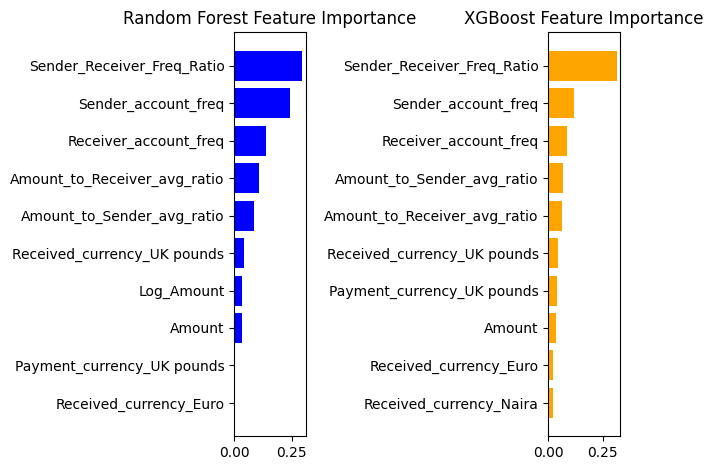

In [ ]:
# Plot RF Feature Importance
plt.subplot(1, 2, 1)
plt.barh(rf_importances['Feature'].head(10), rf_importances['Importance'].head(10), color='blue')
plt.gca().invert_yaxis()
plt.title('Random Forest Feature Importance')

# Plot XGBoost Feature Importance
plt.subplot(1, 2, 2)
plt.barh(xgb_importances['Feature'].head(10), xgb_importances['Importance'].head(10), color='orange')
plt.gca().invert_yaxis()
plt.title('XGBoost Feature Importance')

plt.tight_layout()
plt.show()

**Improving the accuracy and scores of Laundering class (additionally Handling Class Imbalance)**

**Applying SMOTE Without Affecting the Entire Dataset**

In [ ]:
pip install imblearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 5.8 MB/s eta 0:00:00


In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.metrics import classification_report, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score, precision_score, recall_score, f1_score

In [ ]:
# Initializing SMOTE
smote = SMOTE(random_state=42)

# Applying SMOTE to the training data
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [ ]:
# Checking the new class distribution
print("Class distribution after applying SMOTE:")
print(Counter(y_train_smote))

Class distribution after applying SMOTE:
Counter({0: 7595983, 1: 7595983})


Training XGBoost and Random Forrest Models with SMOTE Balanced Data

In [ ]:
# Checking the new class distribution
print("Class distribution after applying SMOTE:")
print(Counter(y_train_smote))

Class distribution after applying SMOTE:
Counter({0: 7595983, 1: 7595983})


# **RANDOM FORREST Model with SMOTE**

In [ ]:
# Optimizing and Training Random Forest
rf_smote = RandomForestClassifier(
    random_state=42,
    n_estimators=50,       # Reduced number of trees
    max_depth=15,          # Limit tree depth
    max_features='sqrt',   # Subset of features for splits
    n_jobs=-1              # Use all CPU cores
)
rf_smote.fit(X_train_smote, y_train_smote)


RandomForestClassifier(max_depth=15, n_estimators=50, n_jobs=-1,
                       random_state=42)

In [ ]:
# Predicting probabilities on test data
y_probs_rf_smote = rf_smote.predict_proba(X_test)[:, 1]


In [ ]:
# Threshold tuning and predictions
threshold = 0.5  # Default threshold
y_pred_rf_smote = (y_probs_rf_smote >= threshold).astype(int)

# Evaluate the Model
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf_smote))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99   1898996
           1       0.04      0.95      0.07      1975

    accuracy                           0.98   1900971
   macro avg       0.52      0.96      0.53   1900971
weighted avg       1.00      0.98      0.99   1900971



In [ ]:
# Compute ROC-AUC
roc_auc = roc_auc_score(y_test, y_probs_rf_smote)
print(f"\nROC-AUC Score: {roc_auc:.4f}")


ROC-AUC Score: 0.9949


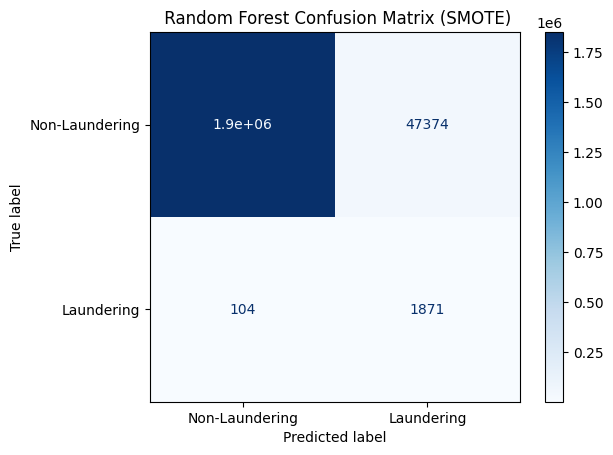

In [ ]:
# Displaying Confusion Matrix
cm = ConfusionMatrixDisplay.from_predictions(
    y_test, y_pred_rf_smote, display_labels=["Non-Laundering", "Laundering"], cmap='Blues'
)
plt.title(" Random Forest Confusion Matrix (SMOTE)")
plt.show()

# **XGBOOST Model with SMOTE**

In [ ]:
# Train XGBoost
xgb_smote = XGBClassifier(random_state=42)
xgb_smote.fit(X_train_smote, y_train_smote)

# Predict probabilities on test data
y_probs_xgb_smote = xgb_smote.predict_proba(X_test)[:, 1]

print("XGBoost training completed.")

XGBoost training completed.


In [ ]:
# XG BOOST Evaluation

# XGBoost predictions
y_pred_xgb_smote = xgb_smote.predict(X_test)

In [ ]:
# Metrics for XGBoost
xgb_confusion_matrix = confusion_matrix(y_test, y_pred_xgb_smote)
xgb_classification_report = classification_report(y_test, y_pred_xgb_smote)
xgb_roc_auc = roc_auc_score(y_test, y_probs_xgb_smote)
xgb_accuracy = accuracy_score(y_test, y_pred_xgb_smote)


In [ ]:
print("\nXGBoost Evaluation:")
print("Confusion Matrix:\n", xgb_confusion_matrix)
print("\nClassification Report:\n", xgb_classification_report)
print("\nROC-AUC Score:", xgb_roc_auc)
print("\nAccuracy Score:", xgb_accuracy)


XGBoost Evaluation:
Confusion Matrix:
 [[1883403   15593]
 [    145    1830]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00   1898996
           1       0.11      0.93      0.19      1975

    accuracy                           0.99   1900971
   macro avg       0.55      0.96      0.59   1900971
weighted avg       1.00      0.99      1.00   1900971


ROC-AUC Score: 0.9966953560883645

Accuracy Score: 0.991721073072656


In [ ]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_xgb_smote)

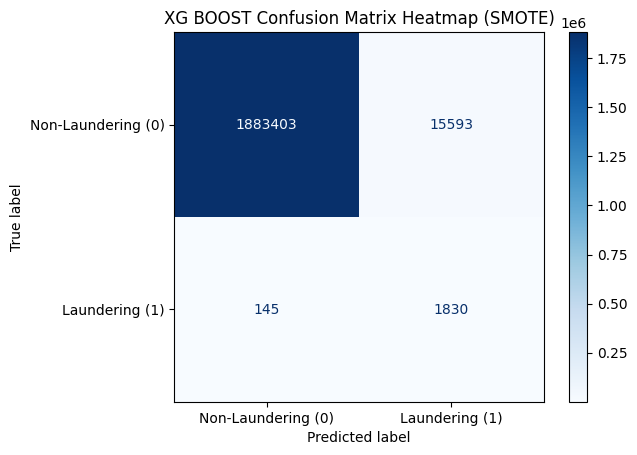

In [ ]:
# Ploting confusion matrix heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering (0)", "Laundering (1)"])
disp.plot(cmap='Blues', values_format='d')
plt.title("XG BOOST Confusion Matrix Heatmap (SMOTE)")
plt.show()

In [ ]:
# Metrics for Random Forest
rf_accuracy = accuracy_score(y_test, y_pred_rf_smote)
rf_precision = precision_score(y_test, y_pred_rf_smote)
rf_recall = recall_score(y_test, y_pred_rf_smote)
rf_f1 = f1_score(y_test, y_pred_rf_smote)

# Metrics for XGBoost
xgb_precision = precision_score(y_test, y_pred_xgb_smote)
xgb_recall = recall_score(y_test, y_pred_xgb_smote)
xgb_f1 = f1_score(y_test, y_pred_xgb_smote)


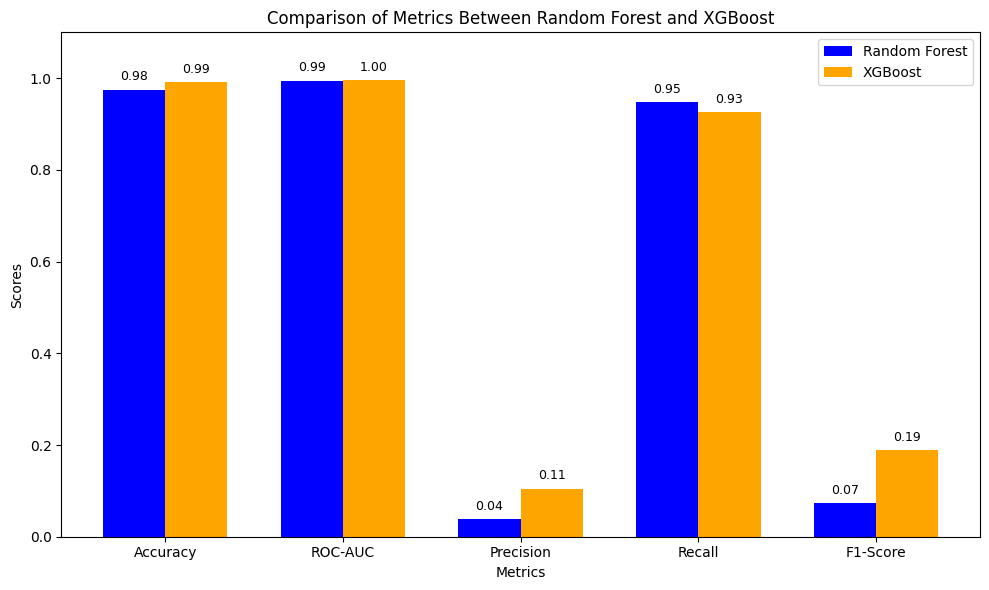

In [ ]:
# Metrics Comparison
metrics = ['Accuracy', 'ROC-AUC', 'Precision', 'Recall', 'F1-Score']
rf_values = [rf_accuracy, roc_auc, rf_precision, rf_recall, rf_f1]
xgb_values = [xgb_accuracy, xgb_roc_auc, xgb_precision, xgb_recall, xgb_f1]

# Plotting
x = np.arange(len(metrics))  # Label locations
width = 0.35  # Bar width

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, rf_values, width, label='Random Forest', color='blue')
plt.bar(x + width/2, xgb_values, width, label='XGBoost', color='orange')

# Add labels, title, and legend
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Comparison of Metrics Between Random Forest and XGBoost')
plt.xticks(x, metrics)
plt.ylim(0, 1.1)  # Set y-axis limit for better visibility
plt.legend()

# Add value labels on bars
for i, (rf, xgb) in enumerate(zip(rf_values, xgb_values)):
    plt.text(i - width/2, rf + 0.02, f"{rf:.2f}", ha='center', fontsize=9)
    plt.text(i + width/2, xgb + 0.02, f"{xgb:.2f}", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
# Feature importance for Random Forest
rf_feature_importance = rf_smote.feature_importances_
rf_sorted_idx = np.argsort(rf_feature_importance)[::-1]  # Sort in descending order

# Feature importance for XGBoost
xgb_feature_importance = xgb_smote.feature_importances_
xgb_sorted_idx = np.argsort(xgb_feature_importance)[::-1]  # Sort in descending order

# Feature names (assuming they are in the dataset)
feature_names = X_train.columns



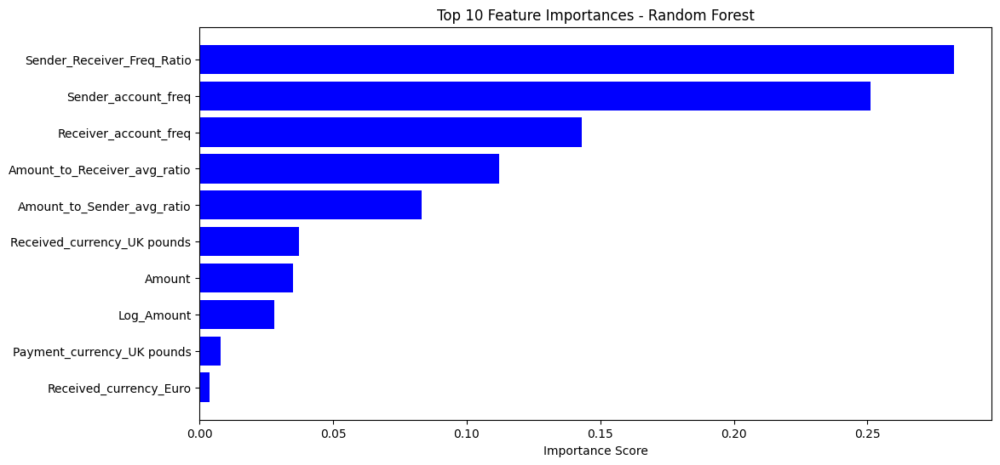

In [ ]:
# Plot Feature Importance for Random Forest
plt.figure(figsize=(12, 6))
plt.barh(range(len(rf_sorted_idx[:10])), rf_feature_importance[rf_sorted_idx[:10]], align="center", color="blue")
plt.yticks(range(len(rf_sorted_idx[:10])), feature_names[rf_sorted_idx[:10]])
plt.xlabel("Importance Score")
plt.title("Top 10 Feature Importances - Random Forest")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()



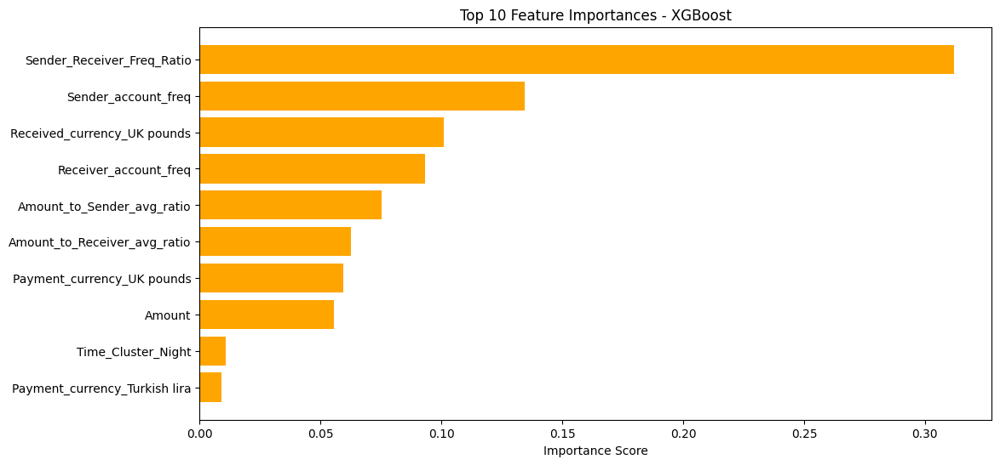

In [ ]:
# Plot Feature Importance for XGBoost
plt.figure(figsize=(12, 6))
plt.barh(range(len(xgb_sorted_idx[:10])), xgb_feature_importance[xgb_sorted_idx[:10]], align="center", color="orange")
plt.yticks(range(len(xgb_sorted_idx[:10])), feature_names[xgb_sorted_idx[:10]])
plt.xlabel("Importance Score")
plt.title("Top 10 Feature Importances - XGBoost")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

**XG BOOST Fine-Tune Hyperparameters**

In this step, we'll perform hyperparameter tuning for the XGBoost model using GridSearchCV or RandomizedSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

In [ ]:
# Defining a focused parameter grid
param_grid = {
    "n_estimators": [100, 200],
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
}


In [ ]:
# Initialize the XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)

In [ ]:
# Perform RandomizedSearchCV with memory optimization
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid,
    n_iter=20,  # Moderate number of iterations
    scoring="roc_auc",
    cv=3,  # Stratified 3-fold cross-validation
    verbose=1,
    random_state=42,
    n_jobs=1  # Use a single thread to reduce memory overhead
)

In [ ]:
# Fit the model on the entire dataset
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:07:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:07:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:07:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:07:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:08:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_iter=20, n_jobs=1,
                   param_distributions={'colsample_bytree': [0.8, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [100, 200],
                                        'subsample': [0.8, 1.0]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [ ]:

# Output the best parameters and score
print("Best Parameters:", random_search.best_params_)
print("Best ROC-AUC Score:", random_search.best_score_)

Best Parameters: {'subsample': 0.8, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1, 'colsample_bytree': 0.8}
Best ROC-AUC Score: 0.9970260155629019


In [ ]:
# Extract the best parameters
best_params = random_search.best_params_

# Retrain the model with the best parameters
best_xgb_model = xgb.XGBClassifier(
    **best_params,
    use_label_encoder=False,
    eval_metric="logloss",
    random_state=42
)

best_xgb_model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [11:22:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Make predictions
y_pred = best_xgb_model.predict(X_test)
y_prob = best_xgb_model.predict_proba(X_test)[:, 1]  # Probability scores for the positive class

Confusion Matrix:
 [[1898950      46]
 [    412    1563]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   1898996
           1       0.97      0.79      0.87      1975

    accuracy                           1.00   1900971
   macro avg       0.99      0.90      0.94   1900971
weighted avg       1.00      1.00      1.00   1900971


ROC-AUC Score: 0.997138239151076


<ipython-input-31-245c879eb6e7>:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', color='red')


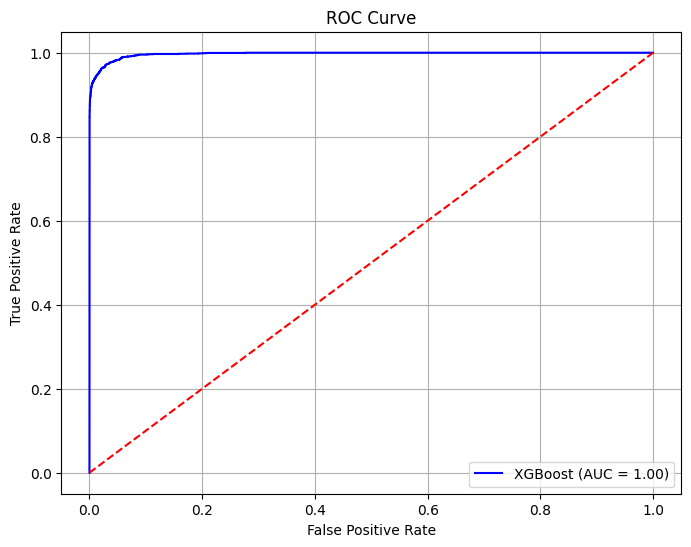

In [ ]:
# Confusion matrix and classification report
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# ROC-AUC score
roc_auc = roc_auc_score(y_test, y_prob)
print("\nROC-AUC Score:", roc_auc)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"XGBoost (AUC = {roc_auc:.2f})", color='blue')
plt.plot([0, 1], [0, 1], 'k--', color='red')
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()

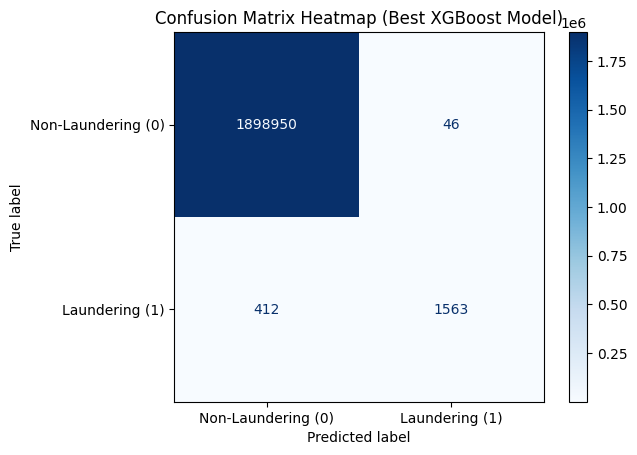

In [ ]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix heatmap
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering (0)", "Laundering (1)"])
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix Heatmap (Best XGBoost Model)")
plt.show()

In [ ]:
# Calculating Precision-Recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_prob)
average_precision = average_precision_score(y_test, y_prob)

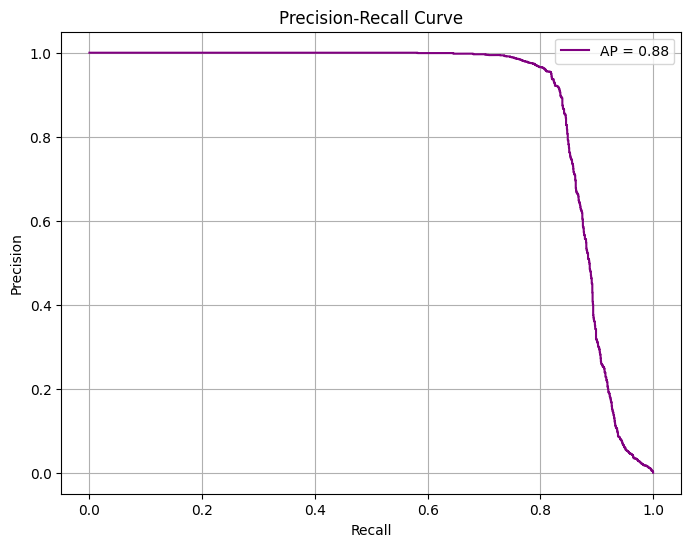

In [ ]:
# Ploting Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f"AP = {average_precision:.2f}", color='purple')
plt.title("Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid()
plt.show()


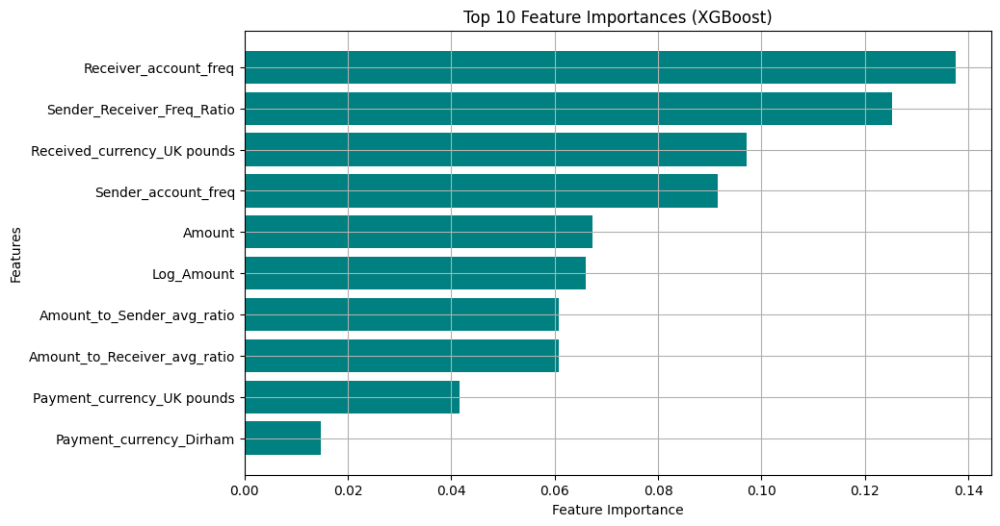

In [ ]:
# Extracting feature importances
importances = best_xgb_model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

# Plot top 10 important features
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"][:10], feature_importance_df["Importance"][:10], color='teal')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Top 10 Feature Importances (XGBoost)")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.grid()
plt.show()

<ipython-input-35-751c5ceb5e38>:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', color='red')


<Figure size 800x600 with 0 Axes>

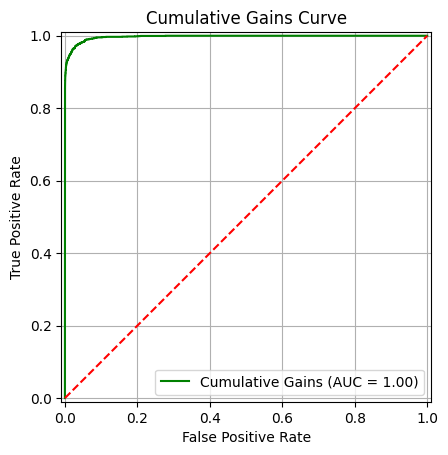

In [ ]:
from sklearn.metrics import RocCurveDisplay

# Plot cumulative gains curve
plt.figure(figsize=(8, 6))
RocCurveDisplay.from_predictions(y_test, y_prob, name="Cumulative Gains", color='green')
plt.plot([0, 1], [0, 1], 'k--', color='red')
plt.title("Cumulative Gains Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid()
plt.show()

**XGBOOST Threshold Tuning**

In [ ]:
from sklearn.metrics import precision_recall_curve, classification_report, confusion_matrix, roc_auc_score


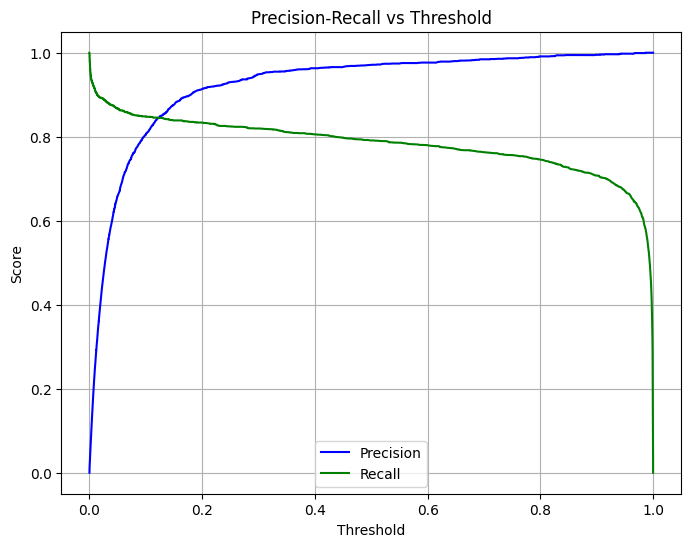

In [ ]:
# Predict probabilities for the positive class
y_prob = best_xgb_model.predict_proba(X_test)[:, 1]

# Compute precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_prob)

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label="Precision", color='blue')
plt.plot(thresholds, recall[:-1], label="Recall", color='green')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold")
plt.legend()
plt.grid()
plt.show()



In [ ]:
# Choose a new threshold (e.g., based on the curve or business needs)
optimal_threshold = 0.4  # Replace with a value observed from the curve

# Make new predictions based on the adjusted threshold
y_pred_threshold = (y_prob >= optimal_threshold).astype(int)

# Evaluate the new predictions
print("Confusion Matrix with Adjusted Threshold:")
print(confusion_matrix(y_test, y_pred_threshold))

print("\nClassification Report with Adjusted Threshold:")
print(classification_report(y_test, y_pred_threshold))

Confusion Matrix with Adjusted Threshold:
[[1898935      61]
 [    384    1591]]

Classification Report with Adjusted Threshold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1898996
           1       0.96      0.81      0.88      1975

    accuracy                           1.00   1900971
   macro avg       0.98      0.90      0.94   1900971
weighted avg       1.00      1.00      1.00   1900971



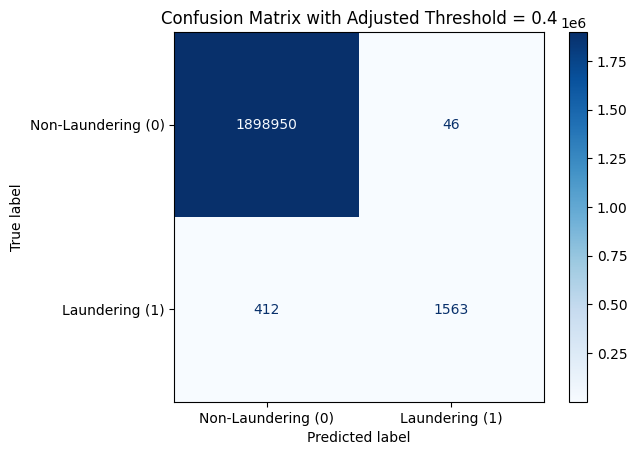

In [ ]:
# Visualize the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering (0)", "Laundering (1)"])
disp.plot(cmap='Blues', values_format='d')
plt.title(f"Confusion Matrix with Adjusted Threshold = {optimal_threshold}")
plt.show()

**RANDOM FORREST Fine-Tune Hyperparameters**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

In [ ]:
# Subset dataset for faster tuning
X_train_smote_subset = X_train_smote[:1000000]
y_train_smote_subset = y_train_smote[:1000000]

In [ ]:
# Defining a simplified parameter grid
param_grid = {
    "n_estimators": [10, 20, 50],
    "max_depth": [5, 7, 10],
    "max_features": ["sqrt"],
}

In [ ]:
# Initialize Random Forest model
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)


In [ ]:
# Perform RandomizedSearchCV
random_search_rf = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=param_grid,
    n_iter=5,  # Fewer iterations for faster processing
    scoring="roc_auc",
    cv=2,  # Use 2-fold CV to reduce time
    verbose=1,
    random_state=42,
    n_jobs=-1
)

In [ ]:
# Performing hyperparameter tuning on the entire SMOTE dataset
print("Starting Random Forest hyperparameter tuning...")
# Run tuning
random_search_rf.fit(X_train_smote_subset, y_train_smote_subset)

Starting Random Forest hyperparameter tuning...
Fitting 2 folds for each of 5 candidates, totalling 10 fits


RandomizedSearchCV(cv=2,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 10],
                                        'max_features': ['sqrt'],
                                        'n_estimators': [10, 20, 50]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [ ]:
# Getting the best parameters
best_params_rf = random_search_rf.best_params_
print("Best Parameters:", best_params_rf)

Best Parameters: {'n_estimators': 50, 'max_features': 'sqrt', 'max_depth': 10}


In [ ]:
# Train final model on the full dataset
rf_best = RandomForestClassifier(
    n_estimators=best_params_rf["n_estimators"],
    max_depth=best_params_rf["max_depth"],
    max_features=best_params_rf["max_features"],
    random_state=42
)
rf_best.fit(X_train_smote, y_train_smote)

RandomForestClassifier(max_depth=10, n_estimators=50, random_state=42)

In [ ]:
# Evaluating the final model on the test set
y_pred_rf = rf_best.predict(X_test)
print("Final Model Evaluation:")
print(classification_report(y_test, y_pred_rf))

Final Model Evaluation:
              precision    recall  f1-score   support

           0       1.00      0.95      0.98   1898996
           1       0.02      0.96      0.04      1975

    accuracy                           0.95   1900971
   macro avg       0.51      0.96      0.51   1900971
weighted avg       1.00      0.95      0.97   1900971



**Threshold Adjustment**

In [ ]:
# Predicting probabilities for the positive class
y_probs_rf = rf_best.predict_proba(X_test)[:, 1]

# Computing Precision-Recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_probs_rf)


In [ ]:
# Computing F1 scores at each threshold
f1_scores = 2 * (precision * recall) / (precision + recall)


In [ ]:
# Finding the threshold with the maximum F1-score
optimal_threshold = thresholds[f1_scores.argmax()]
print(f"Optimal Threshold (Max F1-Score): {optimal_threshold:.4f}")
print(f"Precision at Optimal Threshold: {precision[f1_scores.argmax()]:.4f}")
print(f"Recall at Optimal Threshold: {recall[f1_scores.argmax()]:.4f}")
print(f"F1-Score at Optimal Threshold: {f1_scores.max():.4f}")

Optimal Threshold (Max F1-Score): 0.9066
Precision at Optimal Threshold: 0.7664
Recall at Optimal Threshold: 0.5499
F1-Score at Optimal Threshold: 0.6403


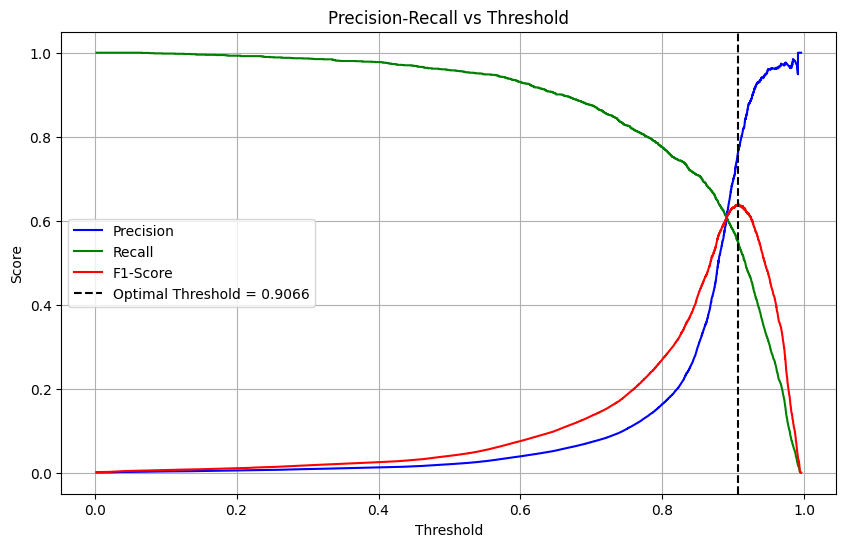

In [ ]:
# Ploting Precision, Recall, and F1-Score vs Threshold
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision[:-1], label="Precision", color='blue')
plt.plot(thresholds, recall[:-1], label="Recall", color='green')
plt.plot(thresholds, f1_scores[:-1], label="F1-Score", color='red')
plt.axvline(optimal_threshold, color='black', linestyle='--', label=f'Optimal Threshold = {optimal_threshold:.4f}')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold")
plt.legend()
plt.grid()
plt.show()


In [ ]:
# Making predictions with the adjusted threshold
y_pred_threshold_rf = (y_probs_rf >= optimal_threshold).astype(int)


In [ ]:
# Evaluate the model with the adjusted threshold
print("Confusion Matrix with Adjusted Threshold:")
cm = confusion_matrix(y_test, y_pred_threshold_rf)
print(cm)
print("\nClassification Report with Adjusted Threshold:")
print(classification_report(y_test, y_pred_threshold_rf))


Confusion Matrix with Adjusted Threshold:
[[1898665     331]
 [    889    1086]]

Classification Report with Adjusted Threshold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   1898996
           1       0.77      0.55      0.64      1975

    accuracy                           1.00   1900971
   macro avg       0.88      0.77      0.82   1900971
weighted avg       1.00      1.00      1.00   1900971



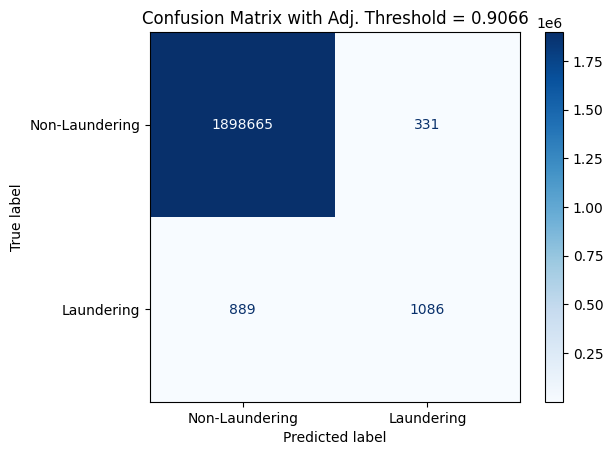

In [ ]:
# Ploting confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering", "Laundering"])
disp.plot(cmap='Blues', values_format='d')  # 'd' ensures integer formatting
plt.title(f"Confusion Matrix with Adj. Threshold = {optimal_threshold:.4f}")
plt.show()

<ipython-input-55-e5f98eaa0084>:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', color='red')


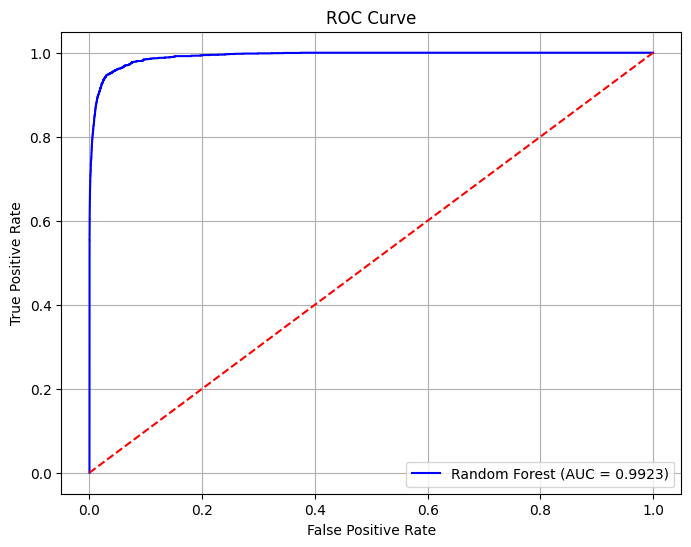

In [ ]:
# Ploting ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_probs_rf)  # `y_probs_rf` are the predicted probabilities for the positive class
roc_auc = roc_auc_score(y_test, y_probs_rf)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"Random Forest (AUC = {roc_auc:.4f})", color='blue')
plt.plot([0, 1], [0, 1], 'k--', color='red')
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()

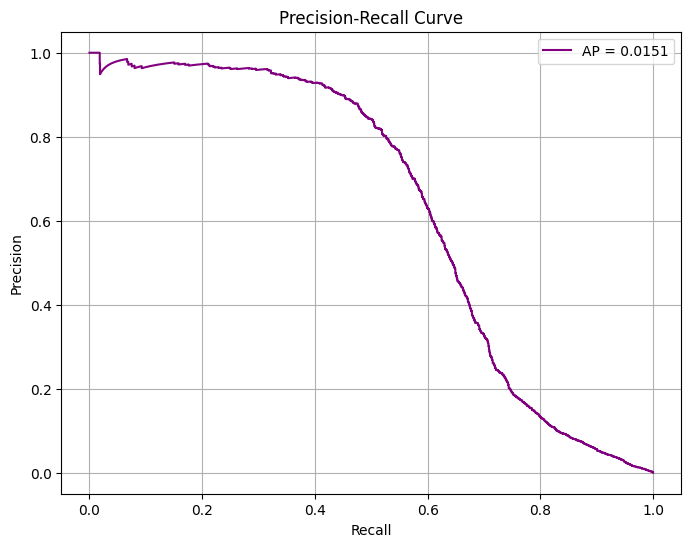

In [ ]:
# Ploting Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_probs_rf)
average_precision = np.mean(precision)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f"AP = {average_precision:.4f}", color='purple')
plt.title("Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid()
plt.show()


<ipython-input-57-503ed0a8bc1f>:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', label="Baseline", color='red')


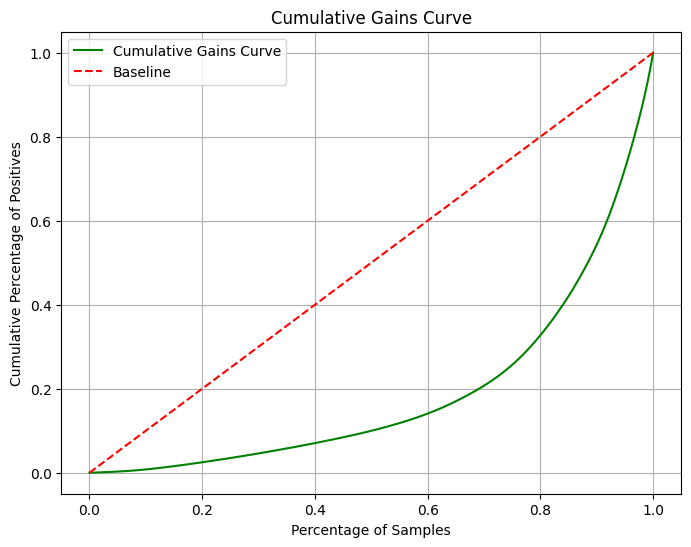

In [ ]:
# Ploting Cumulative Gains Curve
plt.figure(figsize=(8, 6))
cumulative_positive_rate = np.cumsum(np.sort(y_probs_rf) / np.sum(y_probs_rf))
baseline = np.linspace(0, 1, len(cumulative_positive_rate))

plt.plot(baseline, cumulative_positive_rate, label="Cumulative Gains Curve", color='green')
plt.plot([0, 1], [0, 1], 'k--', label="Baseline", color='red')
plt.title("Cumulative Gains Curve")
plt.xlabel("Percentage of Samples")
plt.ylabel("Cumulative Percentage of Positives")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Extracting feature importances
importances = rf_best.feature_importances_
feature_names = X_train.columns

In [ ]:
# Creating a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)



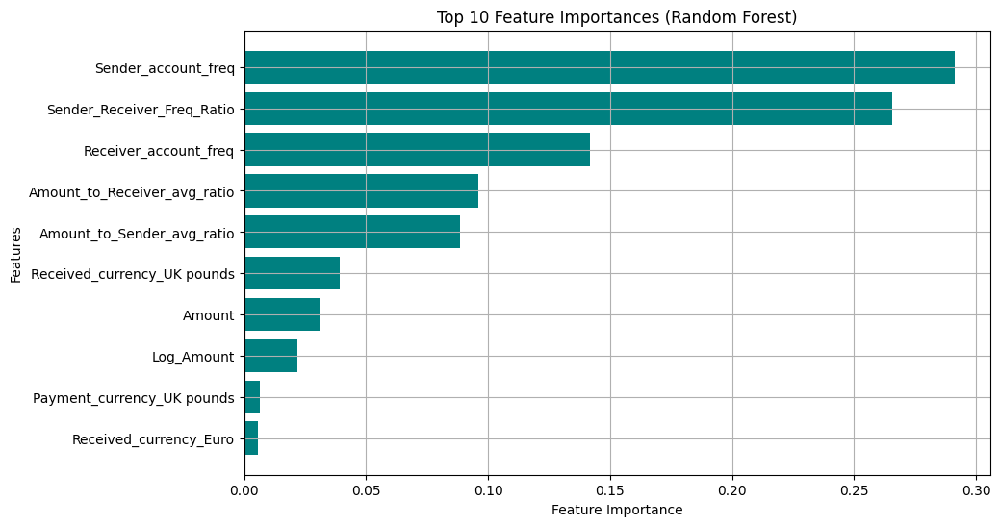

In [ ]:
# Ploting top 10 important features
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"][:10], feature_importance_df["Importance"][:10], color='teal')
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.title("Top 10 Feature Importances (Random Forest)")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.grid()
plt.show()

In [ ]:
# Compare Precision, Recall, and F1-score
metrics_comparison = pd.DataFrame({
    "Metric": ["Precision", "Recall", "F1-Score"],
    "Default Threshold": [
        precision[0], recall[0], 2 * (precision[0] * recall[0]) / (precision[0] + recall[0])
    ],
    "Optimal Threshold": [
        precision[f1_scores.argmax()], recall[f1_scores.argmax()], f1_scores.max()
    ]
})



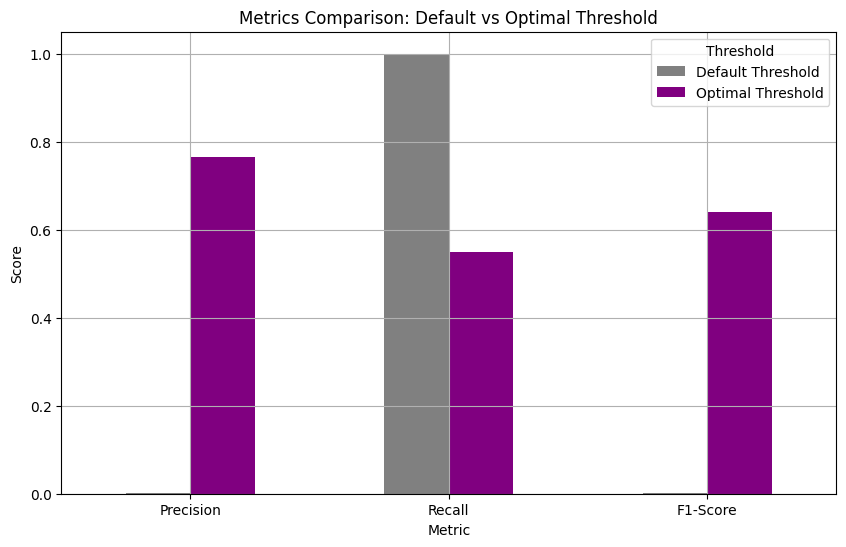

In [ ]:
# Ploting comparison b/w RF and XGB
metrics_comparison.set_index("Metric").plot(kind="bar", figsize=(10, 6), color=["gray", "purple"])
plt.title("Metrics Comparison: Default vs Optimal Threshold")
plt.ylabel("Score")
plt.xticks(rotation=0)
plt.grid()
plt.legend(title="Threshold")
plt.show()

**DEEP LEARNING MODELS**

# **TCN MODEL**

The Temporal Convolutional Network (TCN) model, enhanced with attention layers, has been studied in several research areas, but its application in Anti-Money Laundering (AML) is still quite new. A related approach, known as Temporal Convolutional Attention-based Networks (TCAN), has been utilized in domains like language modeling and time-series forecasting, yielding promising results for sequential data tasks. TCANs capitalize on TCN's exceptional ability to capture temporal patterns while incorporating an attention mechanism that emphasizes key events or features in the sequence. This addition of attention not only improves the model's interpretability but also its overall effectiveness, making it ideal for applications that require tracking and understanding long-term dependencies, such as AML detection.

In [ ]:
pip install keras-tcn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 11.3 MB/s eta 0:00:00


In [ ]:
pip install imblearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 5.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.utils import to_categorical
from sklearn.utils.class_weight import compute_class_weight
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.metrics import AUC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_auc_score, precision_recall_curve, roc_curve
from tcn import TCN, compiled_tcn
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.metrics import AUC
from tensorflow.keras.metrics import AUC, Recall
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, LearningRateScheduler


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy
from sklearn.calibration import calibration_curve


In [ ]:
# Separating features and target
target_col = 'Is_laundering'

# Features and target
X = processed_df.drop(columns=[target_col])  # Features
y = processed_df[target_col]  # Target

In [ ]:
# Verifing shapes
print(f"Shape of Features (X): {X.shape}")
print(f"Shape of Target (y): {y.shape}")

Shape of Features (X): (9504852, 114)
Shape of Target (y): (9504852,)


In [ ]:
# Reshaping Data for TCN Model
# Converting to sequences
sequence_length = 5
X_seq = np.array([X.values[i:i + sequence_length] for i in range(len(X) - sequence_length + 1)])
y_seq = y.values[sequence_length - 1:]


In [ ]:
# Spliting data into train, validation, and test sets
X_seq_train, X_seq_test, y_seq_train, y_seq_test = train_test_split(
    X_seq, y_seq, test_size=0.2, random_state=42, stratify=y_seq
)
X_seq_train, X_seq_val, y_seq_train, y_seq_val = train_test_split(
    X_seq_train, y_seq_train, test_size=0.2, random_state=42, stratify=y_seq_train
)

print(f"Training Data Shape: {X_seq_train.shape}, {y_seq_train.shape}")
print(f"Validation Data Shape: {X_seq_val.shape}, {y_seq_val.shape}")
print(f"Test Data Shape: {X_seq_test.shape}, {y_seq_test.shape}")

Training Data Shape: (6083102, 5, 114), (6083102,)
Validation Data Shape: (1520776, 5, 114), (1520776,)
Test Data Shape: (1900970, 5, 114), (1900970,)


In [ ]:
# APPLYING SMOTE TO BALANCE CLASSES
smote = SMOTE(sampling_strategy=0.1, random_state=42)
X_seq_train_res, y_seq_train_res = smote.fit_resample(
    X_seq_train.reshape(-1, X_seq_train.shape[1] * X_seq_train.shape[2]),
    y_seq_train
)
X_seq_train_res = X_seq_train_res.reshape(-1, X_seq_train.shape[1], X_seq_train.shape[2])

In [ ]:
print("After SMOTE:", X_seq_train_res.shape, y_seq_train_res.shape)

After SMOTE: (6684462, 5, 114) (6684462,)


In [ ]:
# CUSTOM WEIGHTED BCE LOSS FUNCTION

def weighted_bce_loss(y_true, y_pred):
    class_weights = tf.constant([1.0, 5.0])  # Moderate class weights
    y_true = tf.cast(y_true, tf.int32)
    weights = tf.gather(class_weights, y_true)
    bce = BinaryCrossentropy()
    return tf.reduce_mean(bce(y_true, y_pred) * weights)

In [ ]:

# DEFINING THE ENHANCED TCN MODEL

def build_tcn_model(input_shape):
    model = models.Sequential()
    model.add(
        TCN(
            nb_filters=64,               # Reduced filters for efficiency
            kernel_size=3,               # Kernel size
            dilations=[1, 2, 4],         # Dilation rates
            dropout_rate=0.3,            # Dropout for regularization
            return_sequences=False,      # Final output layer
            input_shape=input_shape
        )
    )
    model.add(layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))  # Binary output
    return model


# Build the model
input_shape = (X_seq_train.shape[1], X_seq_train.shape[2])  # Sequence length, features
tcn_model = build_tcn_model(input_shape)

In [ ]:
# Compile the model
tcn_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss=weighted_bce_loss,
    metrics=['accuracy', AUC(name='auc'), tf.keras.metrics.Recall(name='recall')]
)

tcn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 tcn (TCN)                   (None, 64)                91072     
                                                                 
 dense (Dense)               (None, 64)                4160      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 97345 (380.25 KB)
Trainable params: 97345 

In [ ]:
# DEFINING CALLBACKS

# Learning Rate Warm-Up
def lr_schedule(epoch, lr):
    if epoch < 5:
        return lr * 0.5
    return lr

callbacks_list = [
    EarlyStopping(monitor='val_recall', patience=5, mode='max', restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
    ModelCheckpoint(filepath='tcn_smote_best.h5', monitor='val_recall', save_best_only=True, mode='max', verbose=1),
    LearningRateScheduler(lr_schedule, verbose=1)
]

In [ ]:

# MODEL TRAINING

batch_size = 128
history = tcn_model.fit(
    X_seq_train_res, y_seq_train_res,
    validation_data=(X_seq_val, y_seq_val),
    epochs=25,
    batch_size=batch_size,
    callbacks=callbacks_list,
    verbose=1
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/25
52223/52223 [==============================] - ETA: 0s - loss: 0.0083 - accuracy: 0.9993 - auc: 0.9998 - recall: 0.9936
Epoch 1: val_recall improved from -inf to 1.00000, saving model to tcn_smote_best.h5
52223/52223 [==============================] - 714s 14ms/step - loss: 0.0083 - accuracy: 0.9993 - auc: 0.9998 - recall: 0.9936 - val_loss: 0.0013 - val_accuracy: 1.0000 - val_auc: 1.0000 - val_recall: 1.0000 - lr: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 2/25
    9/52223 [..............................] - ETA: 11:28 - loss: 0.0013 - accuracy: 1.0000 - auc: 1.0000 - recall: 1.0000

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


52222/52223 [============================>.] - ETA: 0s - loss: 5.0820e-04 - accuracy: 1.0000 - auc: 1.0000 - recall: 0.9999
Epoch 2: val_recall did not improve from 1.00000
52223/52223 [==============================] - 699s 13ms/step - loss: 5.0820e-04 - accuracy: 1.0000 - auc: 1.0000 - recall: 0.9999 - val_loss: 2.4811e-04 - val_accuracy: 1.0000 - val_auc: 1.0000 - val_recall: 1.0000 - lr: 2.5000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 3/25
52220/52223 [============================>.] - ETA: 0s - loss: 9.6556e-04 - accuracy: 0.9999 - auc: 1.0000 - recall: 1.0000
Epoch 3: val_recall did not improve from 1.00000
52223/52223 [==============================] - 700s 13ms/step - loss: 9.6552e-04 - accuracy: 0.9999 - auc: 1.0000 - recall: 1.0000 - val_loss: 1.1069e-04 - val_accuracy: 1.0000 - val_auc: 0.9997 - val_recall: 0.9994 - lr: 1.2500e-04

Epoch 4: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 4/25
52221/5

In [ ]:
# SAVING THE FINAL MODEL

tcn_model.save('tcn_model_final.h5')
print("Training completed and model saved as 'tcn_model_final.h5'")

Training completed and model saved as 'tcn_model_final.h5'


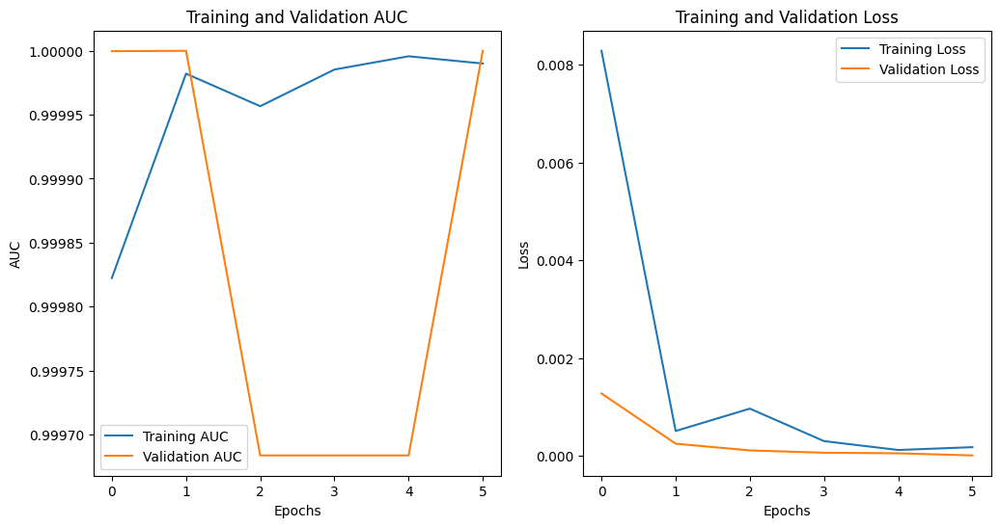

In [ ]:
# Ploting Training and Validation Metrics
plt.figure(figsize=(12, 6))

# Plot AUC
plt.subplot(1, 2, 1)
plt.plot(history.history['auc'], label='Training AUC')
plt.plot(history.history['val_auc'], label='Validation AUC')
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.title('Training and Validation AUC')
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [ ]:
# Evaluation on the test set
y_pred_prob = tcn_model.predict(X_seq_test)
y_pred = (y_pred_prob > 0.5).astype(int)


In [ ]:
# Confusion matrix and classification report
cm = confusion_matrix(y_seq_test, y_pred)
print("Confusion Matrix:\n", cm)
print("\nClassification Report:\n", classification_report(y_seq_test, y_pred))

# ROC-AUC score
roc_auc = roc_auc_score(y_seq_test, y_pred_prob)
print("\nTest ROC-AUC Score:", roc_auc)

Confusion Matrix:
 [[1898994       1]
 [      3    1972]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   1898995
           1       1.00      1.00      1.00      1975

    accuracy                           1.00   1900970
   macro avg       1.00      1.00      1.00   1900970
weighted avg       1.00      1.00      1.00   1900970


Test ROC-AUC Score: 0.9997468339765728


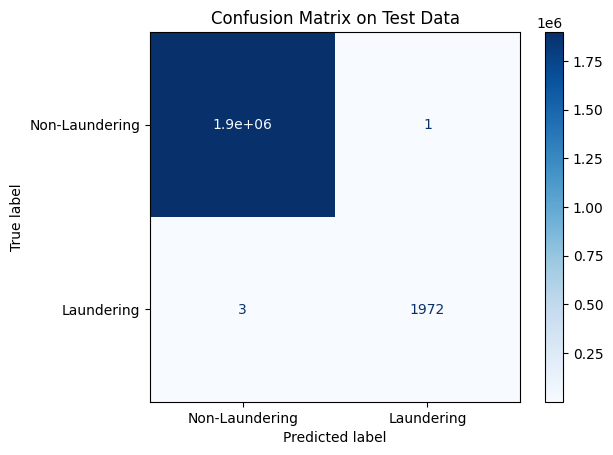

In [ ]:
# Displaying Confusion Matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering", "Laundering"])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix on Test Data")
plt.show()

In [ ]:

# PLOTING TRAINING AND VALIDATION METRICS

def plot_training_metrics(history):
    # Training Loss and Validation Loss
    plt.figure(figsize=(12, 8))

    # 1. Loss Plot
    plt.subplot(2, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    # 2. Accuracy Plot
    plt.subplot(2, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    # 3. AUC Plot
    plt.subplot(2, 2, 3)
    plt.plot(history.history['auc'], label='Training AUC')
    plt.plot(history.history['val_auc'], label='Validation AUC')
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.title('Training and Validation AUC')
    plt.legend()

    # 4. Recall Plot
    plt.subplot(2, 2, 4)
    plt.plot(history.history['recall'], label='Training Recall')
    plt.plot(history.history['val_recall'], label='Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.title('Training and Validation Recall')
    plt.legend()

    plt.tight_layout()
    plt.show()



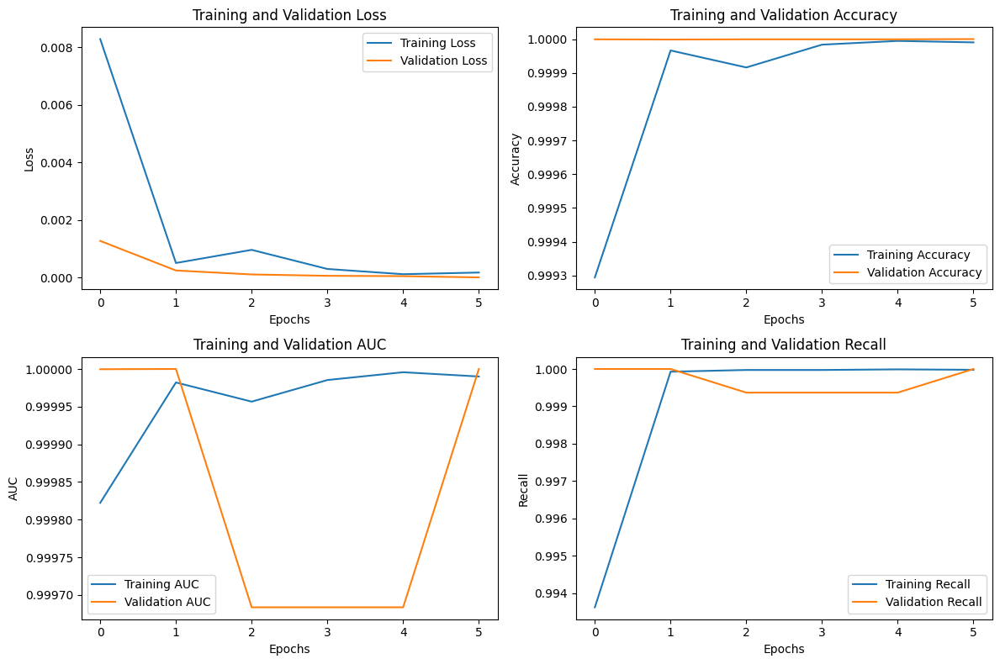

In [ ]:
# Calling the above defined function to plot metrics
plot_training_metrics(history)

In [ ]:
# PLOTING LEARNING RATE SCHEDULE

def plot_learning_rate(history):
    # Extract learning rate values from the history
    lr_values = history.history.get('lr', None)
    if lr_values:
        plt.figure(figsize=(8, 5))
        plt.plot(lr_values, marker='o', linestyle='-', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Learning Rate')
        plt.title('Learning Rate Schedule')
        plt.show()
    else:
        print("No learning rate history found. Check if LearningRateScheduler was used.")

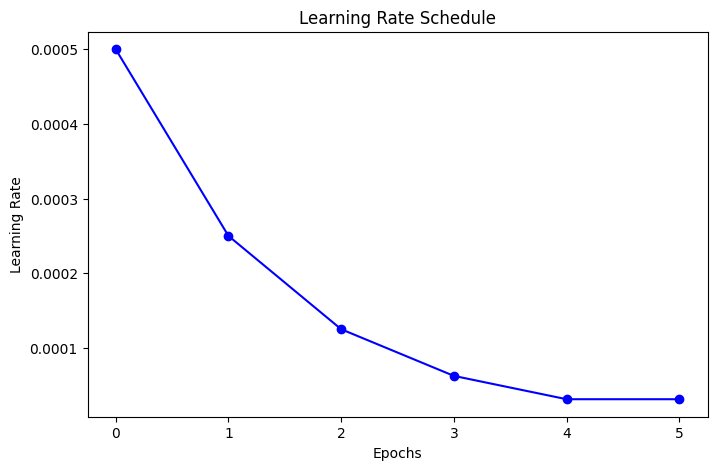

In [ ]:
# Call the function to plot learning rate
plot_learning_rate(history)

**TCN MODEL TUNING | THRESHOLD ADJUSTMENT**

In [ ]:
# Predicting probabilities on validation data
y_val_pred_prob = tcn_model.predict(X_seq_val)


47525/47525 [==============================] - 123s 3ms/step


In [ ]:
# Computing Precision-Recall Curve
precision, recall, thresholds = precision_recall_curve(y_seq_val, y_val_pred_prob)

# Appending a threshold value for plotting consistency
thresholds = np.append(thresholds, 1.0)  # Add a dummy threshold at the end to match lengths



In [ ]:
# Calculating F1-scores for each threshold
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)

In [ ]:
# Finding the threshold with the maximum F1-score
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

In [ ]:
print(f"Optimal Threshold (Max F1-Score): {optimal_threshold:.4f}")
print(f"Precision at Optimal Threshold: {precision[optimal_idx]:.4f}")
print(f"Recall at Optimal Threshold: {recall[optimal_idx]:.4f}")
print(f"F1-Score at Optimal Threshold: {f1_scores[optimal_idx]:.4f}")

Optimal Threshold (Max F1-Score): 0.6325
Precision at Optimal Threshold: 0.9994
Recall at Optimal Threshold: 1.0000
F1-Score at Optimal Threshold: 0.9997


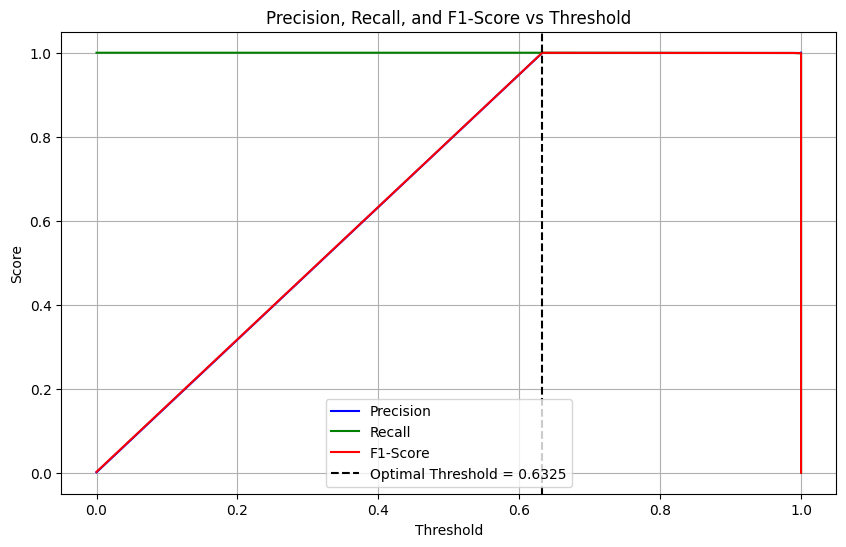

In [ ]:
# Ploting Precision-Recall vs Threshold
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision, label='Precision', color='blue')
plt.plot(thresholds, recall, label='Recall', color='green')
plt.plot(thresholds, f1_scores, label='F1-Score', color='red')
plt.axvline(optimal_threshold, color='black', linestyle='--', label=f'Optimal Threshold = {optimal_threshold:.4f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1-Score vs Threshold')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Applying the optimal threshold on the test data predictions
optimal_threshold = 0.6325  # Threshold obtained from validation data
y_test_prob = tcn_model.predict(X_seq_test)
y_test_pred = (y_test_prob > optimal_threshold).astype(int)

59406/59406 [==============================] - 155s 3ms/step


In [ ]:
# Evaluating performance
print("Final Test Set Evaluation:")
print("=" * 30)

# Confusion Matrix
cm = confusion_matrix(y_seq_test, y_test_pred)
print("Confusion Matrix:")
print(cm)


Final Test Set Evaluation:
Confusion Matrix:
[[1898994       1]
 [      4    1971]]


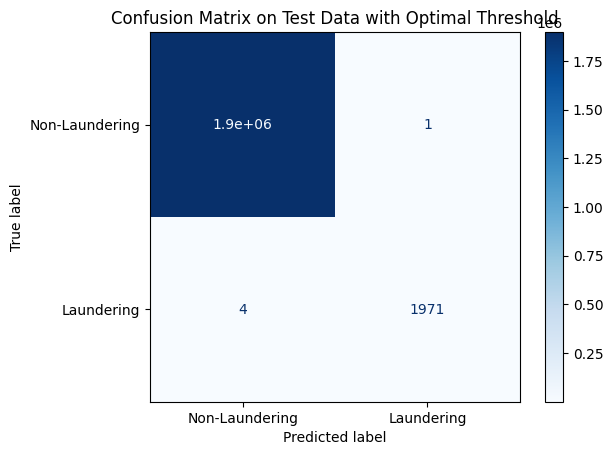

In [ ]:
# Displaying Confusion Matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Laundering", "Laundering"])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix on Test Data with Optimal Threshold")
plt.show()

In [ ]:
# Classification Report
print("\nClassification Report:")
print(classification_report(y_seq_test, y_test_pred, target_names=["Non-Laundering", "Laundering"]))


Classification Report:
                precision    recall  f1-score   support

Non-Laundering       1.00      1.00      1.00   1898995
    Laundering       1.00      1.00      1.00      1975

      accuracy                           1.00   1900970
     macro avg       1.00      1.00      1.00   1900970
  weighted avg       1.00      1.00      1.00   1900970



In [ ]:
# ROC-AUC Score
roc_auc = roc_auc_score(y_seq_test, y_test_prob)
print(f"\nROC-AUC Score on Test Data with applied threshold: {roc_auc:.4f}")


ROC-AUC Score on Test Data with applied threshold: 0.9997


In [ ]:
# Computing ROC curve
fpr, tpr, thresholds = roc_curve(y_seq_test, y_test_prob)

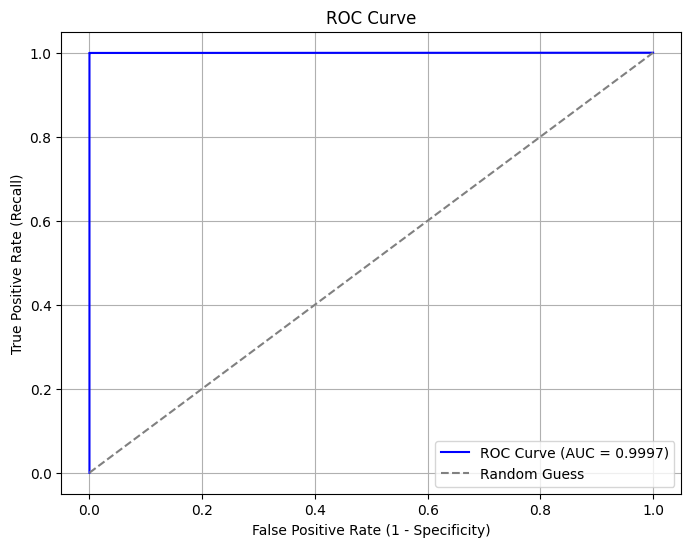

In [ ]:
# Ploting ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
# Computing Precision-Recall curve
precision, recall, thresholds = precision_recall_curve(y_seq_test, y_test_prob)

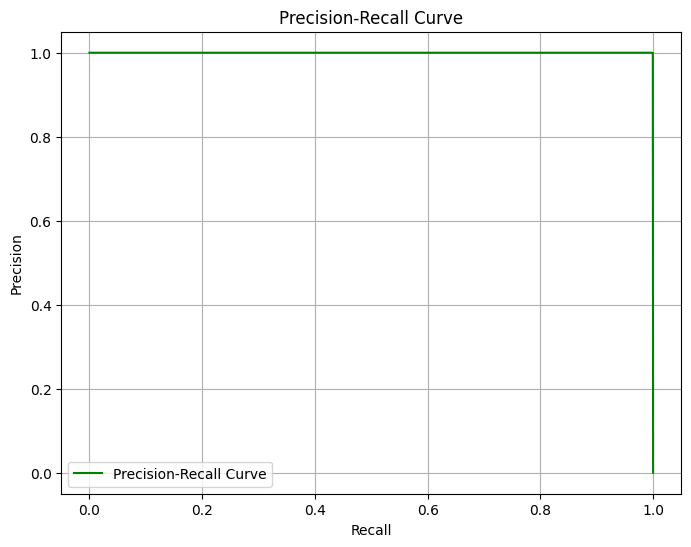

In [ ]:
# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='green', label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)
plt.legend(loc='lower left')
plt.show()

In [ ]:
# Computing confusion matrix as percentages
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

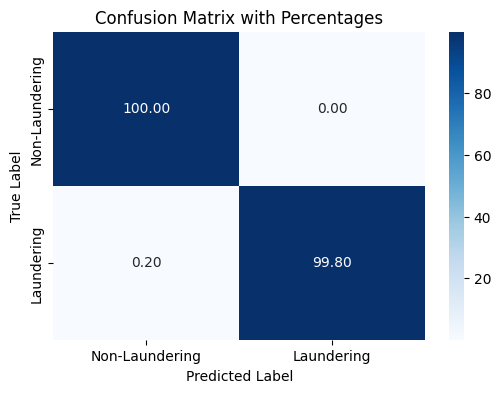

In [ ]:
# Ploting confusion matrix as a heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm_percentage, annot=True, fmt=".2f", cmap="Blues", xticklabels=["Non-Laundering", "Laundering"],
            yticklabels=["Non-Laundering", "Laundering"])
plt.title("Confusion Matrix with Percentages")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

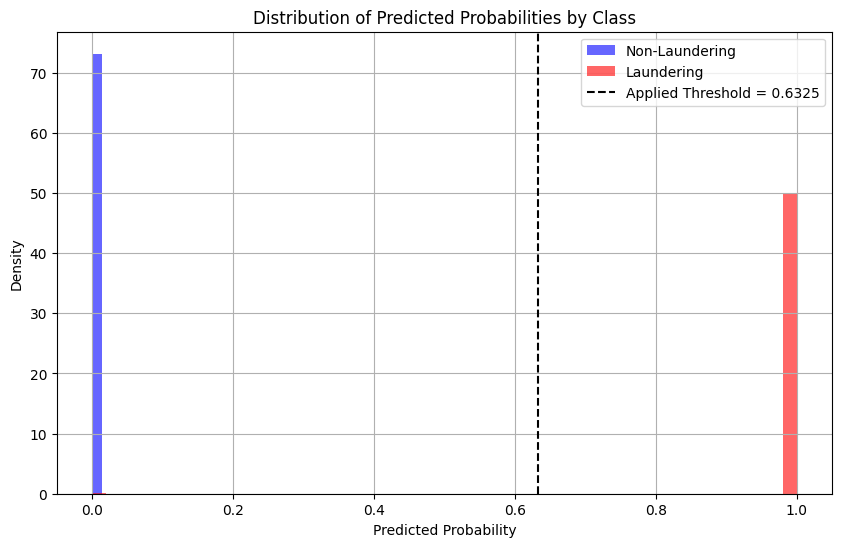

In [ ]:
plt.figure(figsize=(10, 6))

# Plot histograms for both classes
plt.hist(y_test_prob[y_seq_test == 0], bins=50, color='blue', alpha=0.6, label='Non-Laundering', density=True)
plt.hist(y_test_prob[y_seq_test == 1], bins=50, color='red', alpha=0.6, label='Laundering', density=True)

# Add the threshold line
plt.axvline(0.6325, color='black', linestyle='--', label='Applied Threshold = 0.6325')

plt.title('Distribution of Predicted Probabilities by Class')
plt.xlabel('Predicted Probability')
plt.ylabel('Density')
plt.legend()
plt.grid()
plt.show()

# **TCN MODEL WITH ATTENTION LAYER**

Defining Numeric and Categorical Features

In [ ]:
# Numeric features based on quantitative data and engineered metrics
numeric_features = [
    'Sender_account', 'Receiver_account', 'Amount',
    'Sender_account_freq', 'Receiver_account_freq',
    'Sender_avg_amount', 'Receiver_avg_amount',
    'Amount_to_Sender_avg_ratio', 'Amount_to_Receiver_avg_ratio',
    'Transaction_hour', 'Transaction_weekday',
    'Is_large_transaction', 'Is_high_frequency_sender', 'Is_high_frequency_receiver'
]

In [ ]:
# Categorical features with one-hot encoded columns from payment, location, and laundering types
categorical_features = [
    # Payment Currency Features
    'Payment_currency_Albanian lek', 'Payment_currency_Dirham', 'Payment_currency_Euro',
    'Payment_currency_Indian rupee', 'Payment_currency_Mexican Peso',
    'Payment_currency_Moroccan dirham', 'Payment_currency_Naira',
    'Payment_currency_Pakistani rupee', 'Payment_currency_Swiss franc',
    'Payment_currency_Turkish lira', 'Payment_currency_UK pounds',
    'Payment_currency_US dollar', 'Payment_currency_Yen',

    # Received Currency Features
    'Received_currency_Albanian lek', 'Received_currency_Dirham', 'Received_currency_Euro',
    'Received_currency_Indian rupee', 'Received_currency_Mexican Peso',
    'Received_currency_Moroccan dirham', 'Received_currency_Naira',
    'Received_currency_Pakistani rupee', 'Received_currency_Swiss franc',
    'Received_currency_Turkish lira', 'Received_currency_UK pounds',
    'Received_currency_US dollar', 'Received_currency_Yen',

    # Sender Bank Location Features
    'Sender_bank_location_Albania', 'Sender_bank_location_Austria',
    'Sender_bank_location_France', 'Sender_bank_location_Germany',
    'Sender_bank_location_India', 'Sender_bank_location_Italy',
    'Sender_bank_location_Japan', 'Sender_bank_location_Mexico',
    'Sender_bank_location_Morocco', 'Sender_bank_location_Netherlands',
    'Sender_bank_location_Nigeria', 'Sender_bank_location_Pakistan',
    'Sender_bank_location_Spain', 'Sender_bank_location_Switzerland',
    'Sender_bank_location_Turkey', 'Sender_bank_location_UAE',
    'Sender_bank_location_UK', 'Sender_bank_location_USA',

    # Receiver Bank Location Features
    'Receiver_bank_location_Albania', 'Receiver_bank_location_Austria',
    'Receiver_bank_location_France', 'Receiver_bank_location_Germany',
    'Receiver_bank_location_India', 'Receiver_bank_location_Italy',
    'Receiver_bank_location_Japan', 'Receiver_bank_location_Mexico',
    'Receiver_bank_location_Morocco', 'Receiver_bank_location_Netherlands',
    'Receiver_bank_location_Nigeria', 'Receiver_bank_location_Pakistan',
    'Receiver_bank_location_Spain', 'Receiver_bank_location_Switzerland',
    'Receiver_bank_location_Turkey', 'Receiver_bank_location_UAE',
    'Receiver_bank_location_UK', 'Receiver_bank_location_USA',

    # Payment Type Features
    'Payment_type_ACH', 'Payment_type_Cash Deposit', 'Payment_type_Cash Withdrawal',
    'Payment_type_Cheque', 'Payment_type_Credit card', 'Payment_type_Cross-border',
    'Payment_type_Debit card',

    # Laundering Type Features
    'Laundering_type_Behavioural_Change_1', 'Laundering_type_Behavioural_Change_2',
    'Laundering_type_Bipartite', 'Laundering_type_Cash_Withdrawal', 'Laundering_type_Cycle',
    'Laundering_type_Deposit-Send', 'Laundering_type_Fan_In', 'Laundering_type_Fan_Out',
    'Laundering_type_Gather-Scatter', 'Laundering_type_Layered_Fan_In',
    'Laundering_type_Layered_Fan_Out', 'Laundering_type_Normal_Cash_Deposits',
    'Laundering_type_Normal_Cash_Withdrawal', 'Laundering_type_Normal_Fan_In',
    'Laundering_type_Normal_Fan_Out', 'Laundering_type_Normal_Foward',
    'Laundering_type_Normal_Group', 'Laundering_type_Normal_Mutual',
    'Laundering_type_Normal_Periodical', 'Laundering_type_Normal_Plus_Mutual',
    'Laundering_type_Normal_Small_Fan_Out', 'Laundering_type_Normal_single_large',
    'Laundering_type_Over-Invoicing', 'Laundering_type_Scatter-Gather',
    'Laundering_type_Single_large', 'Laundering_type_Smurfing',
    'Laundering_type_Stacked Bipartite', 'Laundering_type_Structuring'
]

In [ ]:
# Separation of features and target
X_numeric = df[numeric_features].values
X_categorical = df[categorical_features].values
y = df['Is_laundering'].values


In [ ]:
# Scaling numeric features
scaler = StandardScaler()
X_numeric_scaled = scaler.fit_transform(X_numeric)


In [ ]:
# Reshaping numeric data for Conv1D input (timesteps=1)
X_numeric_scaled = X_numeric_scaled.reshape((X_numeric_scaled.shape[0], X_numeric_scaled.shape[1], 1))

In [ ]:
# Spliting data
X_numeric_train, X_numeric_test, X_categorical_train, X_categorical_test, y_train, y_test = train_test_split(
    X_numeric_scaled, X_categorical, y, test_size=0.3, random_state=42
)

In [ ]:
# TCN-Attention model Architecture
def TCN_with_attention(input_shape_numeric, input_shape_categorical):
    # Define numeric input and convolutional layers
    numeric_input = Input(shape=(input_shape_numeric, 1))  # Adjusted shape for Conv1D
    conv_layer = Conv1D(64, kernel_size=2, activation='relu')(numeric_input)
    conv_output = GlobalAveragePooling1D()(conv_layer)

    # Define categorical input
    categorical_input = Input(shape=(input_shape_categorical,))

    # Concatenated features
    concatenated = concatenate([conv_output, categorical_input])

    # Attention layer
    attention = Attention()([concatenated, concatenated])
    dense_layer = Dense(64, activation='relu')(attention)
    dropout = Dropout(0.3)(dense_layer)
    output = Dense(1, activation='sigmoid')(dropout)

    model = Model(inputs=[numeric_input, categorical_input], outputs=output)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model


In [ ]:
# Initializing and compiling the model
model = TCN_with_attention(input_shape_numeric=X_numeric_train.shape[1], input_shape_categorical=X_categorical_train.shape[1])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 14, 1)]              0         []                            
                                                                                                  
 conv1d (Conv1D)             (None, 13, 64)               192       ['input_1[0][0]']             
                                                                                                  
 global_average_pooling1d (  (None, 64)                   0         ['conv1d[0][0]']              
 GlobalAveragePooling1D)                                                                          
                                                                                                  
 input_2 (InputLayer)        [(None, 97)]                 0         []                        

In [ ]:
 # Training the model
history = model.fit(
    [X_numeric_train, X_categorical_train], y_train,
    validation_data=([X_numeric_test, X_categorical_test], y_test),
    epochs=20, batch_size=128, verbose=1
)

Epoch 1/20
51980/51980 [==============================] - 229s 4ms/step - loss: 0.0036 - accuracy: 0.9994 - val_loss: 1.7301e-04 - val_accuracy: 0.9999
Epoch 2/20
51980/51980 [==============================] - 228s 4ms/step - loss: 2.3923e-04 - accuracy: 1.0000 - val_loss: 4.7972e-05 - val_accuracy: 1.0000
Epoch 3/20
51980/51980 [==============================] - 223s 4ms/step - loss: 1.8794e-04 - accuracy: 1.0000 - val_loss: 5.4733e-05 - val_accuracy: 1.0000
Epoch 4/20
51980/51980 [==============================] - 226s 4ms/step - loss: 1.2827e-04 - accuracy: 1.0000 - val_loss: 3.4337e-05 - val_accuracy: 1.0000
Epoch 5/20
51980/51980 [==============================] - 222s 4ms/step - loss: 1.7252e-04 - accuracy: 1.0000 - val_loss: 2.5435e-05 - val_accuracy: 1.0000
Epoch 6/20
51980/51980 [==============================] - 231s 4ms/step - loss: 1.6675e-04 - accuracy: 1.0000 - val_loss: 2.8852e-05 - val_accuracy: 1.0000
Epoch 7/20
51980/51980 [==============================] - 227s 4ms/s

In [ ]:
# Evaluating the model
loss, accuracy = model.evaluate([X_numeric_test, X_categorical_test], y_test)
print(f"Test Loss: {loss:.4f}, Test Accuracy: {accuracy:.4f}")

89108/89108 [==============================] - 129s 1ms/step - loss: 0.0182 - accuracy: 0.9973
Test Loss: 0.0182, Test Accuracy: 0.9973


Evaluation Metrics

In [ ]:
# Importing metrics libraries
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Generating predictions
y_pred = (model.predict([X_numeric_test, X_categorical_test]) > 0.5).astype("int32")


89108/89108 [==============================] - 117s 1ms/step


In [ ]:
# Evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)


In [ ]:
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUC: {auc:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))



Accuracy: 0.9973
Precision: 0.2758
Recall: 0.9993
F1 Score: 0.4323
AUC: 0.9983

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   2848551
           1       0.28      1.00      0.43      2905

    accuracy                           1.00   2851456
   macro avg       0.64      1.00      0.72   2851456
weighted avg       1.00      1.00      1.00   2851456



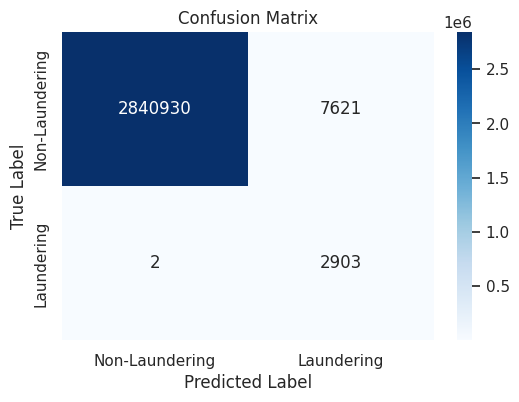

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Non-Laundering", "Laundering"], yticklabels=["Non-Laundering", "Laundering"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

**MODEL TUNING | THRESHOLD ADJUSTMENT**

 Best Threshold value = 0.97

In [ ]:
# Adjusting the threshold for improved precision
threshold = 0.97
y_pred_proba = model.predict([X_numeric_test, X_categorical_test])
y_pred_adjusted = (y_pred_proba >= threshold).astype(int)



89108/89108 [==============================] - 119s 1ms/step


In [ ]:
# Calculating evaluation metrics
adjusted_accuracy = accuracy_score(y_test, y_pred_adjusted)
adjusted_precision = precision_score(y_test, y_pred_adjusted)
adjusted_recall = recall_score(y_test, y_pred_adjusted)
adjusted_f1 = f1_score(y_test, y_pred_adjusted)
adjusted_auc = roc_auc_score(y_test, y_pred_proba)





Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00   2848551
           1       0.32      1.00      0.48      2905

    accuracy                           1.00   2851456
   macro avg       0.66      1.00      0.74   2851456
weighted avg       1.00      1.00      1.00   2851456



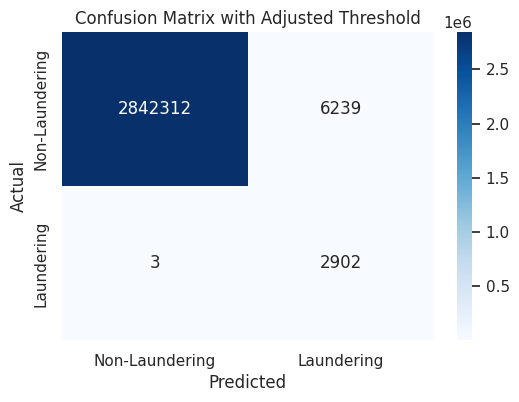

Accuracy: 0.9973266289222068
Precision: 0.2758456860509312
Recall: 0.9993115318416523
F1 Score: 0.4323479037903046
AUC: 0.9983180682633154


In [ ]:
# Classification report
print("Classification Report:\n", classification_report(y_test, y_pred_adjusted))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_adjusted)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Laundering', 'Laundering'], yticklabels=['Non-Laundering', 'Laundering'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix with Adjusted Threshold')
plt.show()

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("AUC:", auc)